In [1]:
library(dlnm)
library(mgcv)
#library(dlmtree)
library(data.table)
library(plotly)
library(ggplot2)
library(parallel)
library(doParallel)
library(foreach)
library(coda)
library(lubridate)
library(xts)
library(timetk)
library(forecast)
library(gridExtra)
library(tidyr)
library(dplyr)
library(Hmisc)
library(xtable)

This is dlnm 2.4.7. For details: help(dlnm) and vignette('dlnmOverview').

Loading required package: nlme

This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

Loading required package: ggplot2


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout


Loading required package: foreach

Loading required package: iterators


Attaching package: 'lubridate'


The following objects are masked from 'package:data.table':

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


The following objects are masked from 'package:base':

    date, intersect, setdiff, union


Loading required package: zoo


Attaching package: 'zoo'


The following objects are masked from 'package:base':

    as.Date, as.Date.numeric



Attaching package: 'xts'


The following objects are masked fro

# DLNM

In [2]:
environment <- read.csv("/Users/gabrielazemencikova/Desktop/AMI-catalonia/project/card_var_pol_stat_data_at.csv")
colnames(environment)[1:18] = c('at_code','date','max_hum','min_hum','max_temp','min_temp','eveAMI','a_rolling_week','expected','a_asir_90','b_asir_365','pop_value','daily_diff_temp','daily_diff_hum','maximum_temperature_change','minimum_temperature_change','maximum_relative_humidity_change','minimum_relative_humidity_change')

environment$date <- as.Date(environment$date)
environment$dow <- weekdays(environment$date)
environment$day <- format(environment$date, "%d")
environment$month <- format(environment$date, "%m")
environment$year <- format(environment$date, "%y")
environment$doy <- as.numeric(format(environment$date, "%j"))

# Function to categorize each month into a season
categorize_season <- function(month) {
  if (month %in% c("05", "06", "07", "08", "09", "10")) {
    return("Summer")
  } else {
    return("Winter")
  }
}

# Add a new column "season" to the environmeAMIet based on the month
environment$season <- sapply(environment$month, categorize_season)


In [3]:
colnames(data)

NULL

## AT03

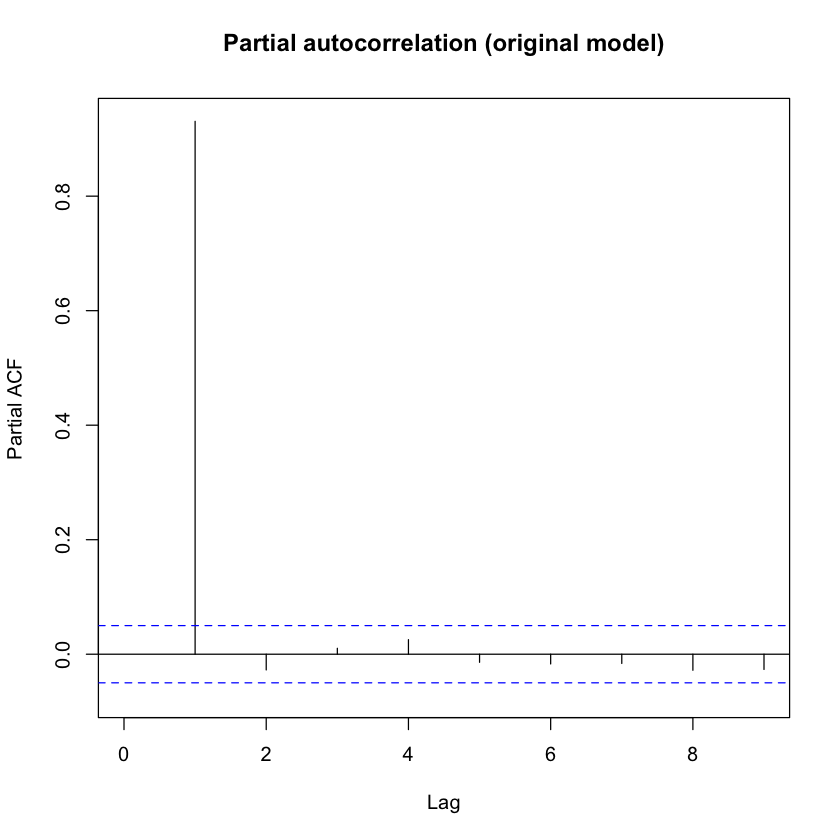

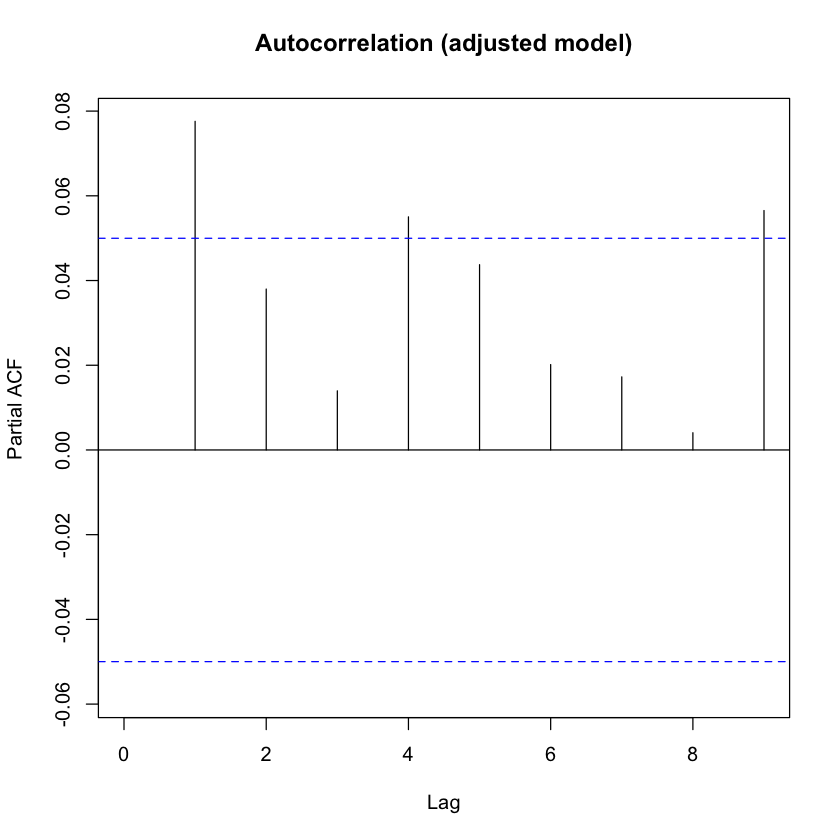

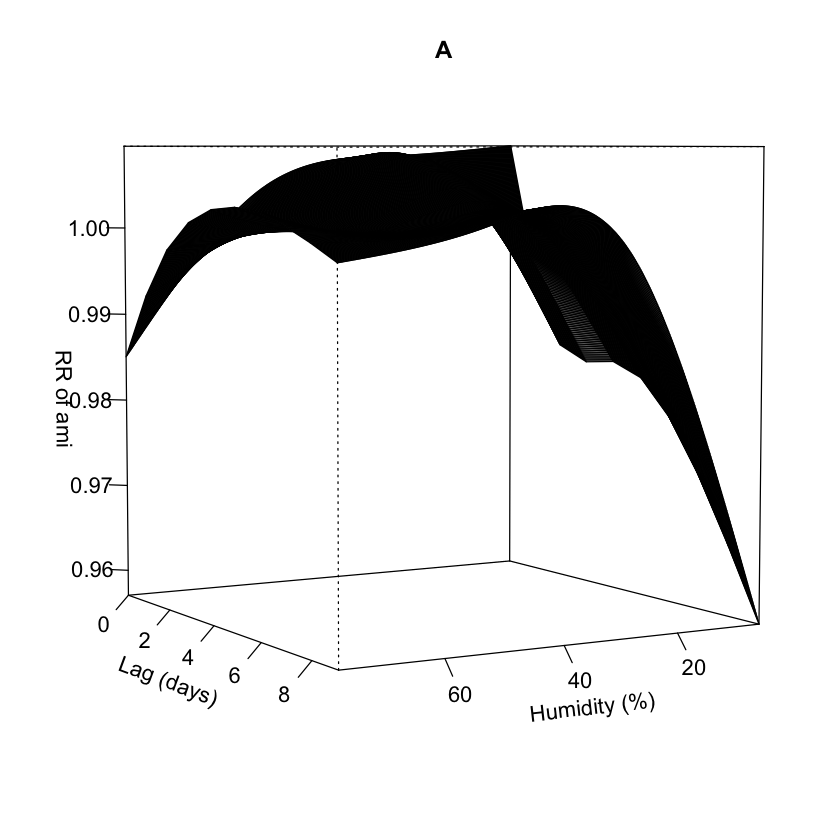

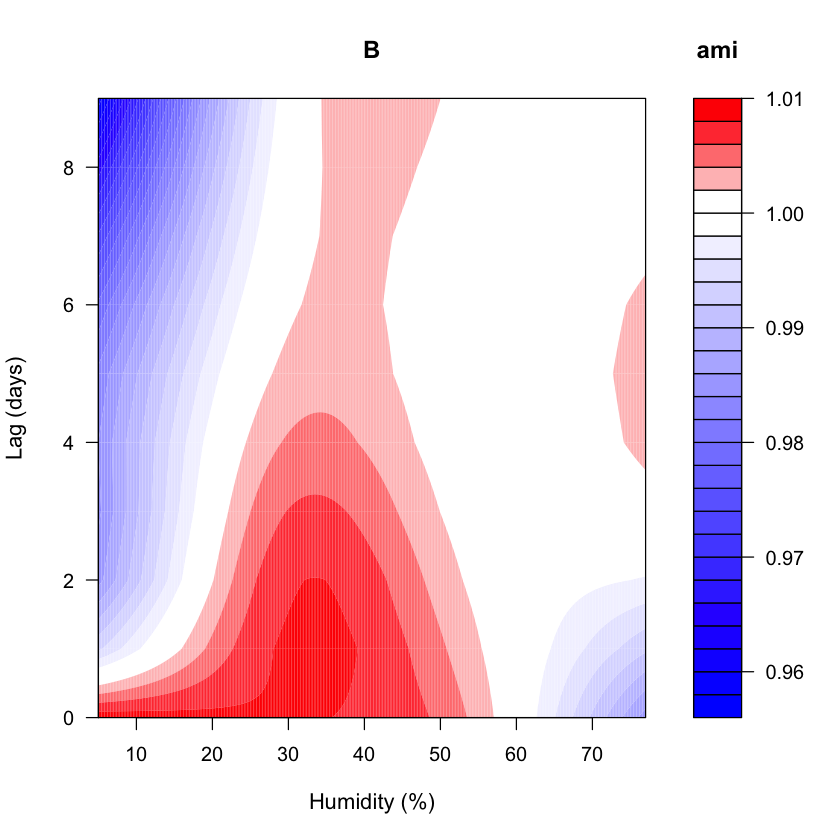

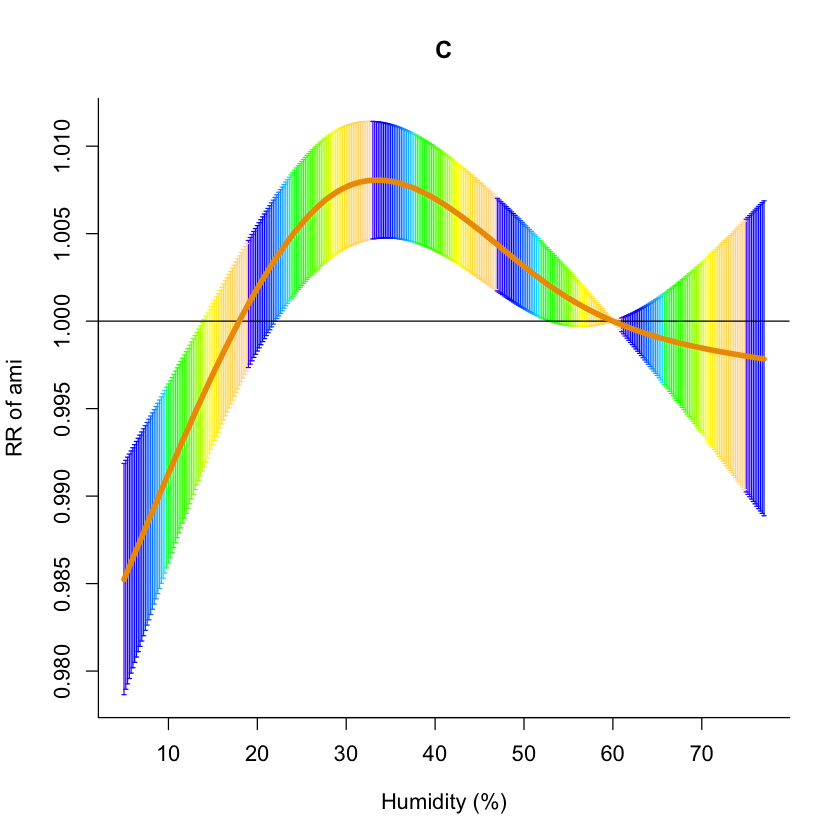

...

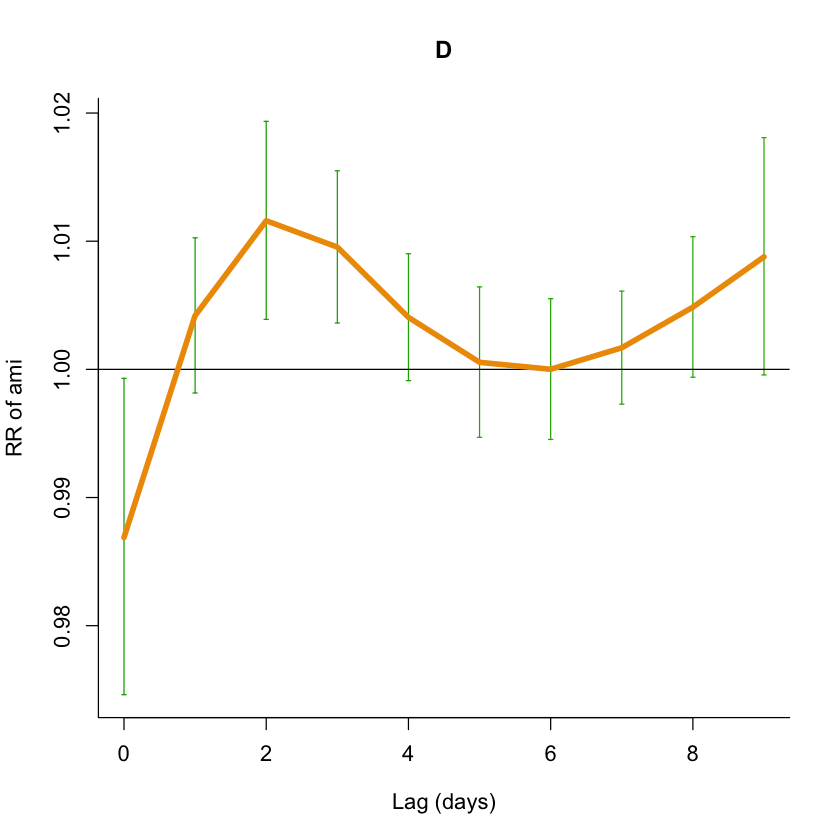

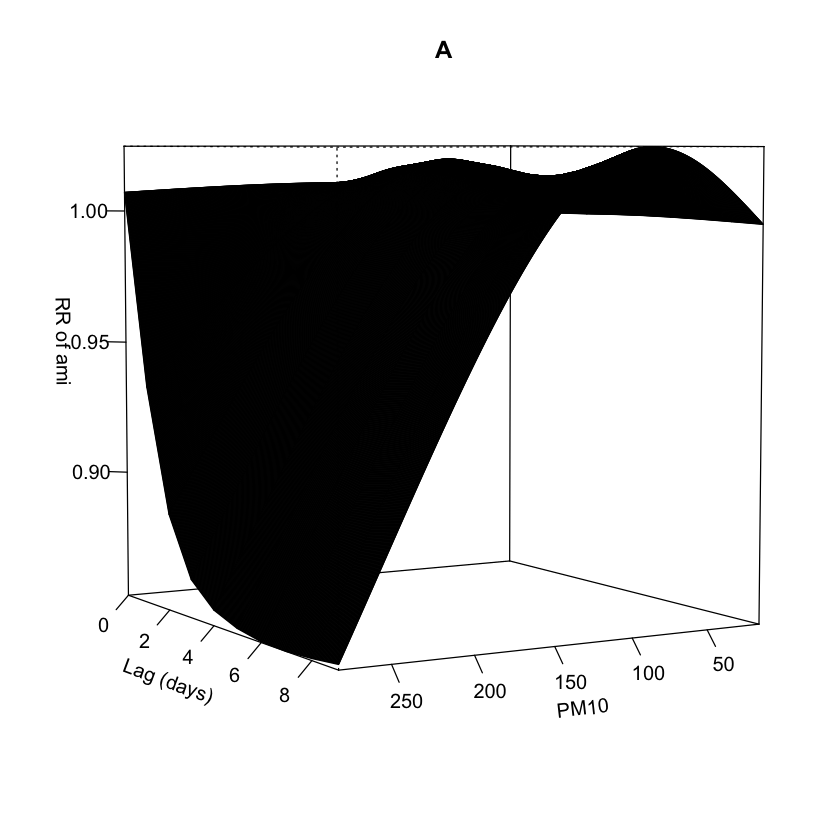

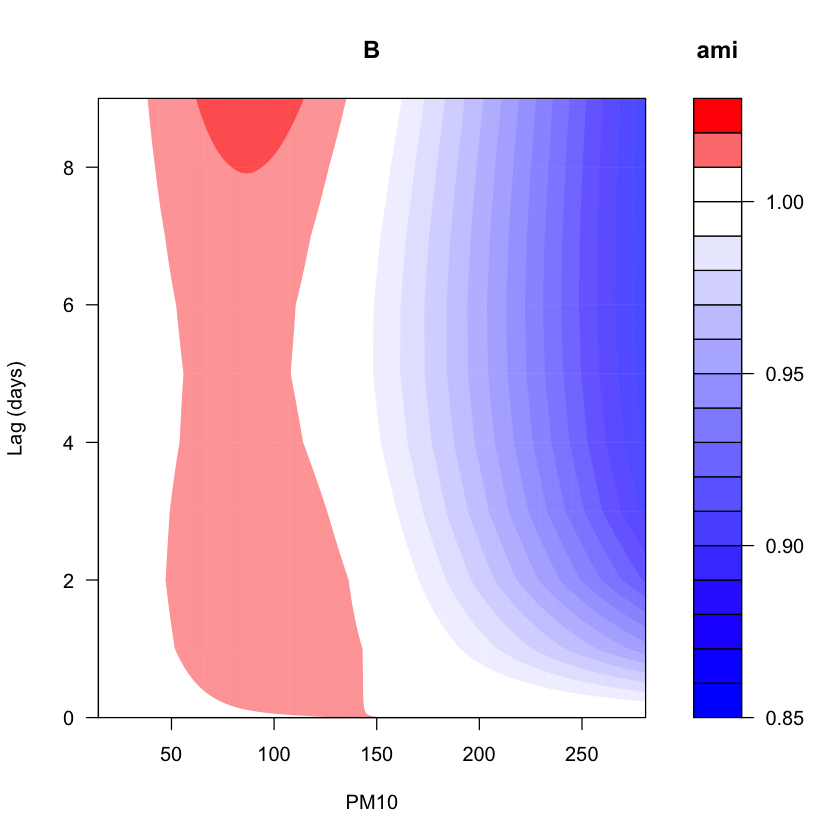

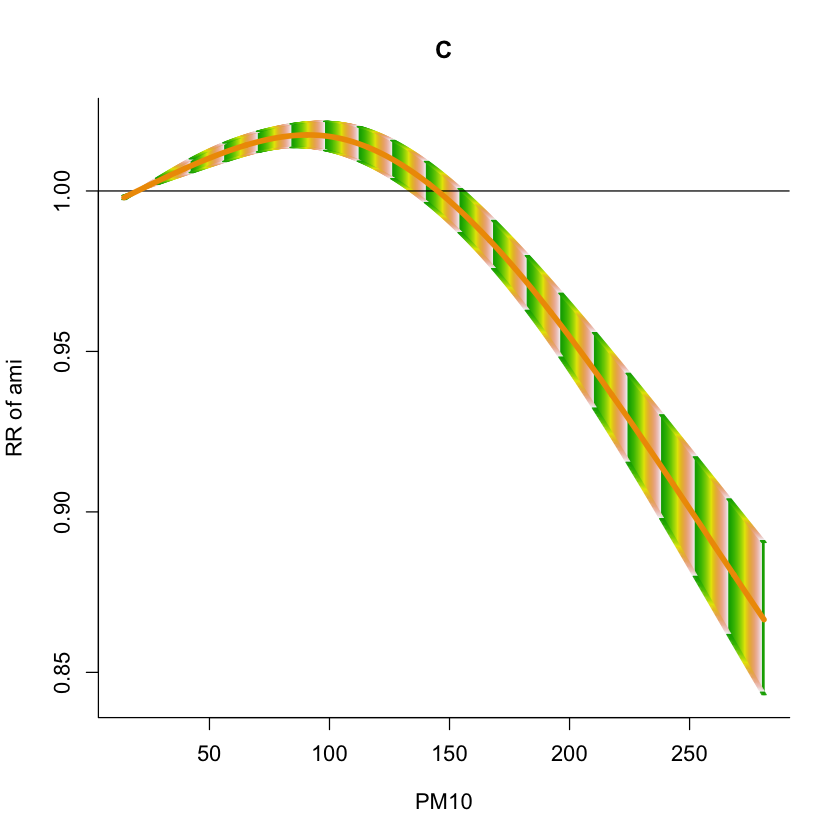

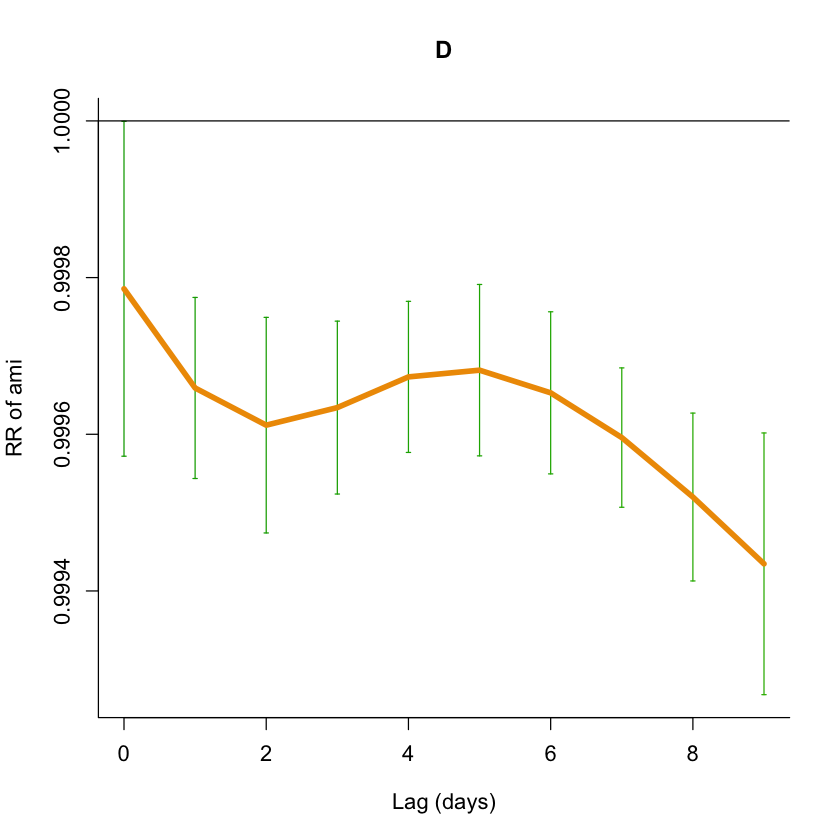

In [4]:
# AT01
at_code = 'AT03'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Winter",]

k = 3
i = 4
lags = 9
family = quasipoisson()

lagknots <- logknots(14, fun="ns", df=i)

varknots.hum = equalknots(data$min_hum, fun="ns", df=k)
varknots.t = equalknots(data$max_temp, fun="ns", df=k)
varknots.o3 = equalknots(data$max_O3, fun="ns", df=k)
varknots.pm10 = equalknots(data$max_PM10, fun="ns", df=k)

mo.cb.hum <- crossbasis(data$min_hum, lag = lags, argvar=list(fun="ns", knots = varknots.hum), arglag=list(knots = lagknots))
mo.cb.temp <- crossbasis(data$max_temp, lag = lags, argvar=list(fun="ns", knots=varknots.t), arglag=list(knots = lagknots))
mo.cb.03 <- crossbasis(data$max_O3, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))
mo.cb.pm10 <- crossbasis(data$max_PM10, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))

ami.modelH <- glm(data$a_asir_90 ~ mo.cb.hum + year + month + is_holiday + dow, family = family, na.action = na.delete, data)
ami.modelT <- glm(data$a_asir_90 ~ mo.cb.temp + year + month + is_holiday + dow, family = family, na.action = na.delete, data)
ami.modelP <- glm(data$a_asir_90 ~ mo.cb.03 + year + month + is_holiday + dow, family = family, na.action = na.delete, data)
ami.modelP1 <- glm(data$a_asir_90 ~ mo.cb.pm10 + year + month + is_holiday + dow, family = family, na.action = na.delete, data)
ami.model <-  glm(data$a_asir_90 ~ mo.cb.hum + mo.cb.temp + mo.cb.03 + mo.cb.pm10 + year + month + is_holiday, family = family, na.action = na.delete, data)

# summary(mo.cb.hum)
# summary(mo.cb.temp)
# summary(mo.cb.03)
# summary(mo.cb.pm10)

pacf(residuals(ami.model,type="deviance"),na.action=na.omit,main="Partial autocorrelation (original model)",xlim=c(0,lags))
mo.model.iami <- update(ami.model,.~.+Lag(residuals(ami.model,type="deviance"),1)) #add residuals at lag 1 to significantly reduce partial autocorrelation
pacf(residuals(mo.model.iami,type="deviance"),na.action=na.omit,main="Autocorrelation (adjusted model)",xlim=c(0,lags))
#model predictions
mo.pred.hum.iami <- crosspred(mo.cb.hum, mo.model.iami, cen = 60, by=0.2)
mo.pred.temp.iami <- crosspred(mo.cb.temp, mo.model.iami, cen = 23, by=0.2)
mo.pred.pol.iami <- crosspred(mo.cb.03, mo.model.iami, cen = 60, by=0.2)
mo.pred.pol1.iami <- crosspred(mo.cb.pm10, mo.model.iami, cen = 20, by=0.2)

#3D, countour, curve plots for Humidity
plot(mo.pred.hum.iami, xlab="Humidity (%)", ylab="Lag (days)", zlab="RR of ami", theta=150, phi=5, lphi=100, cex.lab=1.1, cex.axis=1.1, col="gray80",main="A")
plot(mo.pred.hum.iami, "contour", key.title=title("ami"), plot.title=title("B", xlab ="Humidity (%)", ylab = "Lag (days)", cex.lab=1.1, cex.axis=1.1))
plot(mo.pred.hum.iami, "slices", xlab="Humidity (%)", lag=c(2), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.hum.iami, "slices", xlab="Lag (days)", var=c(9), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for temperature
plot(mo.pred.temp.iami, xlab="Temperature (°C)", ylab="Lag (days)", zlab="RR of ami", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.temp.iami, "contour", key.title=title("ami"), plot.title=title("B", xlab ="Temperature (°C)", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.temp.iami, xlab="Temperature (°C)", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.temp.iami, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for Ozone
plot(mo.pred.pol.iami, xlab="Ozone", ylab="Lag (days)", zlab="RR of ami", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol.iami, "contour", key.title=title("ami"), plot.title=title("B", xlab ="Ozone", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol.iami, xlab="Ozone", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.pol.iami, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for PM10
plot(mo.pred.pol1.iami, xlab="PM10", ylab="Lag (days)", zlab="RR of ami", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol1.iami, "contour", key.title=title("ami"), plot.title=title("B", xlab ="PM10", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol1.iami, xlab="PM10", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.pol1.iami, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of ami", cex.lab=1.1, cex.axis=1.1,main="D")


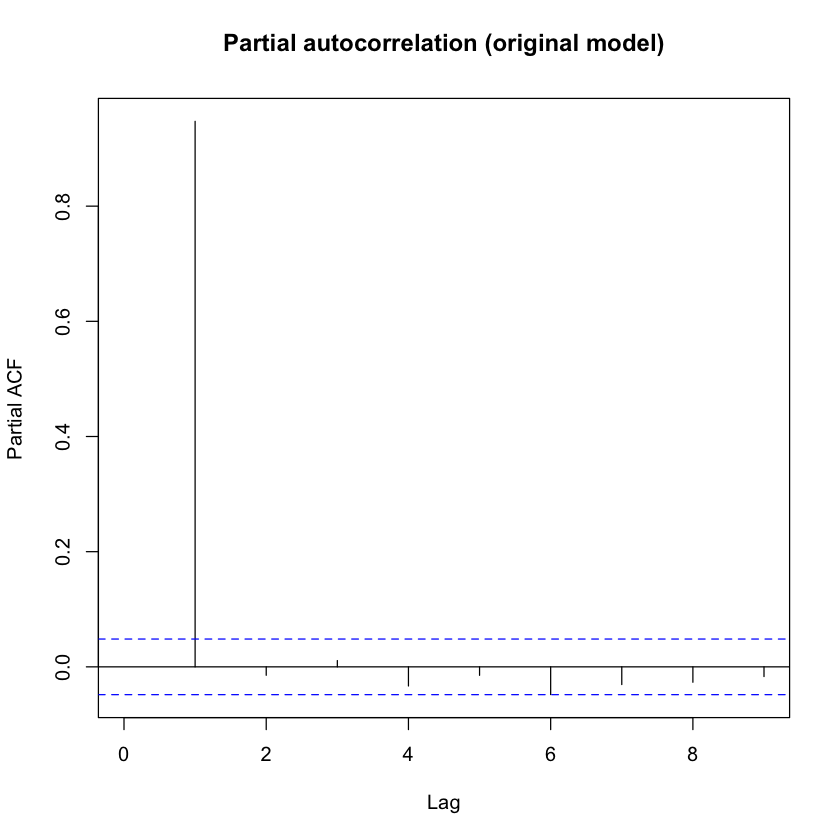

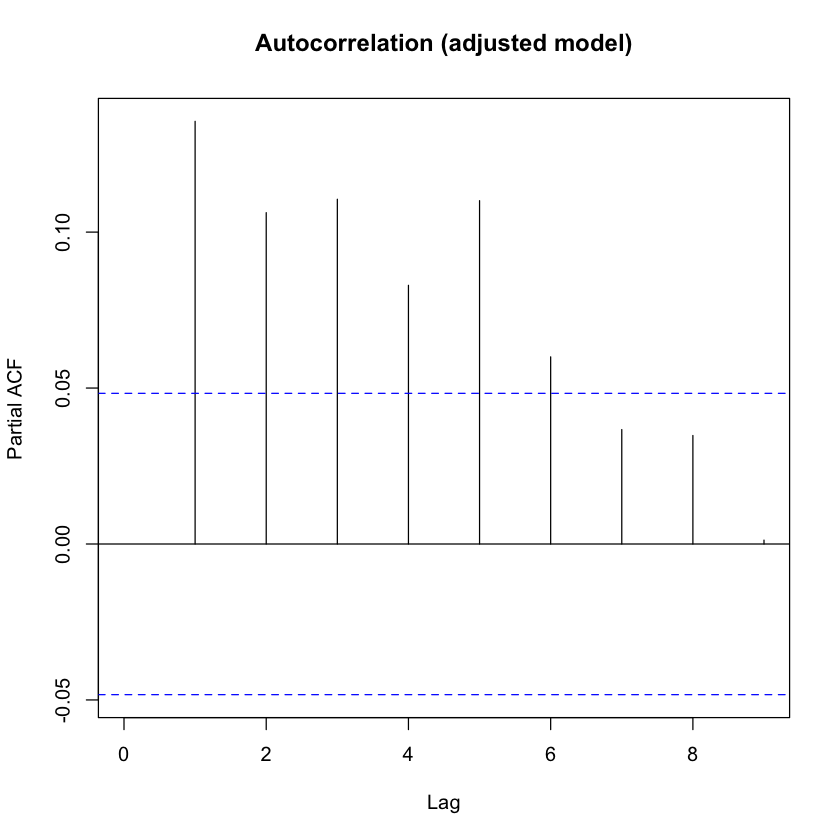

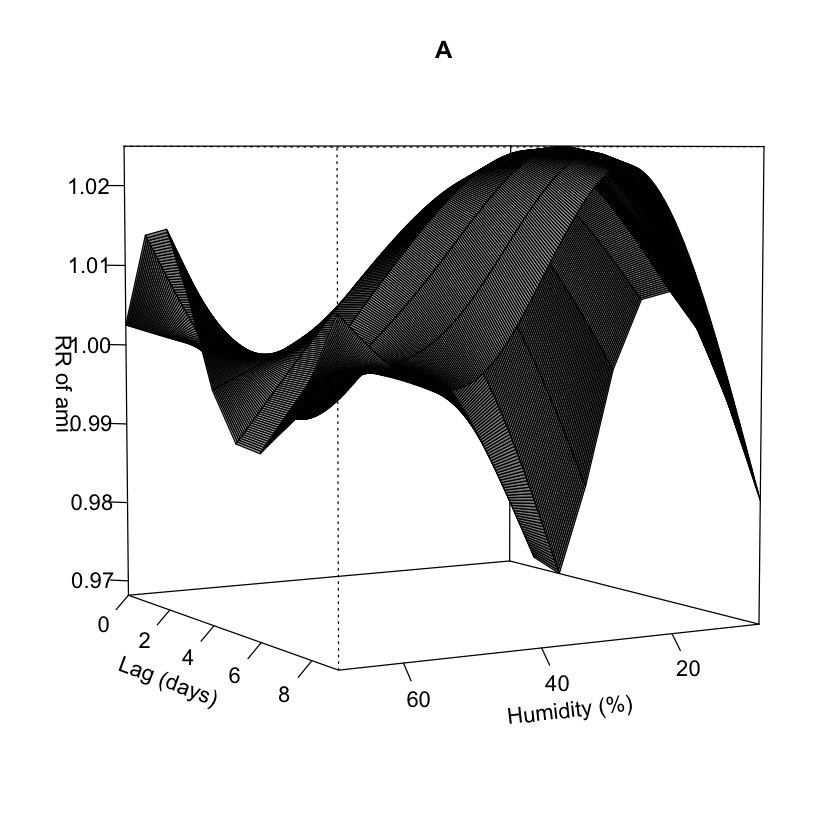

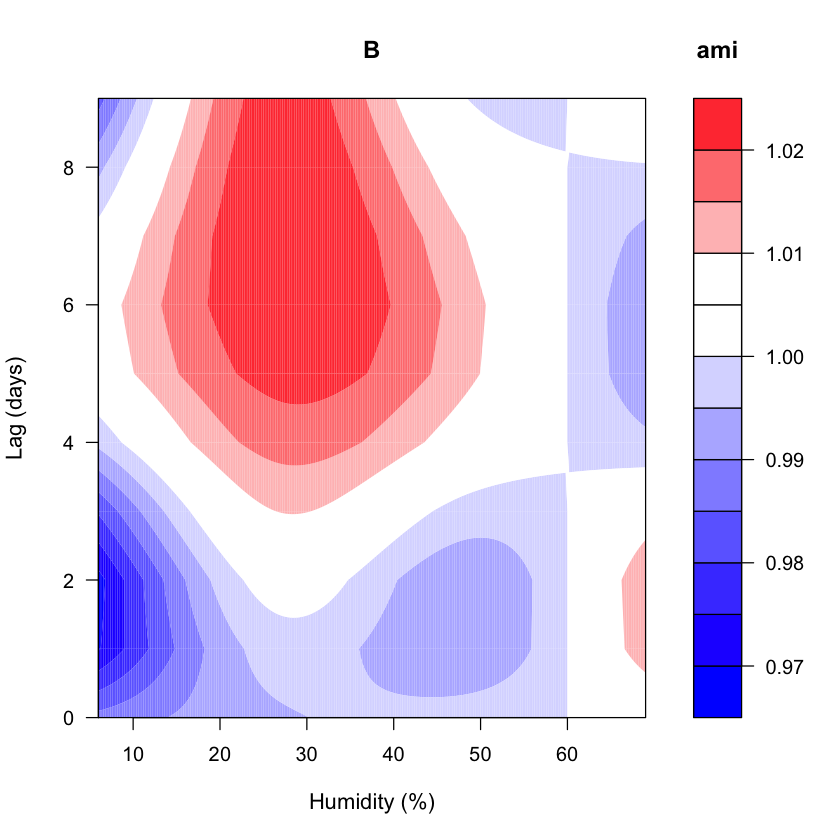

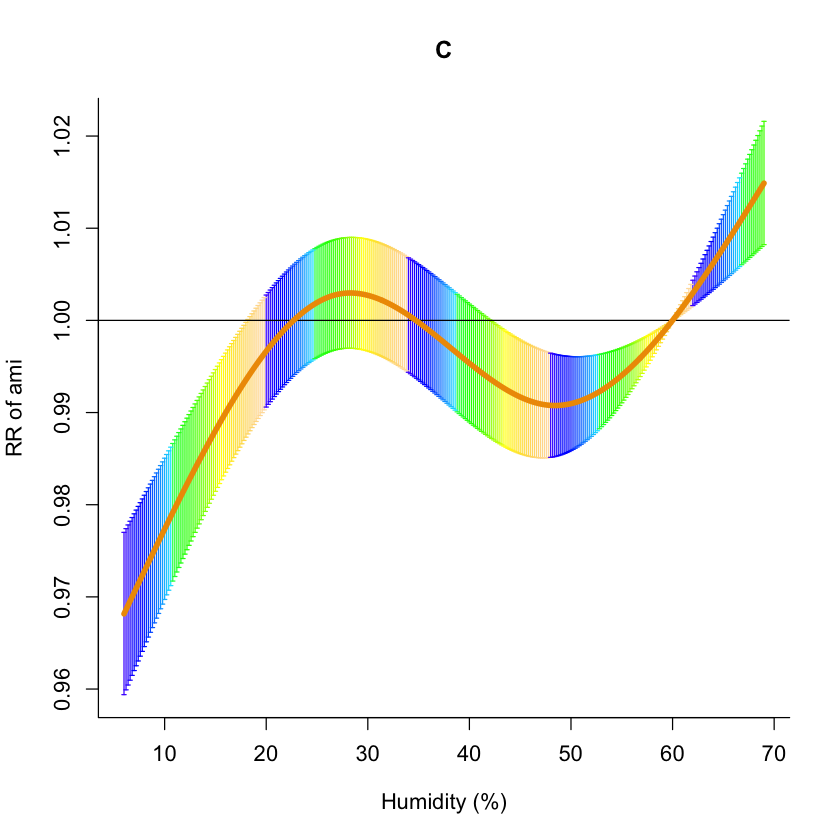

...

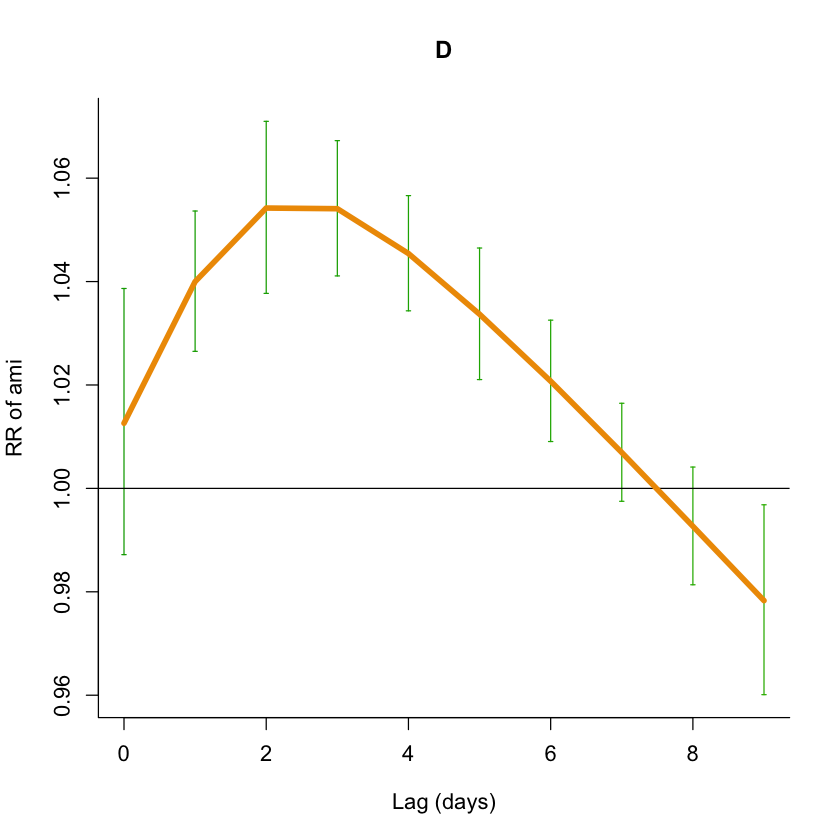

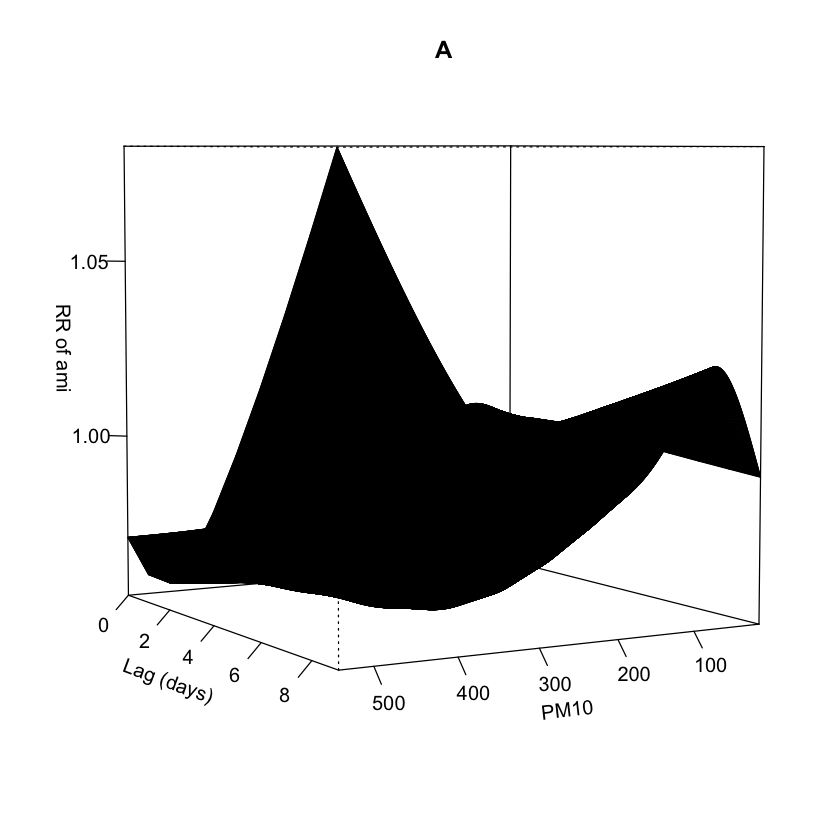

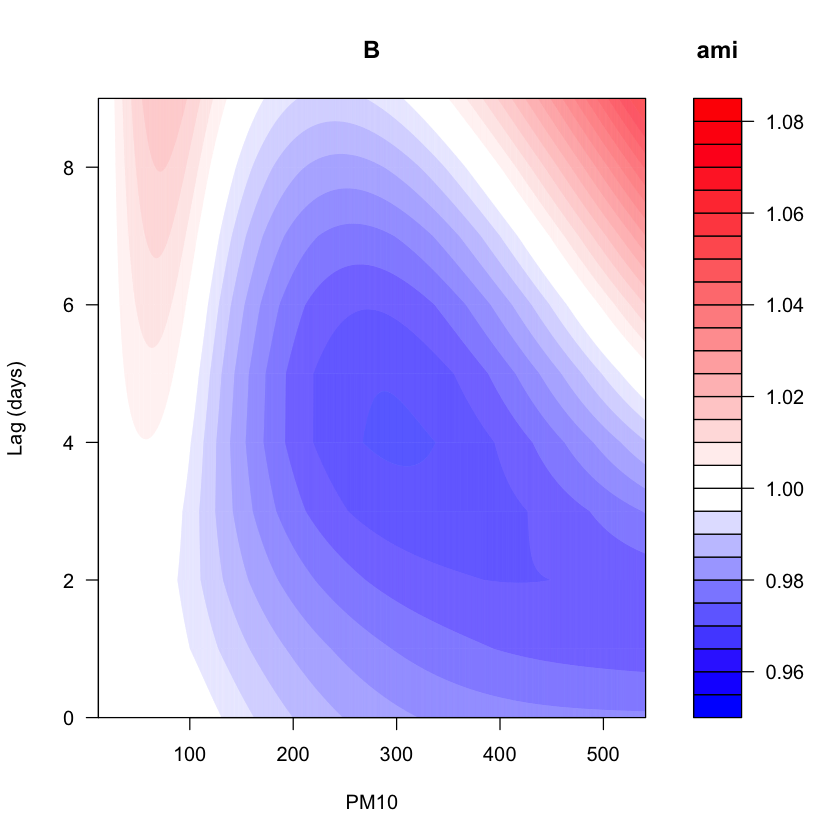

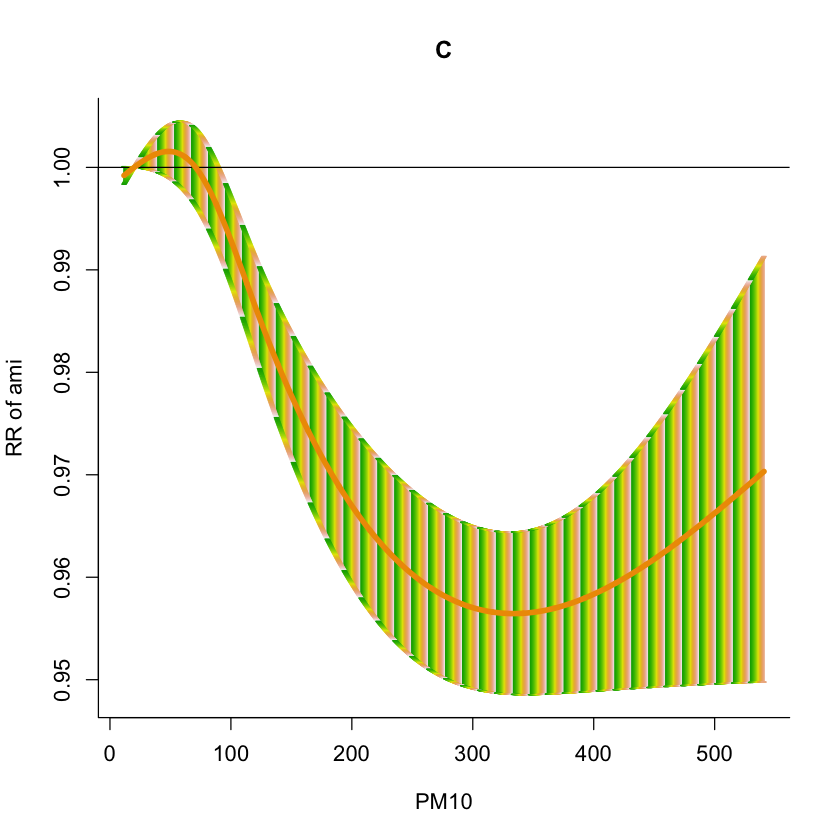

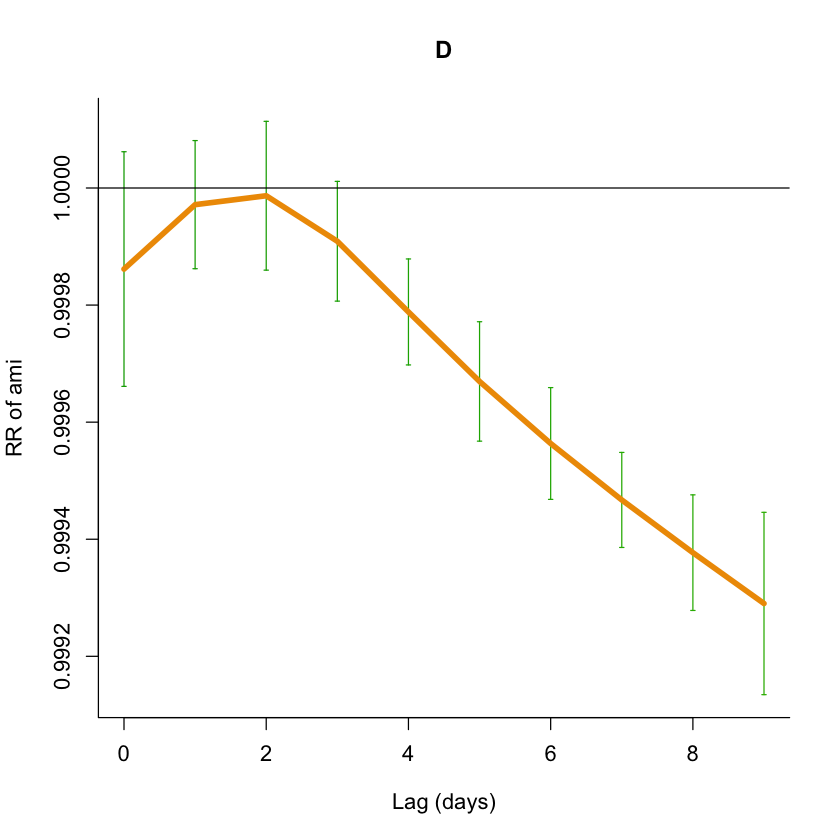

In [5]:
at_code = 'AT03'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Summer",]

k = 3
i = 4
lags = 9
fAMIly = quasipoisson()

lagknots <- logknots(14, fun="ns", df=i)

varknots.hum = equalknots(data$min_hum, fun="ns", df=k)
varknots.t = equalknots(data$max_temp, fun="ns", df=k)
varknots.o3 = equalknots(data$max_O3, fun="ns", df=k)
varknots.pm10 = equalknots(data$max_PM10, fun="ns", df=k)

mo.cb.hum <- crossbasis(data$min_hum, lag = lags, argvar=list(fun="ns", knots = varknots.hum), arglag=list(knots = lagknots))
mo.cb.temp <- crossbasis(data$max_temp, lag = lags, argvar=list(fun="ns", knots=varknots.t), arglag=list(knots = lagknots))
mo.cb.03 <- crossbasis(data$max_O3, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))
mo.cb.pm10 <- crossbasis(data$max_PM10, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))

AMI.modelH <- glm(data$a_asir_90 ~ mo.cb.hum + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelT <- glm(data$a_asir_90 ~ mo.cb.temp + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP <- glm(data$a_asir_90 ~ mo.cb.03 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP1 <- glm(data$a_asir_90 ~ mo.cb.pm10 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.model <-  glm(data$a_asir_90 ~ mo.cb.hum + mo.cb.temp + mo.cb.03 + mo.cb.pm10 + year + month + is_holiday, fAMIly = fAMIly, na.action = na.delete, data)

# summary(mo.cb.hum)
# summary(mo.cb.temp)
# summary(mo.cb.03)
# summary(mo.cb.pm10)

pacf(residuals(AMI.model,type="deviance"),na.action=na.omit,main="Partial autocorrelation (original model)",xlim=c(0,lags))
mo.model.iAMI <- update(AMI.model,.~.+Lag(residuals(AMI.model,type="deviance"),1)) #add residuals at lag 1 to significantly reduce partial autocorrelation
pacf(residuals(mo.model.iAMI,type="deviance"),na.action=na.omit,main="Autocorrelation (adjusted model)",xlim=c(0,lags))
#model predictions
mo.pred.hum.iAMI <- crosspred(mo.cb.hum, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.temp.iAMI <- crosspred(mo.cb.temp, mo.model.iAMI, cen = 23, by=0.2)
mo.pred.pol.iAMI <- crosspred(mo.cb.03, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.pol1.iAMI <- crosspred(mo.cb.pm10, mo.model.iAMI, cen = 20, by=0.2)

#3D, countour, curve plots for Humidity
plot(mo.pred.hum.iAMI, xlab="Humidity (%)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1.1, cex.axis=1.1, col="gray80",main="A")
plot(mo.pred.hum.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Humidity (%)", ylab = "Lag (days)", cex.lab=1.1, cex.axis=1.1))
plot(mo.pred.hum.iAMI, "slices", xlab="Humidity (%)", lag=c(2), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.hum.iAMI, "slices", xlab="Lag (days)", var=c(9), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for temperature
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.temp.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Temperature (°C)", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.temp.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for Ozone
plot(mo.pred.pol.iAMI, xlab="Ozone", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Ozone", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol.iAMI, xlab="Ozone", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.pol.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for PM10
plot(mo.pred.pol1.iAMI, xlab="PM10", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol1.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="PM10", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol1.iAMI, xlab="PM10", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.pol1.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


## AT01

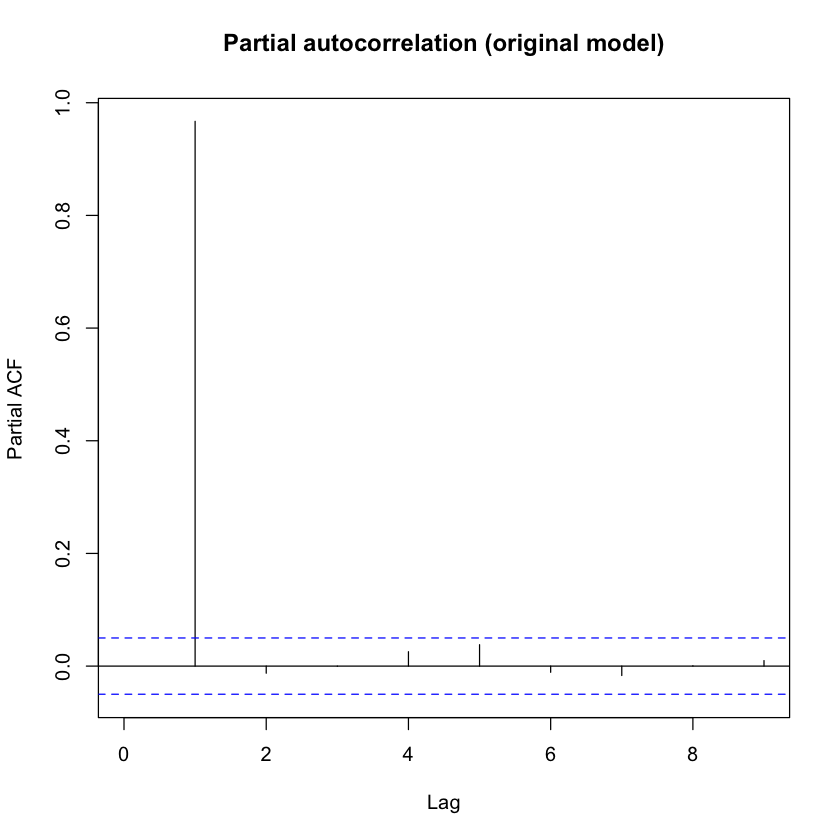

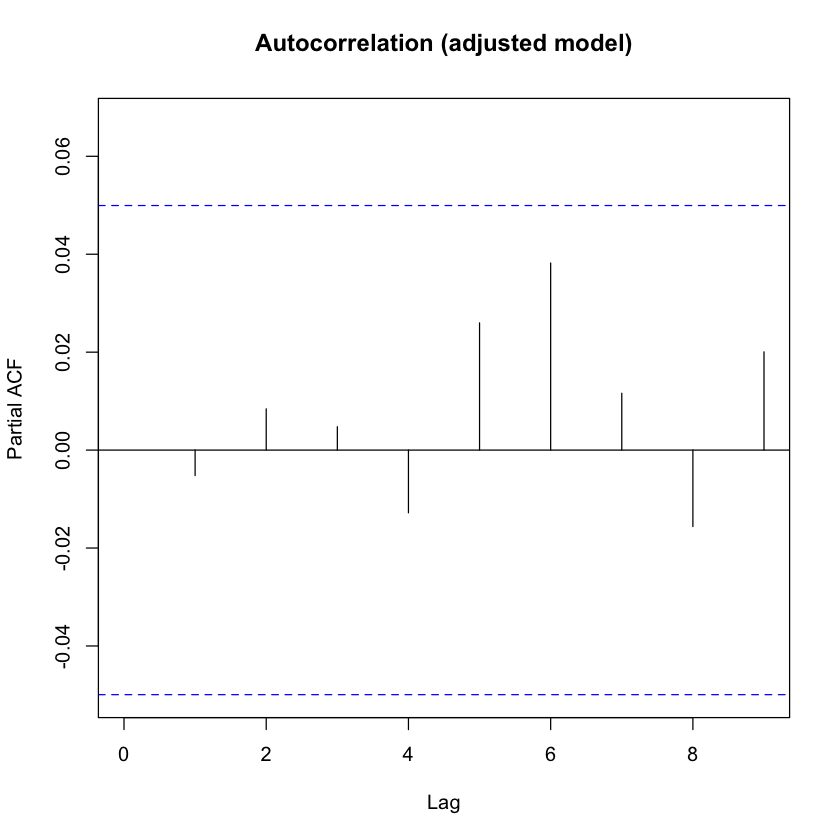

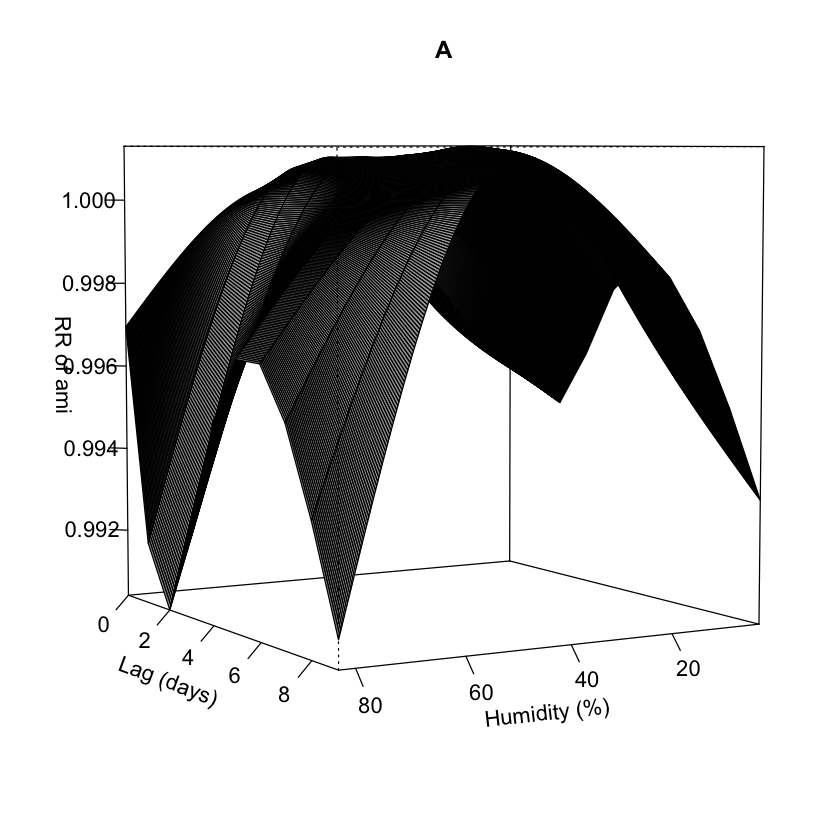

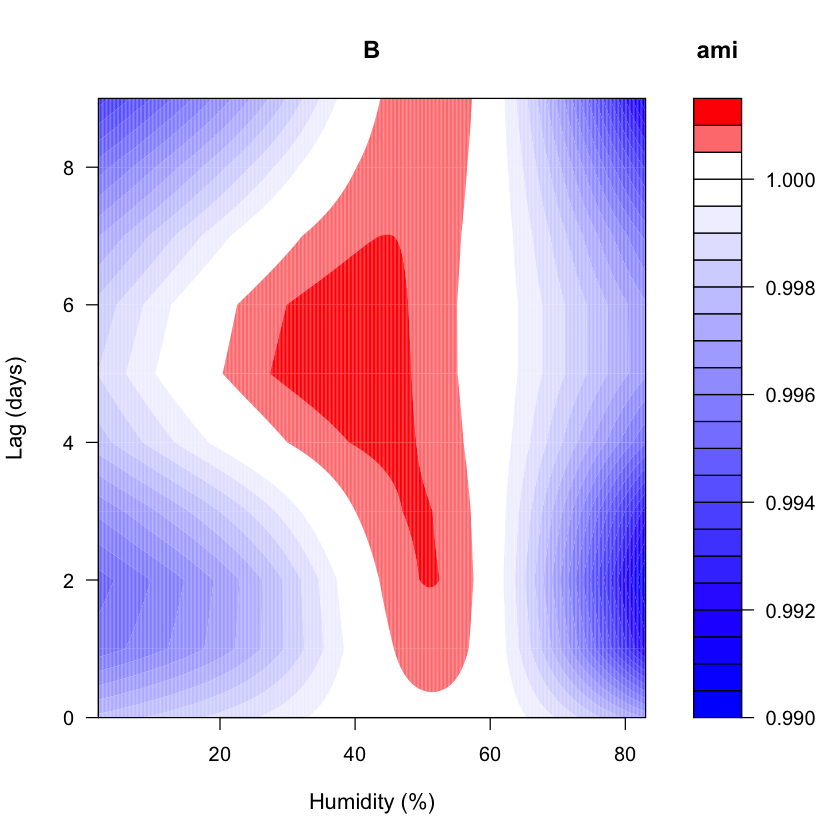

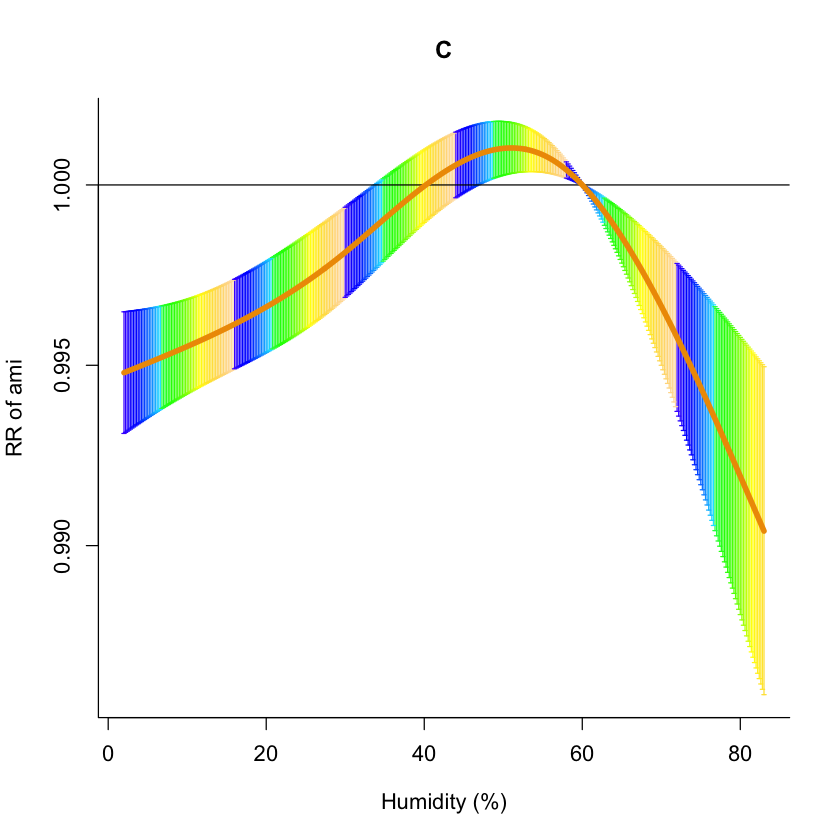

...

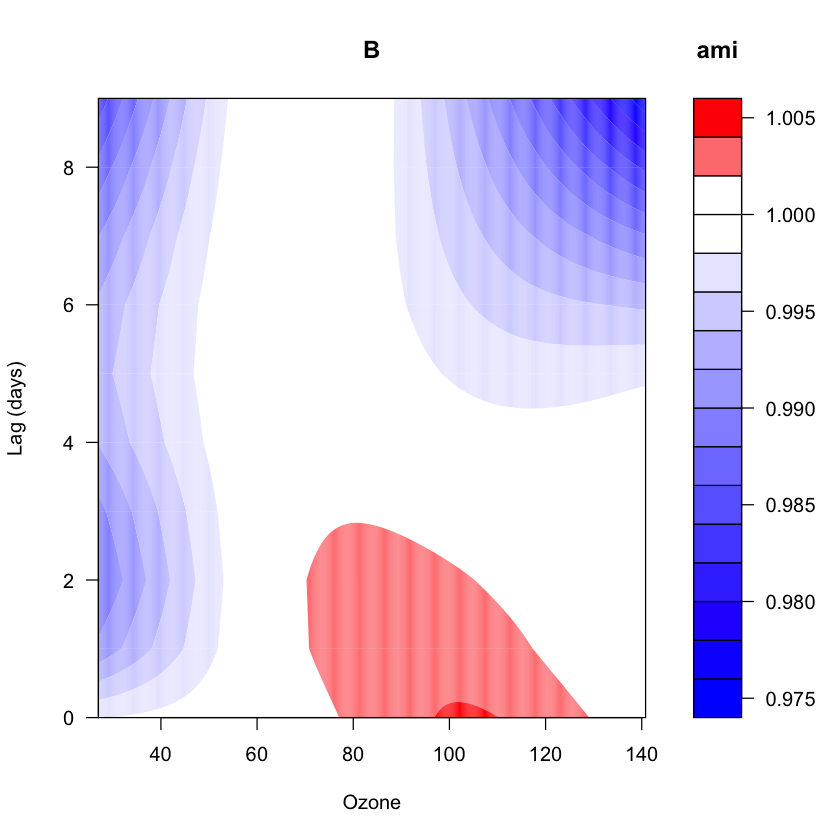

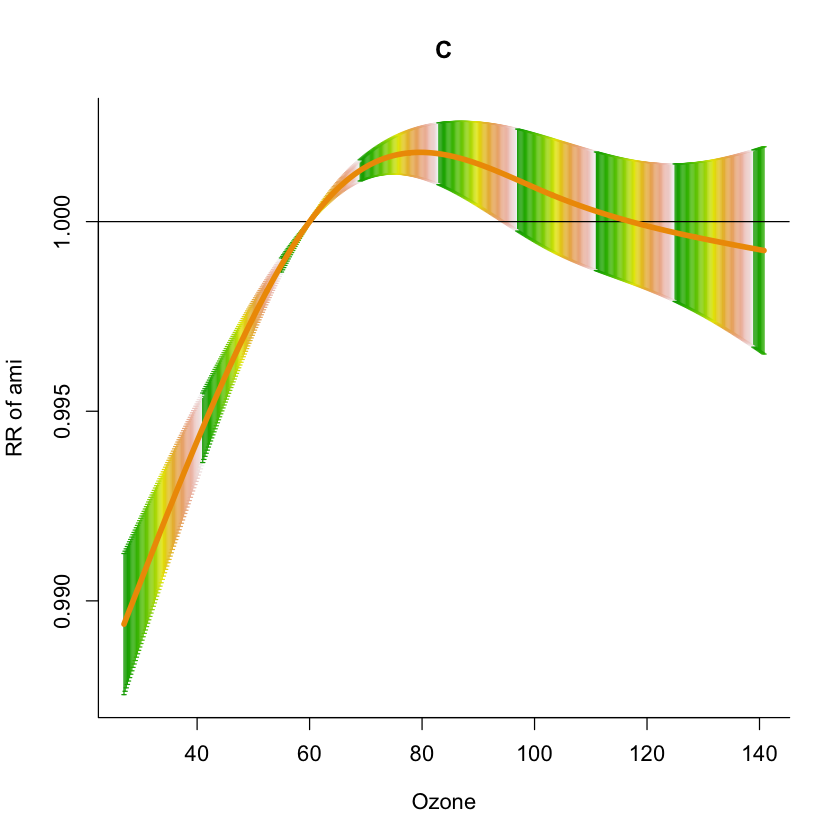

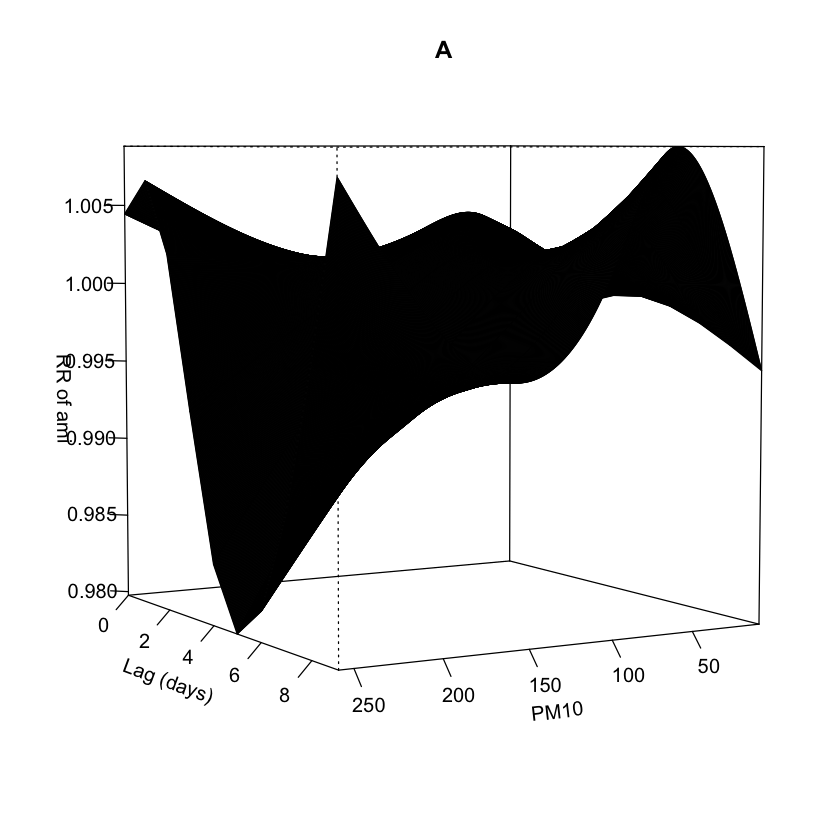

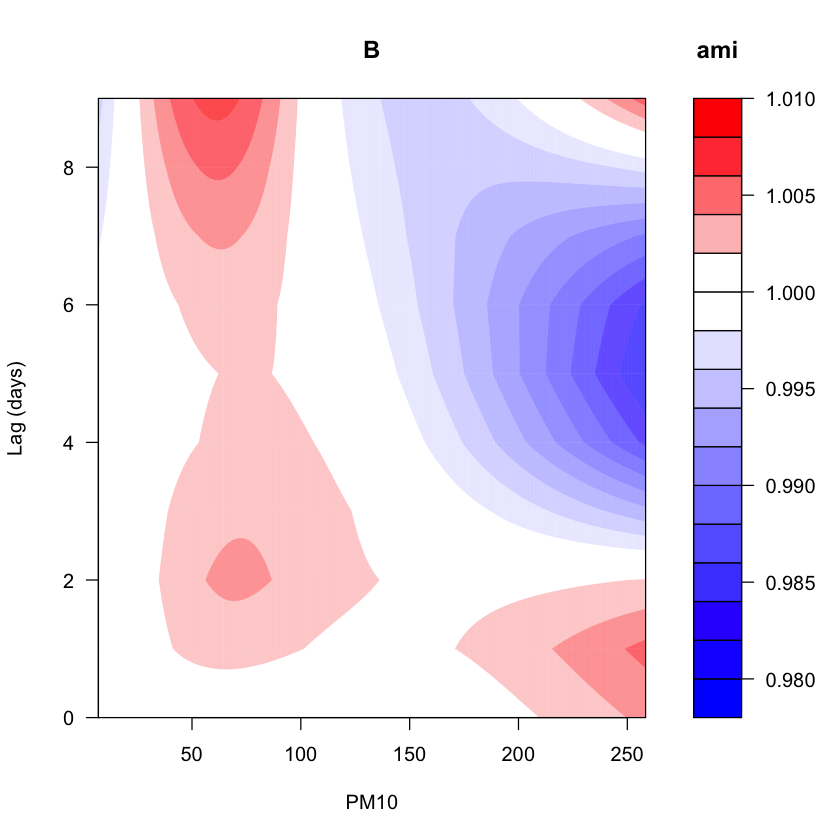

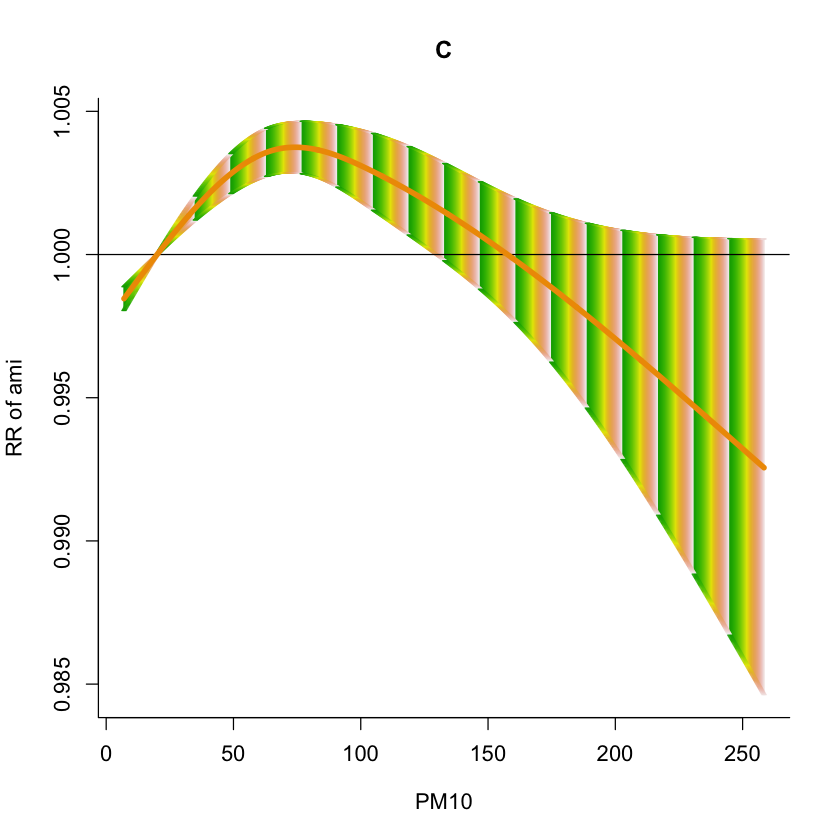

In [6]:
at_code = 'AT01'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Winter",]

k = 3
i = 4
lags = 9
fAMIly = quasipoisson()

lagknots <- logknots(14, fun="ns", df=i)

varknots.hum = equalknots(data$min_hum, fun="ns", df=k)
varknots.t = equalknots(data$max_temp, fun="ns", df=k)
varknots.o3 = equalknots(data$max_O3, fun="ns", df=k)
varknots.pm10 = equalknots(data$max_PM10, fun="ns", df=k)

mo.cb.hum <- crossbasis(data$min_hum, lag = lags, argvar=list(fun="ns", knots = varknots.hum), arglag=list(knots = lagknots))
mo.cb.temp <- crossbasis(data$max_temp, lag = lags, argvar=list(fun="ns", knots=varknots.t), arglag=list(knots = lagknots))
mo.cb.03 <- crossbasis(data$max_O3, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))
mo.cb.pm10 <- crossbasis(data$max_PM10, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))

AMI.modelH <- glm(data$a_asir_90 ~ mo.cb.hum + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelT <- glm(data$a_asir_90 ~ mo.cb.temp + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP <- glm(data$a_asir_90 ~ mo.cb.03 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP1 <- glm(data$a_asir_90 ~ mo.cb.pm10 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.model <-  glm(data$a_asir_90 ~ mo.cb.hum + mo.cb.temp + mo.cb.03 + mo.cb.pm10 + year + month + is_holiday, fAMIly = fAMIly, na.action = na.delete, data)

# summary(mo.cb.hum)
# summary(mo.cb.temp)
# summary(mo.cb.03)
# summary(mo.cb.pm10)

pacf(residuals(AMI.model,type="deviance"),na.action=na.omit,main="Partial autocorrelation (original model)",xlim=c(0,lags))
mo.model.iAMI <- update(AMI.model,.~.+Lag(residuals(AMI.model,type="deviance"),1)) #add residuals at lag 1 to significantly reduce partial autocorrelation
pacf(residuals(mo.model.iAMI,type="deviance"),na.action=na.omit,main="Autocorrelation (adjusted model)",xlim=c(0,lags))
#model predictions
mo.pred.hum.iAMI <- crosspred(mo.cb.hum, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.temp.iAMI <- crosspred(mo.cb.temp, mo.model.iAMI, cen = 23, by=0.2)
mo.pred.pol.iAMI <- crosspred(mo.cb.03, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.pol1.iAMI <- crosspred(mo.cb.pm10, mo.model.iAMI, cen = 20, by=0.2)

#3D, countour, curve plots for Humidity
plot(mo.pred.hum.iAMI, xlab="Humidity (%)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1.1, cex.axis=1.1, col="gray80",main="A")
plot(mo.pred.hum.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Humidity (%)", ylab = "Lag (days)", cex.lab=1.1, cex.axis=1.1))
plot(mo.pred.hum.iAMI, "slices", xlab="Humidity (%)", lag=c(2), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.hum.iAMI, "slices", xlab="Lag (days)", var=c(9), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for temperature
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.temp.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Temperature (°C)", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.temp.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for Ozone
plot(mo.pred.pol.iAMI, xlab="Ozone", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Ozone", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol.iAMI, xlab="Ozone", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
#plot(mo.pred.pol.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for PM10
plot(mo.pred.pol1.iAMI, xlab="PM10", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol1.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="PM10", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol1.iAMI, xlab="PM10", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
#plot(mo.pred.pol1.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


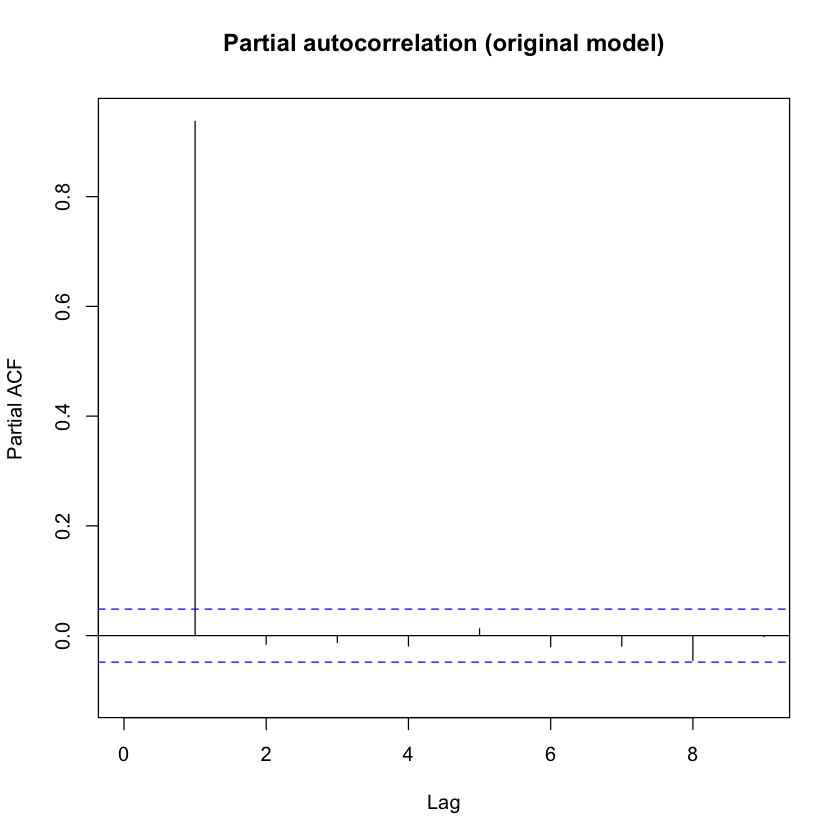

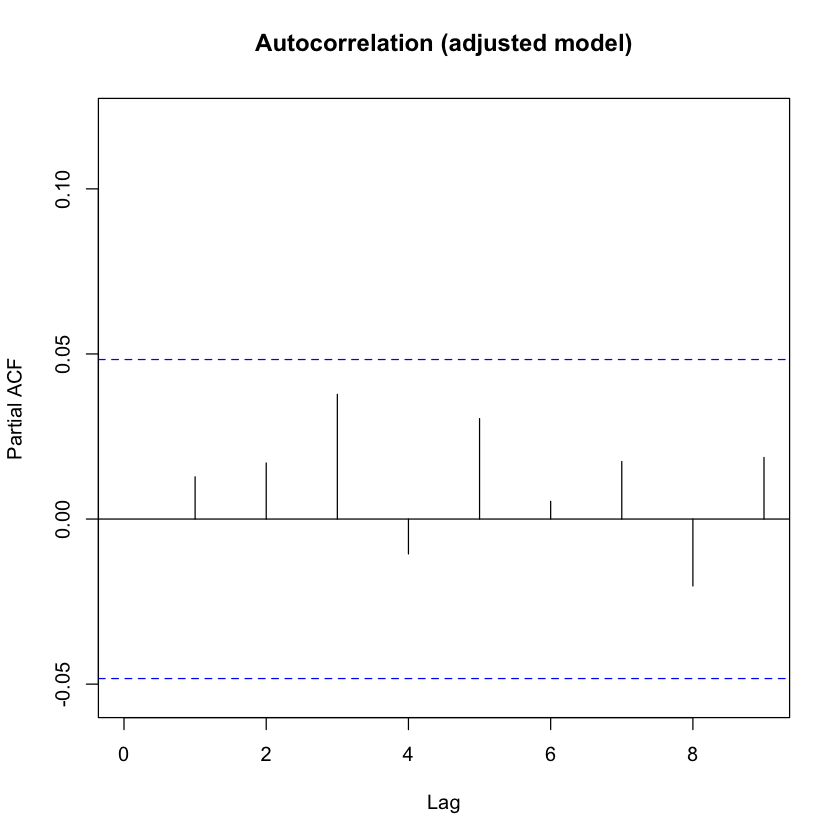

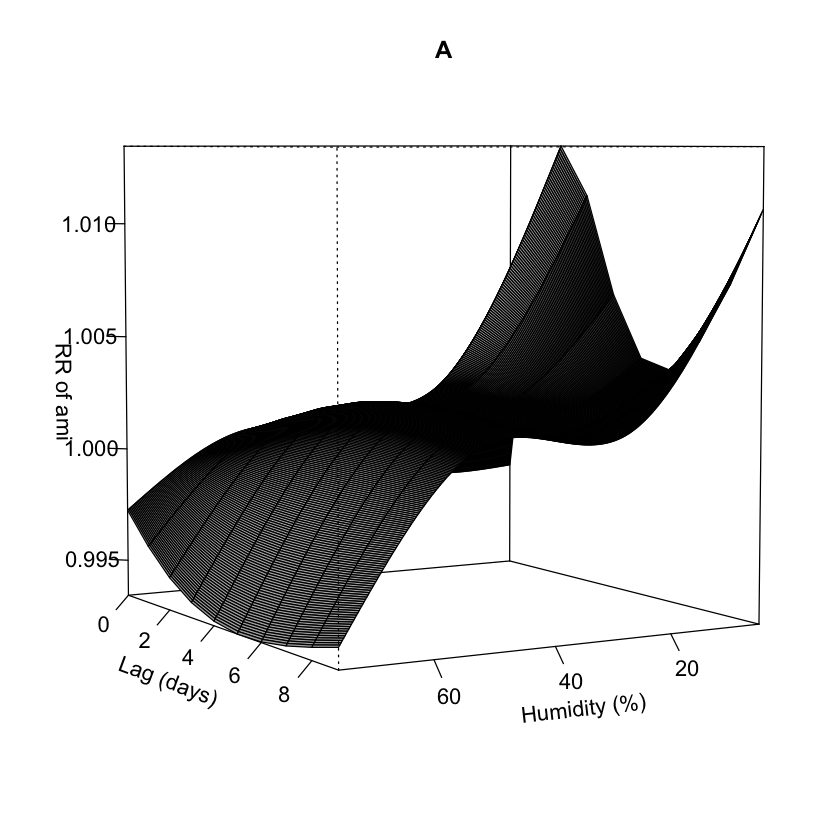

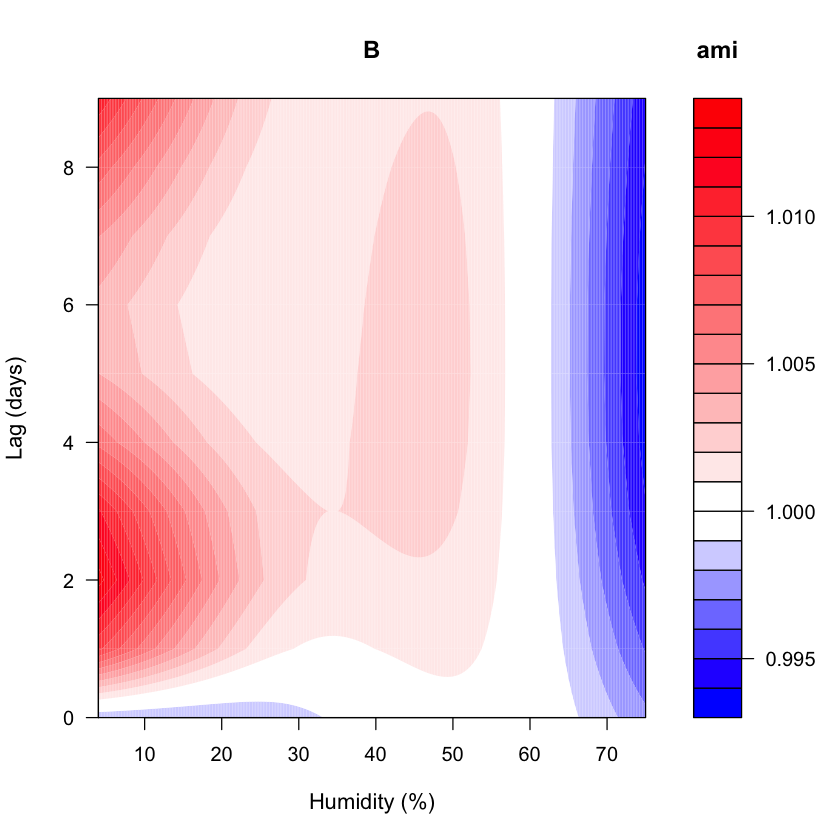

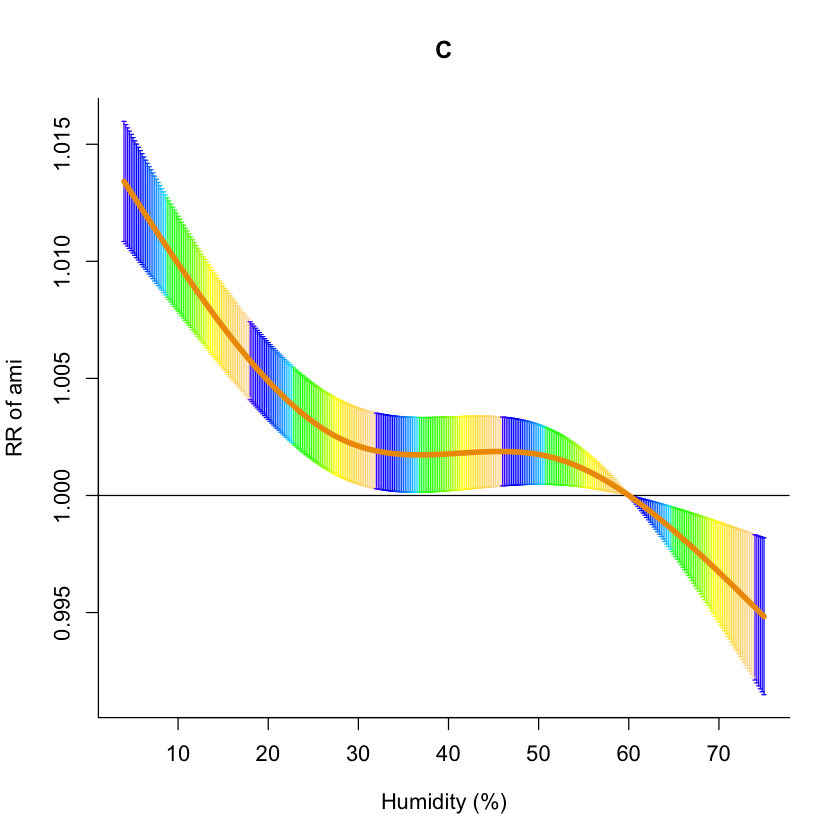

...

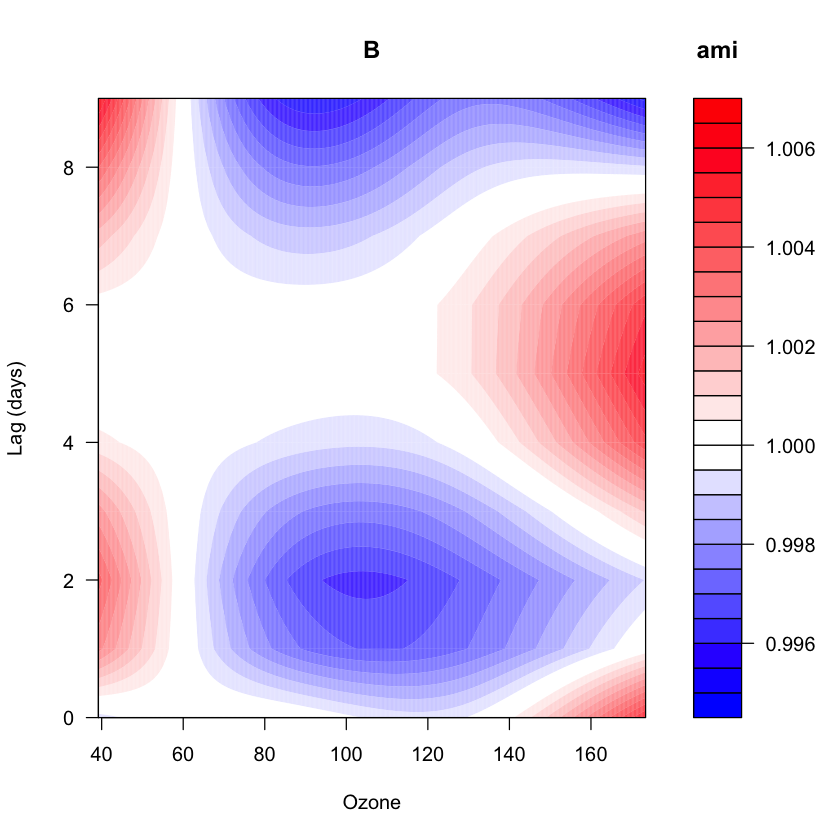

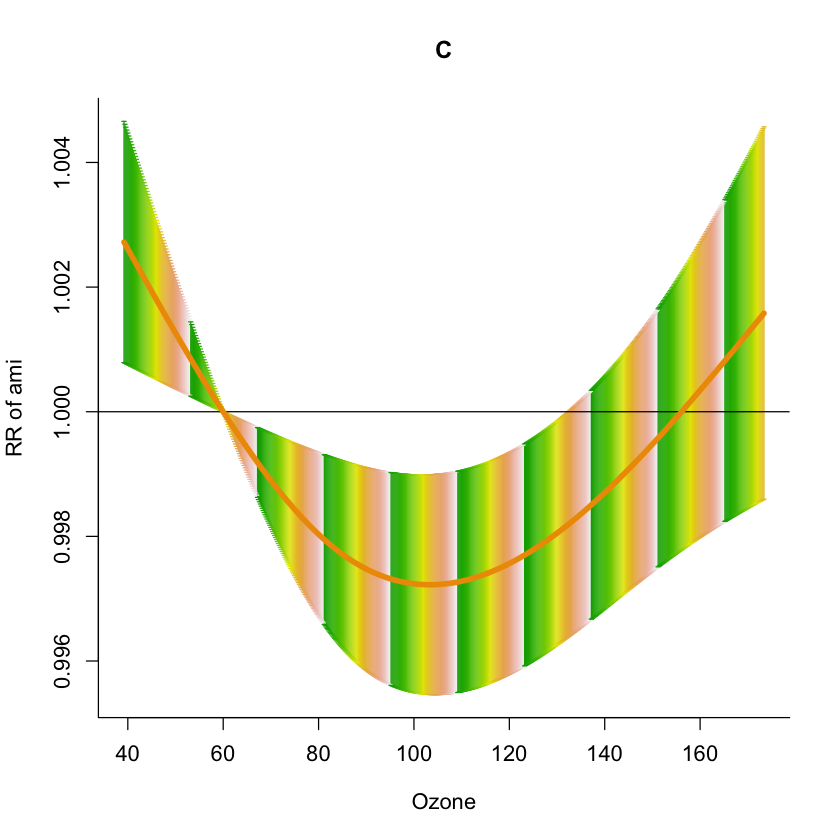

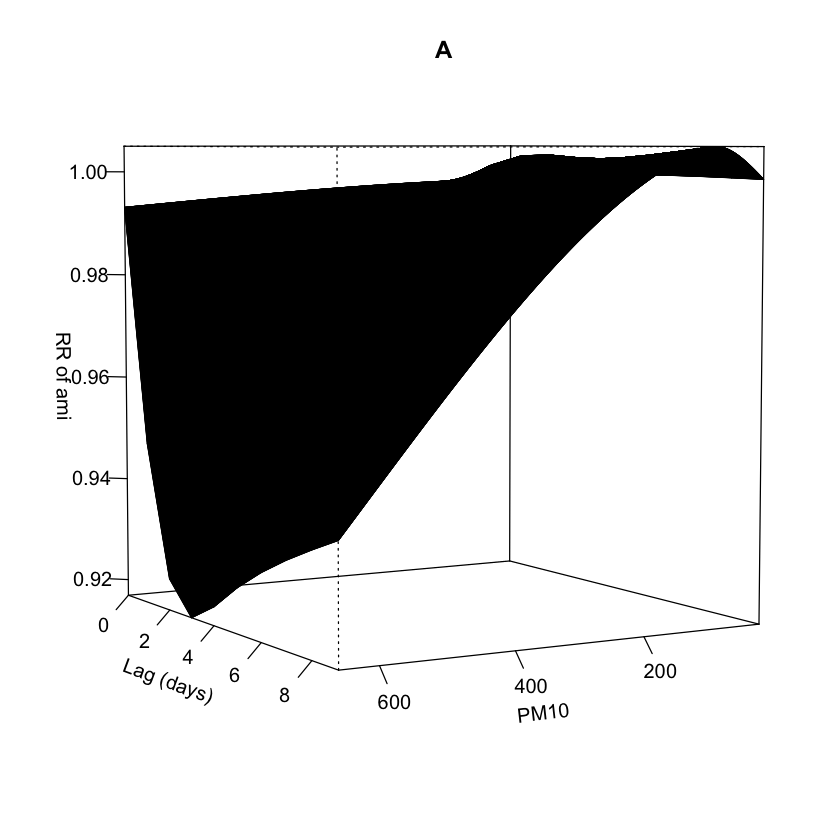

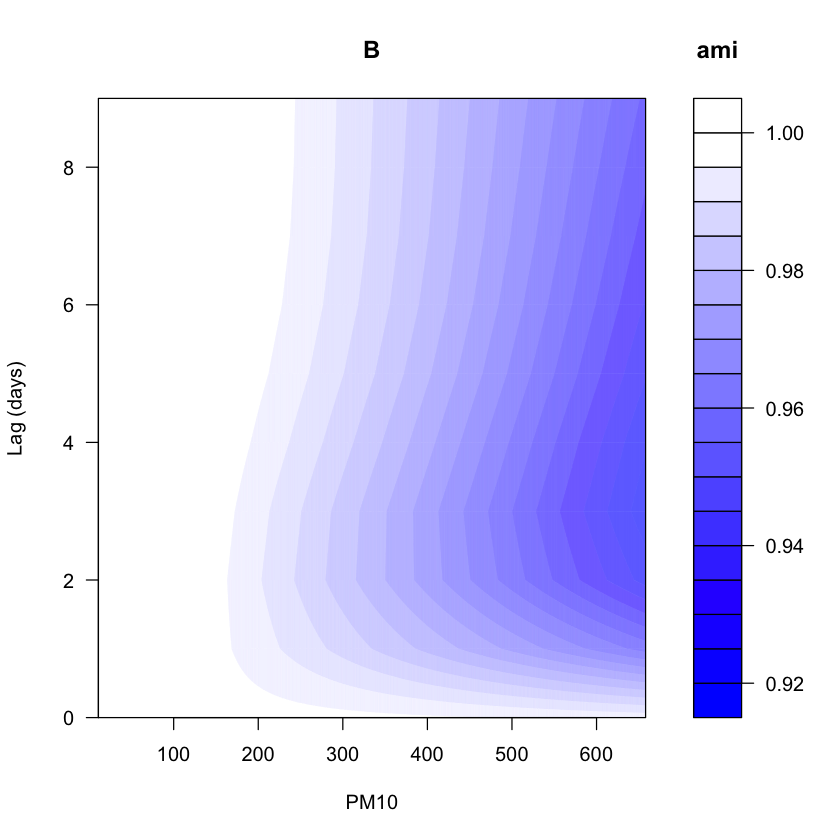

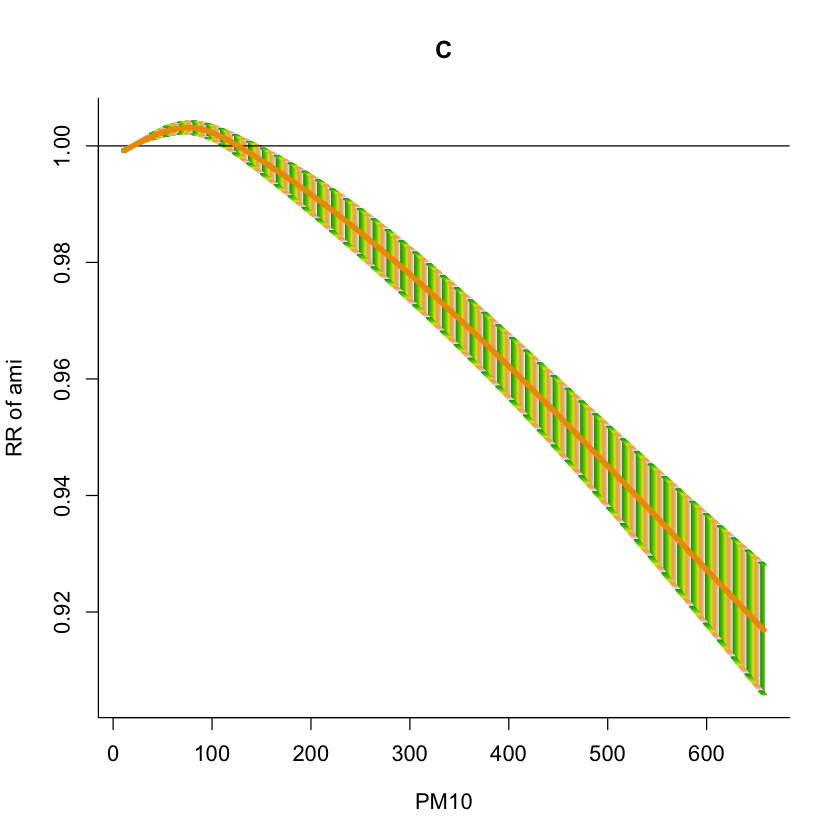

In [7]:
at_code = 'AT01'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Summer",]

k = 3
i = 4
lags = 9
fAMIly = quasipoisson()

lagknots <- logknots(14, fun="ns", df=i)

varknots.hum = equalknots(data$min_hum, fun="ns", df=k)
varknots.t = equalknots(data$max_temp, fun="ns", df=k)
varknots.o3 = equalknots(data$max_O3, fun="ns", df=k)
varknots.pm10 = equalknots(data$max_PM10, fun="ns", df=k)

mo.cb.hum <- crossbasis(data$min_hum, lag = lags, argvar=list(fun="ns", knots = varknots.hum), arglag=list(knots = lagknots))
mo.cb.temp <- crossbasis(data$max_temp, lag = lags, argvar=list(fun="ns", knots=varknots.t), arglag=list(knots = lagknots))
mo.cb.03 <- crossbasis(data$max_O3, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))
mo.cb.pm10 <- crossbasis(data$max_PM10, lag = lags, argvar=list(fun="ns", knots=varknots.o3), arglag=list(knots = lagknots))

AMI.modelH <- glm(data$a_asir_90 ~ mo.cb.hum + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelT <- glm(data$a_asir_90 ~ mo.cb.temp + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP <- glm(data$a_asir_90 ~ mo.cb.03 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.modelP1 <- glm(data$a_asir_90 ~ mo.cb.pm10 + year + month + is_holiday + dow, fAMIly = fAMIly, na.action = na.delete, data)
AMI.model <-  glm(data$a_asir_90 ~ mo.cb.hum + mo.cb.temp + mo.cb.03 + mo.cb.pm10 + year + month + is_holiday, fAMIly = fAMIly, na.action = na.delete, data)

# summary(mo.cb.hum)
# summary(mo.cb.temp)
# summary(mo.cb.03)
# summary(mo.cb.pm10)

pacf(residuals(AMI.model,type="deviance"),na.action=na.omit,main="Partial autocorrelation (original model)",xlim=c(0,lags))
mo.model.iAMI <- update(AMI.model,.~.+Lag(residuals(AMI.model,type="deviance"),1)) #add residuals at lag 1 to significantly reduce partial autocorrelation
pacf(residuals(mo.model.iAMI,type="deviance"),na.action=na.omit,main="Autocorrelation (adjusted model)",xlim=c(0,lags))
#model predictions
mo.pred.hum.iAMI <- crosspred(mo.cb.hum, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.temp.iAMI <- crosspred(mo.cb.temp, mo.model.iAMI, cen = 23, by=0.2)
mo.pred.pol.iAMI <- crosspred(mo.cb.03, mo.model.iAMI, cen = 60, by=0.2)
mo.pred.pol1.iAMI <- crosspred(mo.cb.pm10, mo.model.iAMI, cen = 20, by=0.2)

#3D, countour, curve plots for Humidity
plot(mo.pred.hum.iAMI, xlab="Humidity (%)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1.1, cex.axis=1.1, col="gray80",main="A")
plot(mo.pred.hum.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Humidity (%)", ylab = "Lag (days)", cex.lab=1.1, cex.axis=1.1))
plot(mo.pred.hum.iAMI, "slices", xlab="Humidity (%)", lag=c(2), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.hum.iAMI, "slices", xlab="Lag (days)", var=c(9), col="orange2", ci.arg=list(col=topo.colors(70, alpha = 1)), ci.level=0.95, ci='b', lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for temperature
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.temp.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Temperature (°C)", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.temp.iAMI, xlab="Temperature (°C)", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
plot(mo.pred.temp.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for Ozone
plot(mo.pred.pol.iAMI, xlab="Ozone", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="Ozone", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol.iAMI, xlab="Ozone", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
#plot(mo.pred.pol.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


#3D, countour, curve plots for PM10
plot(mo.pred.pol1.iAMI, xlab="PM10", ylab="Lag (days)", zlab="RR of AMI", theta=150, phi=5, lphi=100, cex.lab=1, cex.axis=1, col="gray80",main="A")
plot(mo.pred.pol1.iAMI, "contour", key.title=title("AMI"), plot.title=title("B", xlab ="PM10", ylab = "Lag (days)", cex.lab=1, cex.axis=1))
plot(mo.pred.pol1.iAMI, xlab="PM10", "slices",lag=c(3), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="C")
#plot(mo.pred.pol1.iAMI, xlab="Lag (days)", "slices",var=c(19), col="orange2", ci.arg=list(col=terrain.colors(70, alpha = 1)), ci.level=0.95, ci='b',lwd=4.5, ylab="RR of AMI", cex.lab=1.1, cex.axis=1.1,main="D")


# GAM

https://stat.ethz.ch/R-manual/R-devel/library/mgcv/html/smooth.terms.html

https://m-clark.github.io/generalized-additive-models/application.html

In [8]:
environment <- read.csv("/Users/gabrielazemencikova/Desktop/AMI-catalonia/project/card_var_pol_stat_data_at.csv")
colnames(environment)[1:18] = c('at_code','date','max_hum','min_hum','max_temp','min_temp','eveAMI','a_rolling_week','expected','a_asir_90','b_asir_365','pop_value','daily_diff_temp','daily_diff_hum','maximum_temperature_change','minimum_temperature_change','maximum_relative_humidity_change','minimum_relative_humidity_change')

environment$date <- as.Date(environment$date)
environment$dow <- weekdays(environment$date)
environment$day <- format(environment$date, "%d")
environment$month <- format(environment$date, "%m")
environment$year <- format(environment$date, "%y")
environment$doy <- as.numeric(format(environment$date, "%j"))

# Function to categorize each month into a season
categorize_season <- function(month) {
  if (month %in% c("05", "06", "07", "08", "09", "10")) {
    return("Summer")
  } else {
    return("Winter")
  }
}

# Add a new column "season" to the environmeAMIet based on the month
environment$season <- sapply(environment$month, categorize_season)

at_code = 'AT03'
data <- environment[environment$at_code== at_code,]
#data <- data[data$season== "Summer",]
#data <- data[complete.cases(data$a_asir_90), ]
colnames(data)

[1] "at_code"                          "date"                            
 [3] "max_hum"                          "min_hum"                         
 [5] "max_temp"                         "min_temp"                        
 [7] "eveami"                           "a_rolling_week"                  
 [9] "expected"                         "a_asir_90"                       
[11] "b_asir_365"                       "pop_value"                       
[13] "daily_diff_temp"                  "daily_diff_hum"                  
[15] "maximum_temperature_change"       "minimum_temperature_change"      
[17] "maximum_relative_humidity_change" "minimum_relative_humidity_change"
[19] "daily_population"                 "incidence_rate"                  
[21] "max_C6H6"                         "max_CO"                          
[23] "max_Cl2"                          "max_H2S"                         
[25] "max_Hg"                           "max_NO"                          
[27] "max_NO2"                          "max_NOX"                         
[29] "max_O3"                           "max_PM1"                         
[31] "max_PM10"                         "max_PM2.5"                       
[33] "max_SO2"                          "max_hour_C6H6"                   
[35] "max_hour_CO"                      "max_hour_Cl2"                    
[37] "max_hour_H2S"                     "max_hour_Hg"                     
[39] "max_hour_NO"                      "max_hour_NO2"                    
[41] "max_hour_NOX"                     "max_hour_O3"                     
[43] "max_hour_PM1"                     "max_hour_PM10"                   
[45] "max_hour_PM2.5"                   "max_hour_SO2"                    
[47] "mean_C6H6"                        "mean_CO"                         
[49] "mean_Cl2"                         "mean_H2S"                        
[51] "mean_Hg"                          "mean_NO"                         
[53] "mean_NO2"                         "mean_NOX"                        
[55] "mean_O3"                          "mean_PM1"                        
[57] "mean_PM10"                        "mean_PM2.5"                      
[59] "mean_SO2"                         "min_C6H6"                        
[61] "min_CO"                           "min_Cl2"                         
[63] "min_H2S"                          "min_Hg"                          
[65] "min_NO"                           "min_NO2"                         
[67] "min_NOX"                          "min_O3"                          
[69] "min_PM1"                          "min_PM10"                        
[71] "min_PM2.5"                        "min_SO2"                         
[73] "min_hour_C6H6"                    "min_hour_CO"                     
[75] "min_hour_Cl2"                     "min_hour_H2S"                    
[77] "min_hour_Hg"                      "min_hour_NO"                     
[79] "min_hour_NO2"                     "min_hour_NOX"                    
[81] "min_hour_O3"                      "min_hour_PM1"                    
[83] "min_hour_PM10"                    "min_hour_PM2.5"                  
[85] "min_hour_SO2"                     "is_holiday"                      
[87] "dow"                              "day"                             
[89] "month"                            "year"                            
[91] "doy"                              "season"

In [9]:
lin_model = lm(a_asir_90 ~ max_temp + min_hum + max_PM10 + max_O3 + is_holiday + dow + season + at_code + month + year + date, data = environment)
summary(lin_model)


Call:
lm(formula = a_asir_90 ~ max_temp + min_hum + max_PM10 + max_O3 + 
    is_holiday + dow + season + at_code + month + year + date, 
    data = environment)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.77070 -0.11036  0.00066  0.11452  0.88052 

Coefficients: (1 not defined because of singularities)
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -4.325e-01  2.434e+00  -0.178 0.858958    
max_temp     -1.706e-03  4.803e-04  -3.552 0.000383 ***
min_hum       2.460e-04  1.235e-04   1.991 0.046457 *  
max_PM10      3.410e-04  6.906e-05   4.938 7.96e-07 ***
max_O3        4.592e-05  1.128e-04   0.407 0.683859    
is_holiday   -1.405e-03  8.130e-03  -0.173 0.862787    
dowMonday     2.720e-03  5.353e-03   0.508 0.611465    
dowSaturday   2.941e-03  5.391e-03   0.546 0.585396    
dowSunday     4.888e-03  5.430e-03   0.900 0.368028    
dowThursday   1.049e-03  5.346e-03   0.196 0.844449    
dowTuesday    1.889e-03  5.346e-03   0.353 0.723790    
dowWed

In [10]:
lin_model_log =lm(log(a_asir_90) ~ min_temp + min_hum + mean_PM10 + mean_O3 + is_holiday + dow + season + at_code + month + year, data = environment)
summary(lin_model_log)


Call:
lm(formula = log(a_asir_90) ~ min_temp + min_hum + mean_PM10 + 
    mean_O3 + is_holiday + dow + season + at_code + month + year, 
    data = environment)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.54240 -0.11049  0.01667  0.14554  0.78344 

Coefficients: (1 not defined because of singularities)
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -0.3144620  0.0160541 -19.588  < 2e-16 ***
min_temp     -0.0031256  0.0005741  -5.445 5.25e-08 ***
min_hum       0.0007279  0.0001482   4.911 9.13e-07 ***
mean_PM10     0.0013166  0.0002320   5.674 1.41e-08 ***
mean_O3       0.0002248  0.0001746   1.288  0.19784    
is_holiday   -0.0010082  0.0100897  -0.100  0.92040    
dowMonday     0.0036554  0.0066615   0.549  0.58319    
dowSaturday   0.0027391  0.0067023   0.409  0.68277    
dowSunday     0.0059123  0.0068117   0.868  0.38543    
dowThursday   0.0007854  0.0066379   0.118  0.90582    
dowTuesday    0.0020579  0.0066415   0.310  0.75667    
dowWed

In [11]:
poly_model =lm(a_asir_90 ~ poly(min_temp,16) + poly(min_hum,16) + mean_PM10 + mean_O3 + is_holiday + dow + season + at_code + date + month + year, data = environment)
summary(poly_model)


Call:
lm(formula = a_asir_90 ~ poly(min_temp, 16) + poly(min_hum, 16) + 
    mean_PM10 + mean_O3 + is_holiday + dow + season + at_code + 
    date + month + year, data = environment)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.79169 -0.11005  0.00138  0.11368  0.88970 

Coefficients: (1 not defined because of singularities)
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)          -6.055e-01  2.431e+00  -0.249 0.803339    
poly(min_temp, 16)1  -3.155e+00  5.387e-01  -5.858 4.77e-09 ***
poly(min_temp, 16)2   9.423e-01  2.550e-01   3.695 0.000221 ***
poly(min_temp, 16)3   6.790e-01  2.375e-01   2.859 0.004257 ** 
poly(min_temp, 16)4   5.918e-01  2.277e-01   2.599 0.009358 ** 
poly(min_temp, 16)5  -3.033e-01  2.252e-01  -1.346 0.178166    
poly(min_temp, 16)6   4.655e-01  2.210e-01   2.106 0.035180 *  
poly(min_temp, 16)7  -1.198e-01  2.200e-01  -0.544 0.586129    
poly(min_temp, 16)8  -5.426e-01  2.204e-01  -2.462 0.013838 *  
poly(min_temp, 1

# GAM CATALONIA

In [12]:
library(mgcv)
mod_lm = gam(a_asir_90 ~ min_temp + min_hum + mean_PM10 + mean_O3 + mean_NO + mean_NO2 + mean_CO + year + season, data = environment, fAMIly = quasipoisson())
summary(mod_lm)


Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ min_temp + min_hum + mean_PM10 + mean_O3 + mean_NO + 
    mean_NO2 + mean_CO + year + season

Parametric coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -0.4979048  0.0137199 -36.291  < 2e-16 ***
min_temp     -0.0072546  0.0003471 -20.901  < 2e-16 ***
min_hum       0.0013841  0.0001326  10.436  < 2e-16 ***
mean_PM10     0.0029876  0.0002181  13.698  < 2e-16 ***
mean_O3       0.0007109  0.0001339   5.307 1.12e-07 ***
mean_NO      -0.0012839  0.0002725  -4.712 2.47e-06 ***
mean_NO2      0.0011607  0.0002508   4.629 3.70e-06 ***
mean_CO      -0.0465336  0.0195926  -2.375   0.0176 *  
year11        0.0430175  0.0082509   5.214 1.87e-07 ***
year12        0.1823055  0.0080206  22.730  < 2e-16 ***
year13        0.2736689  0.0078452  34.884  < 2e-16 ***
year14        0.2438047  0.0079442  30.690  < 2e-16 ***
year15        0.3063012  0.0078069  39.235  < 2e-16 ***
year16        0.3428997  0.00776

## Min_temp


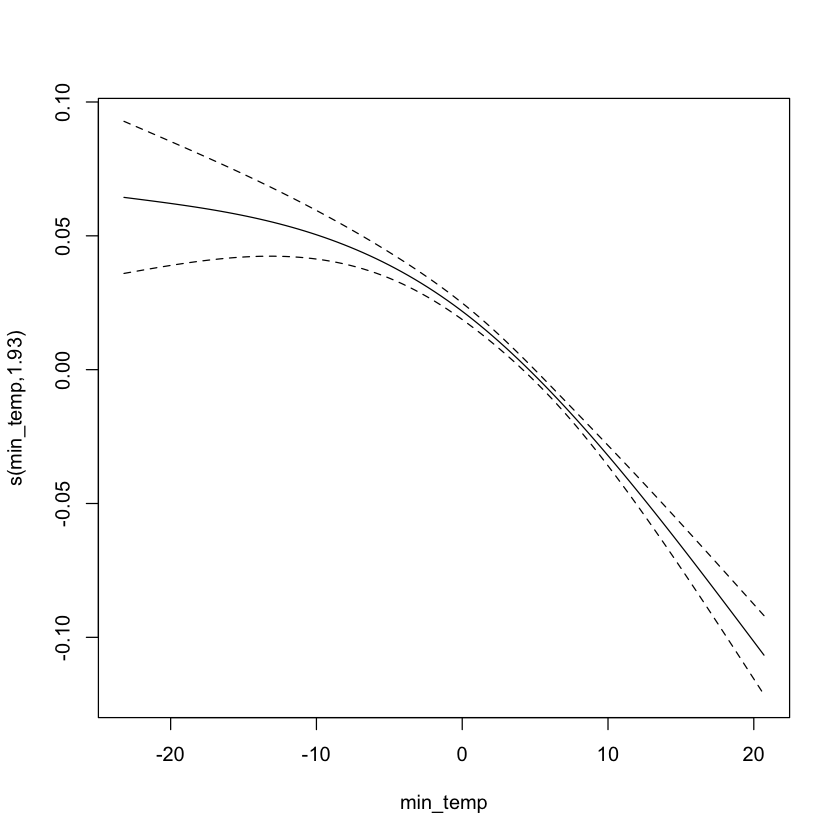

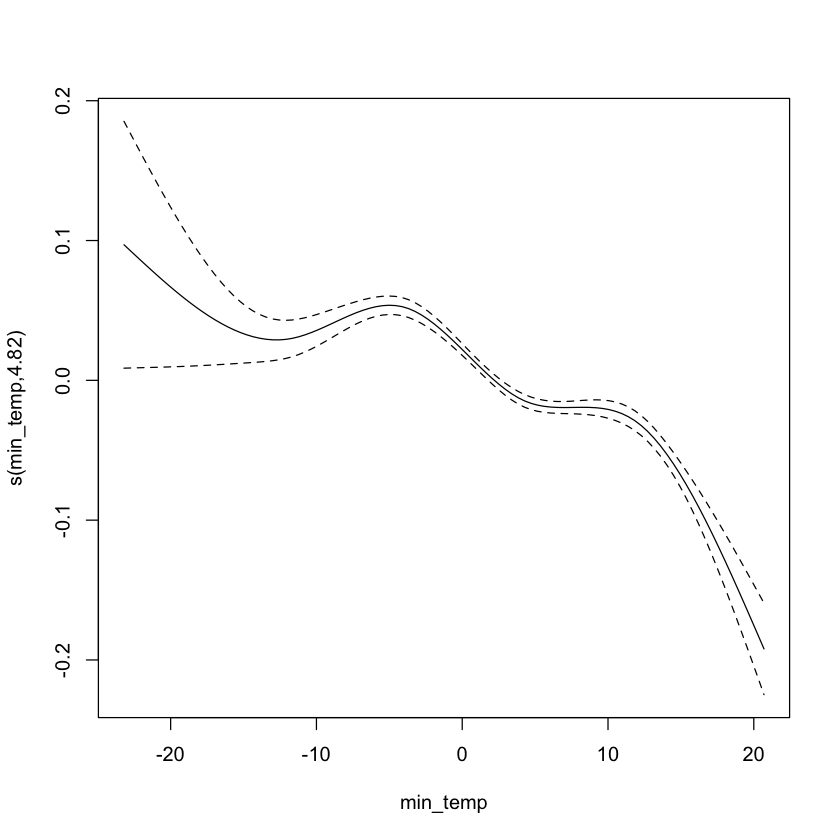

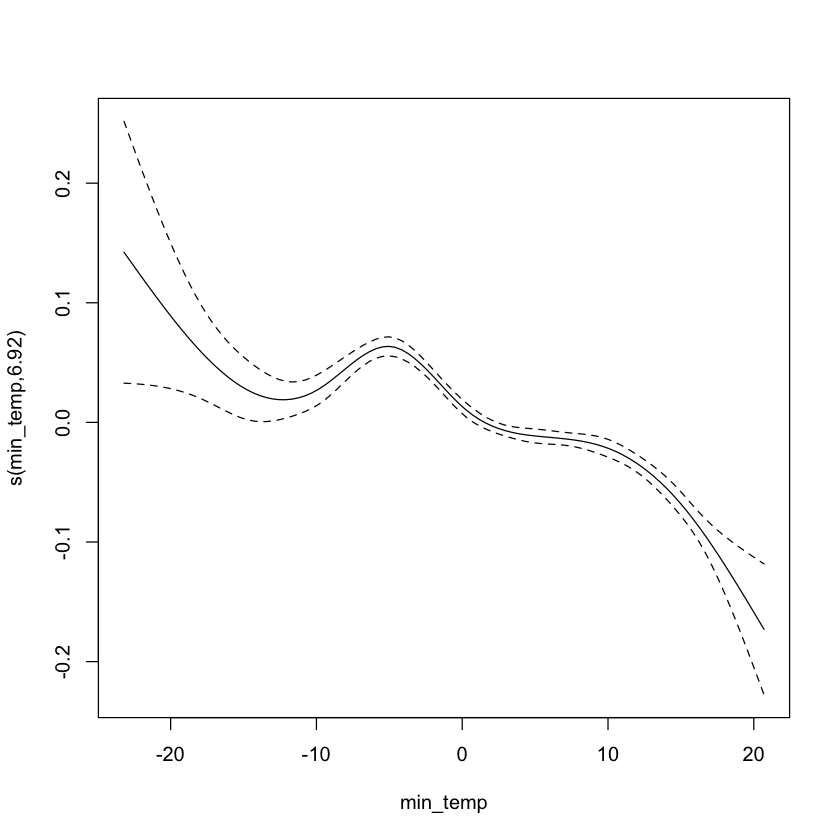

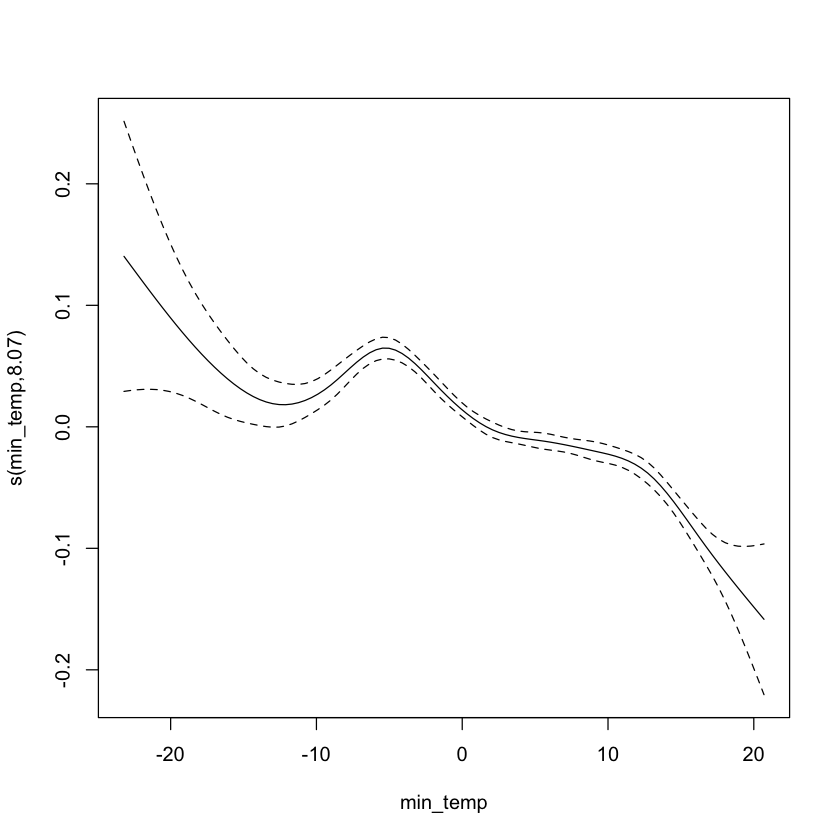

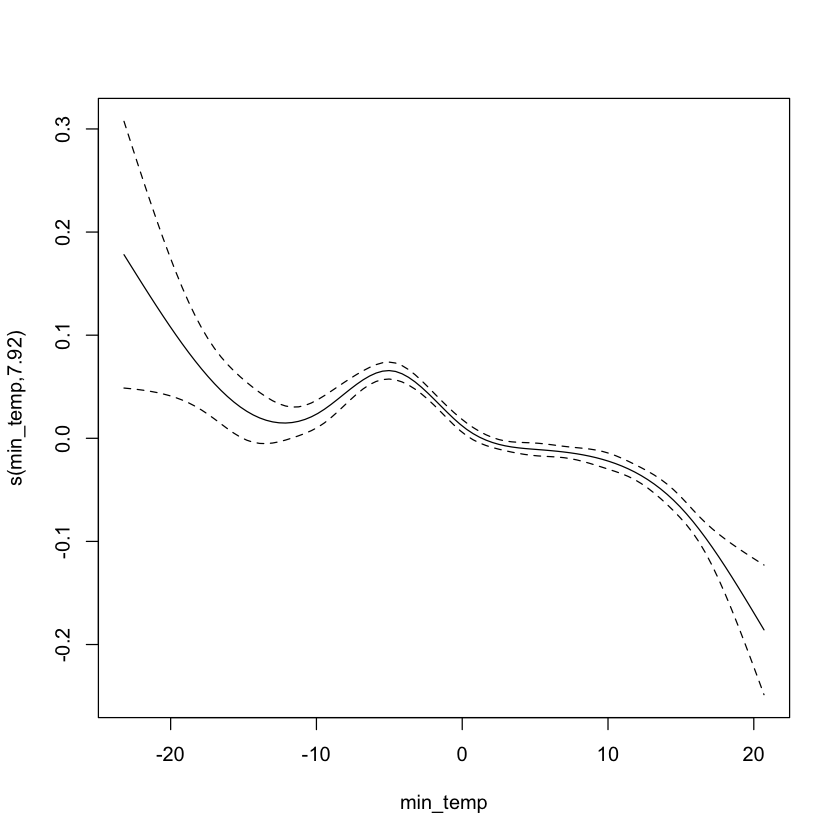

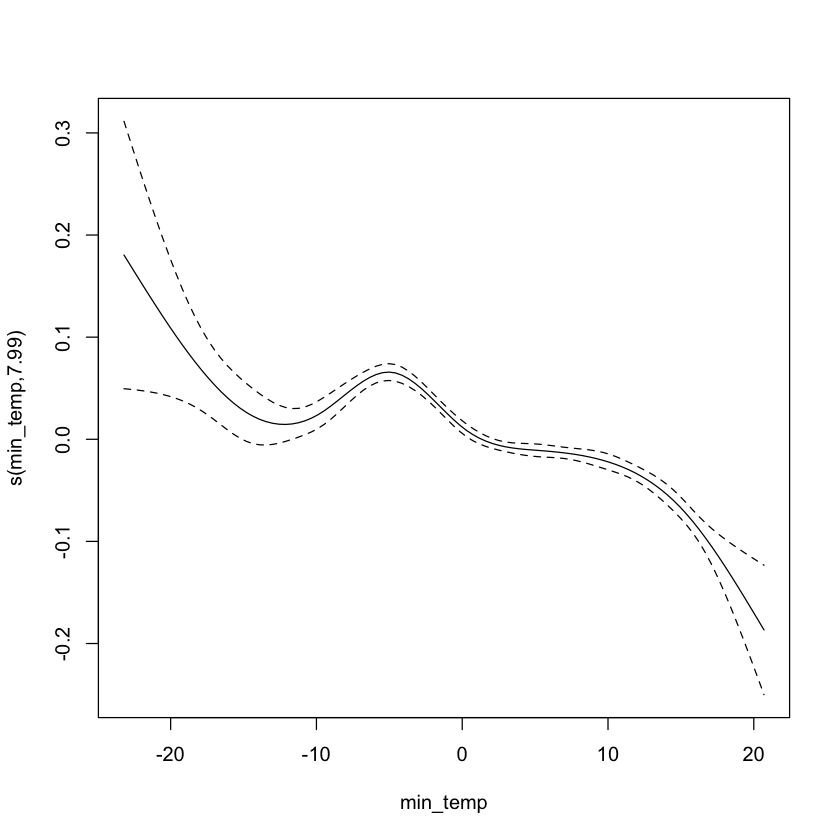

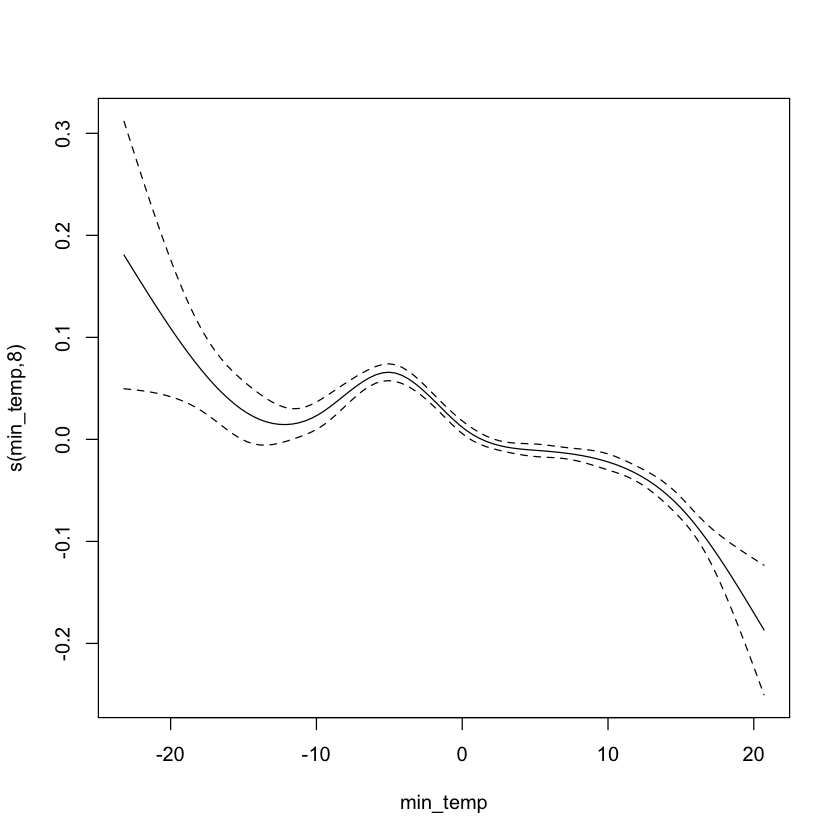


Method: REML   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-3.373552e-07,-3.373552e-07]
(score -24854.91 & scale 0.04918559).
Hessian positive definite, eigenvalue range [12751,12751].
Model rank =  18 / 18 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

              k'  edf k-index p-value
s(min_temp) 8.00 7.99       1    0.52


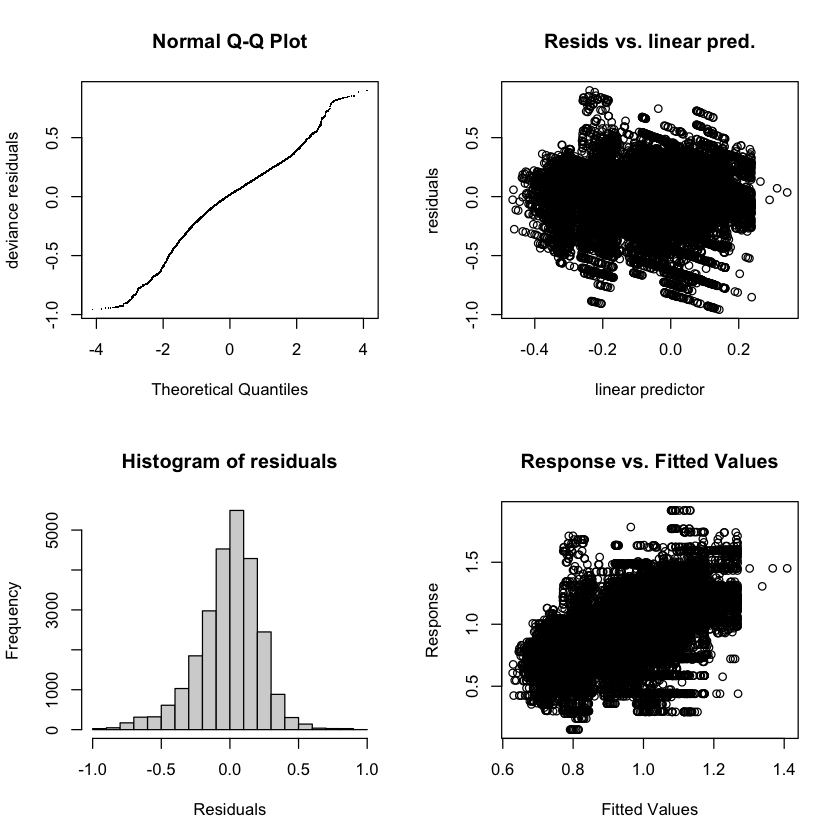

In [13]:
#======== No of KNOTS ========

mod_gam_temp_cat_3 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 3) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_temp_cat_6 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 6) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_temp_cat_9 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_temp_cat_12 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 12) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())

plot(mod_gam_temp_cat_3)
plot(mod_gam_temp_cat_6)
plot(mod_gam_temp_cat_9)
plot(mod_gam_temp_cat_12)

#======== Smoothing Parameters  ========
mod_gam_temp_sp10 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=10)
mod_gam_temp_sp1 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=1)
mod_gam_temp_sp01 = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=0.1)

plot(mod_gam_temp_sp10)
plot(mod_gam_temp_sp1)
plot(mod_gam_temp_sp01)

gam.check(mod_gam_temp_sp1)


## Min_hum

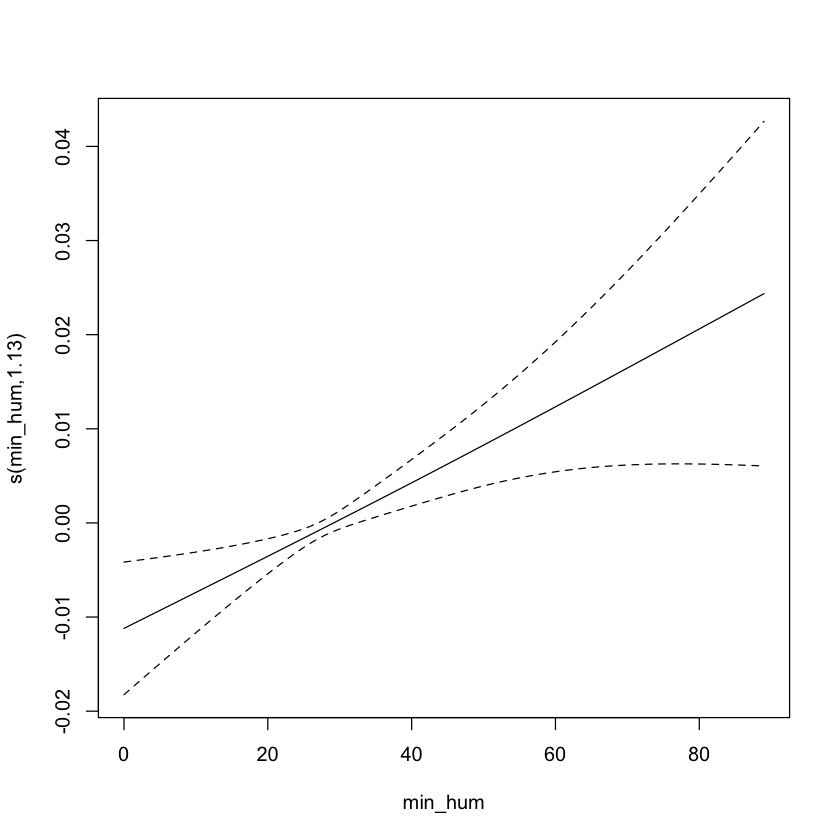

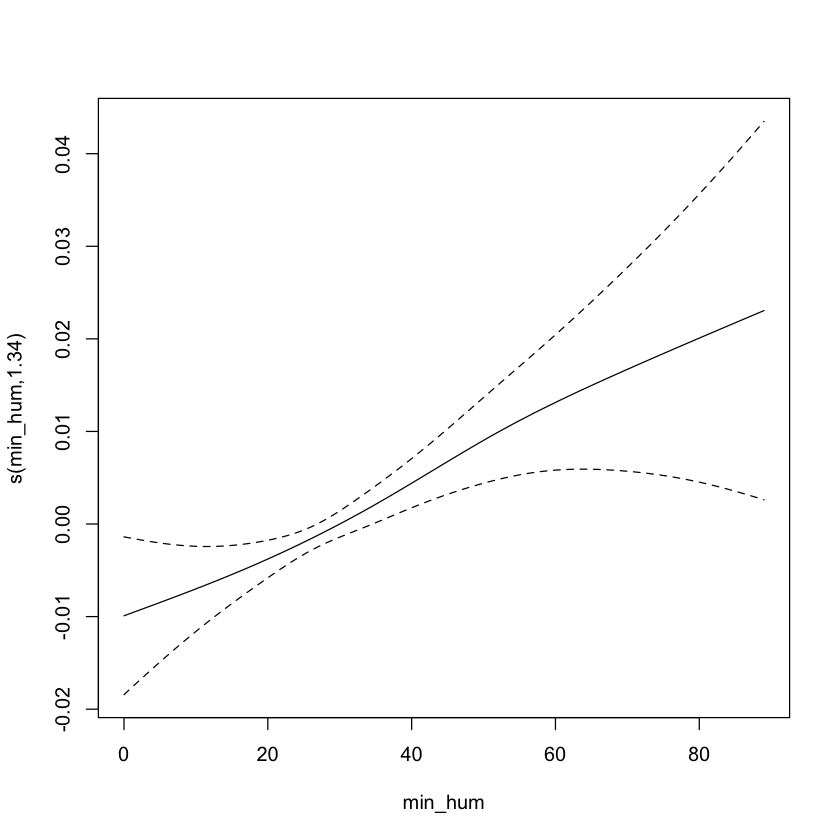

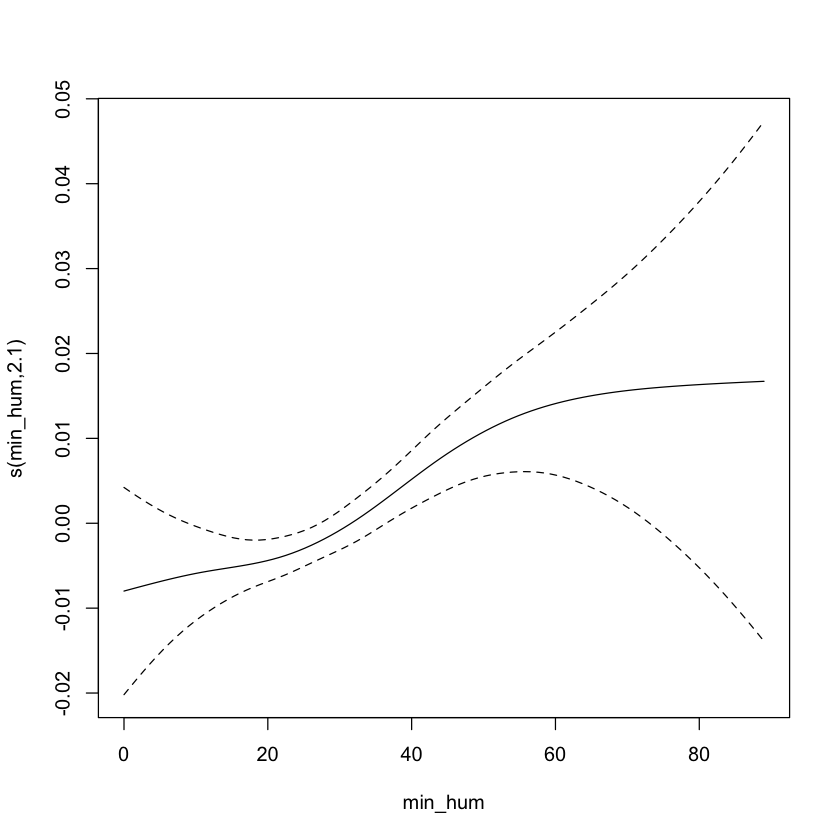

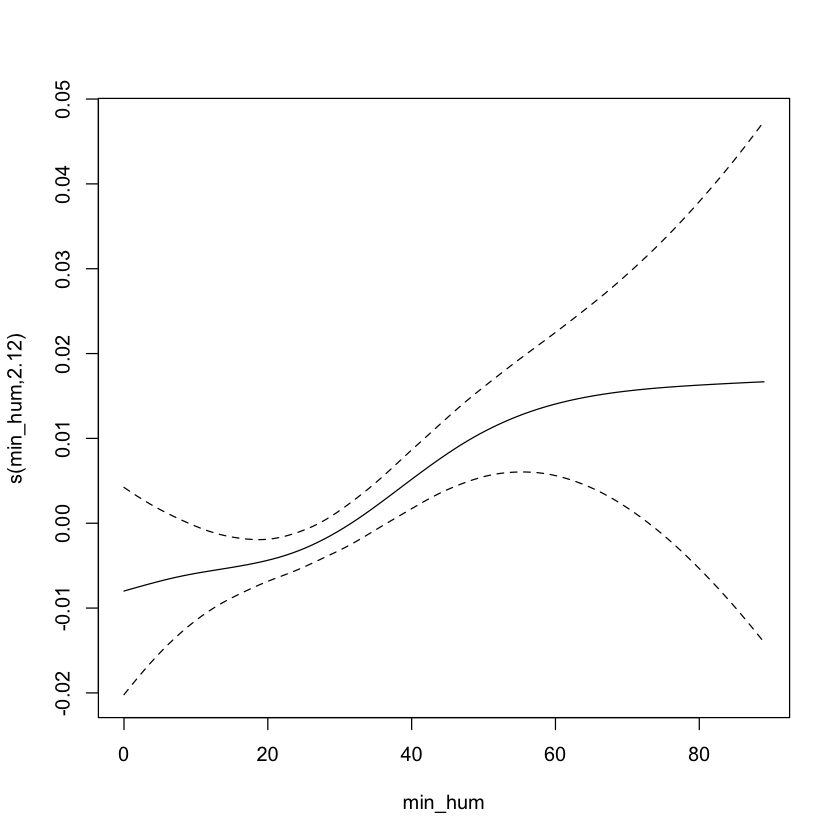

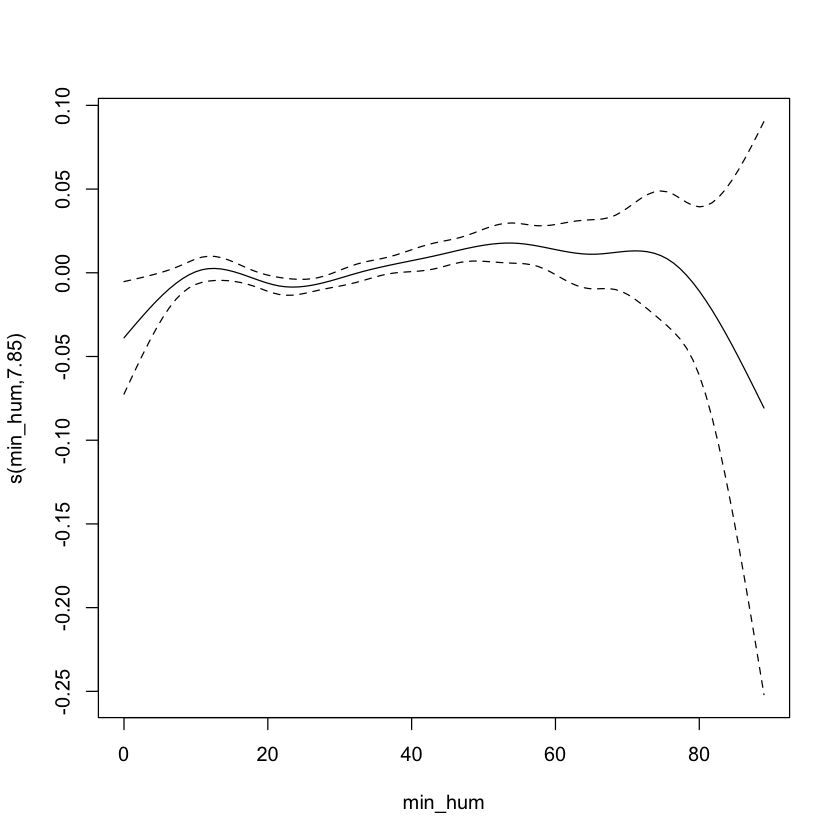

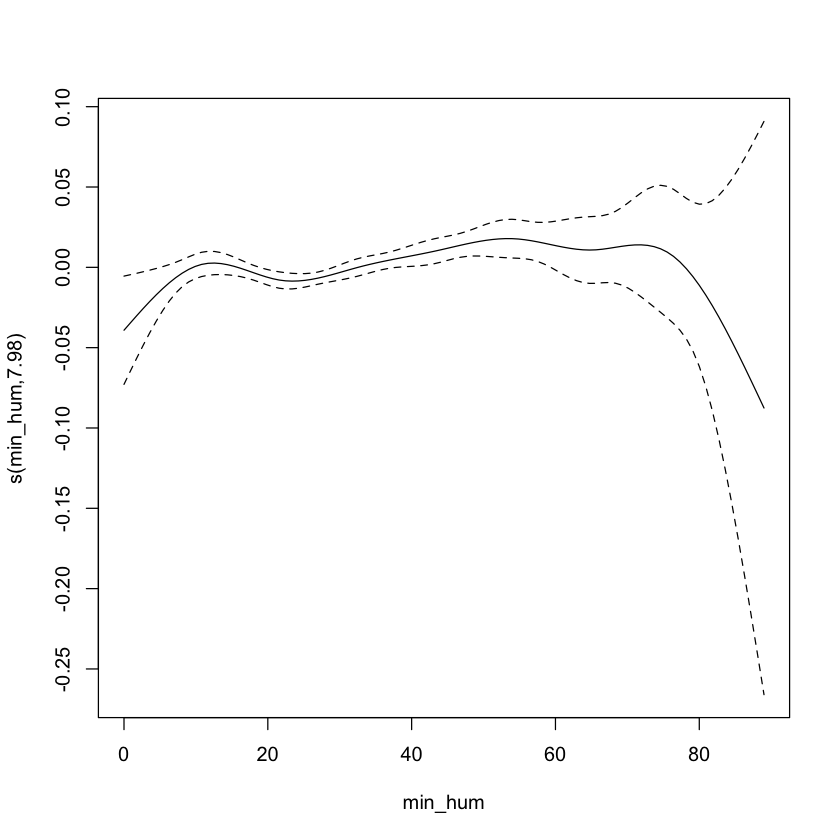

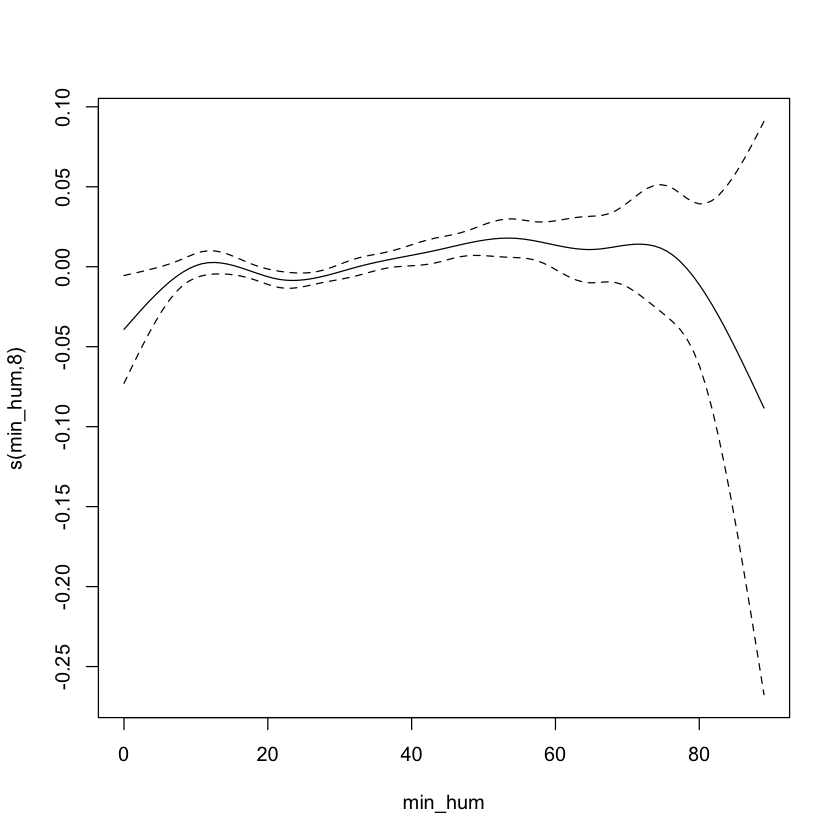


Method: REML   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-4.339854e-07,-4.339854e-07]
(score -24684.09 & scale 0.05003615).
Hessian positive definite, eigenvalue range [12751,12751].
Model rank =  18 / 18 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

             k'  edf k-index p-value
s(min_hum) 8.00 7.98    1.01    0.74


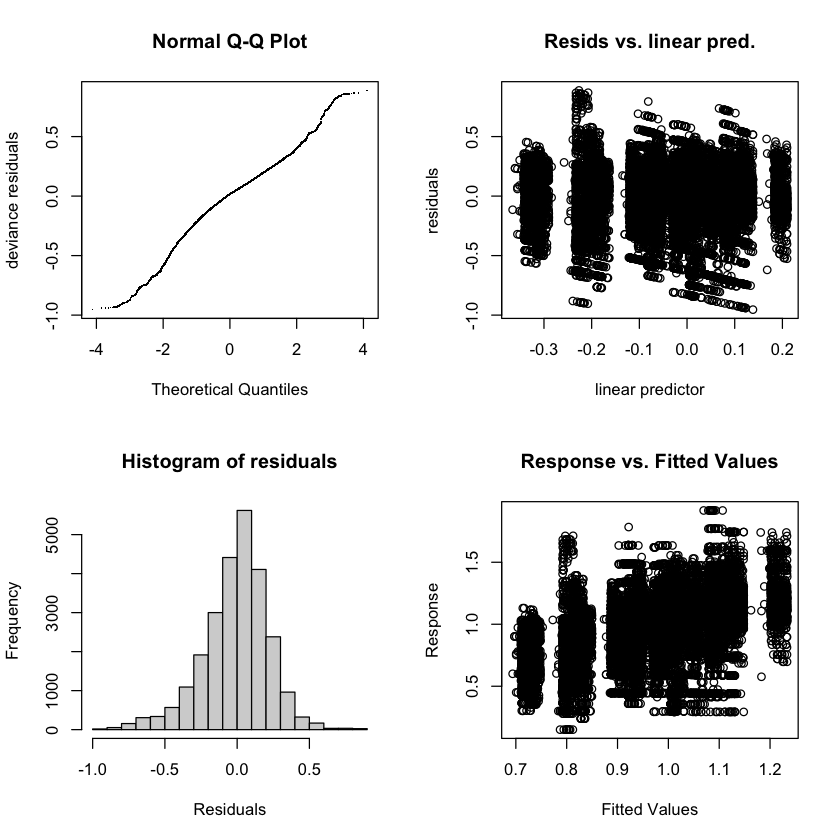

In [14]:
#======== No of KNOTS ========

mod_gam_hum_cat_3 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 3) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_hum_cat_6 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 6) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_hum_cat_9 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_hum_cat_12 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 12) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())

plot(mod_gam_hum_cat_3)
plot(mod_gam_hum_cat_6)
plot(mod_gam_hum_cat_9)
plot(mod_gam_hum_cat_12)

#======== Smoothing Parameters  ========
mod_gam_hum_sp10 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=10)
mod_gam_hum_sp1 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=1)
mod_gam_hum_sp01 = gam(a_asir_90 ~ s(min_hum, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=0.1)

plot(mod_gam_hum_sp10)
plot(mod_gam_hum_sp1)
plot(mod_gam_hum_sp01)

gam.check(mod_gam_hum_sp1)


## PM10

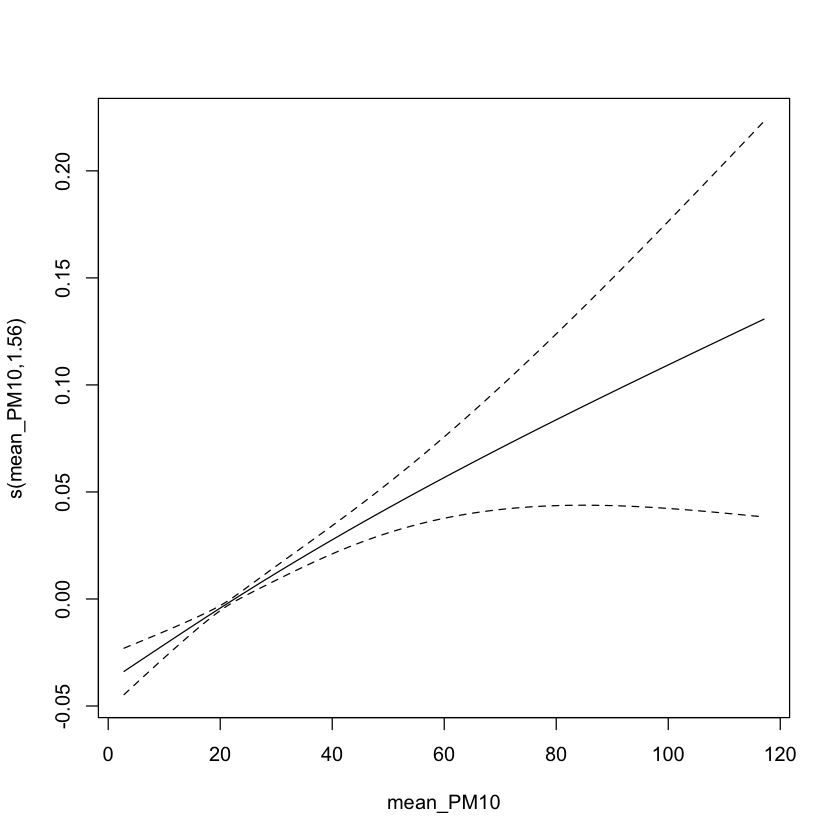

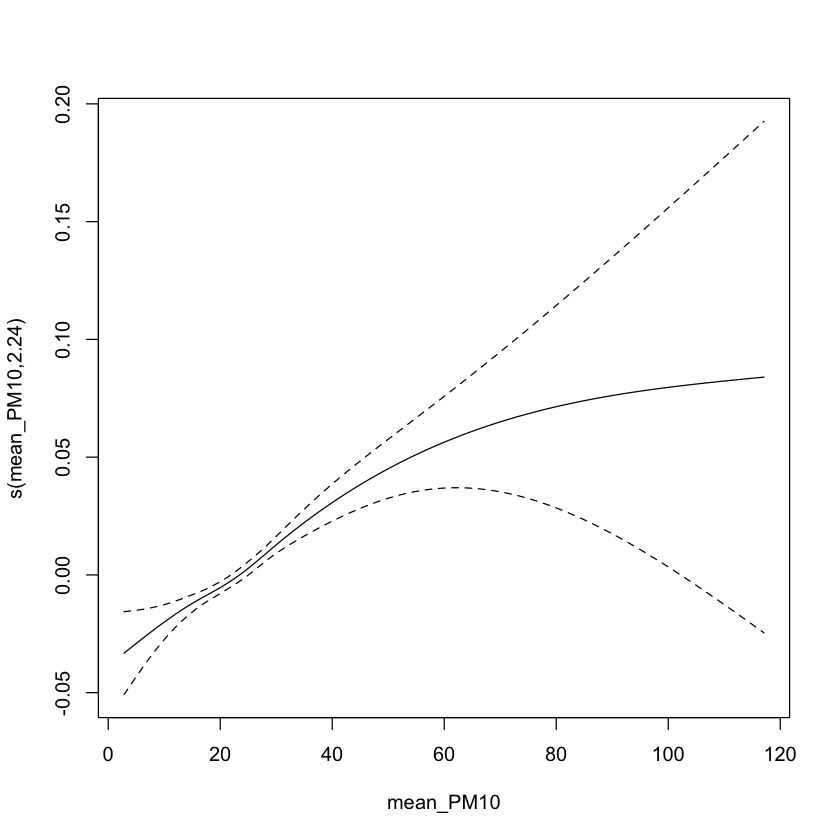

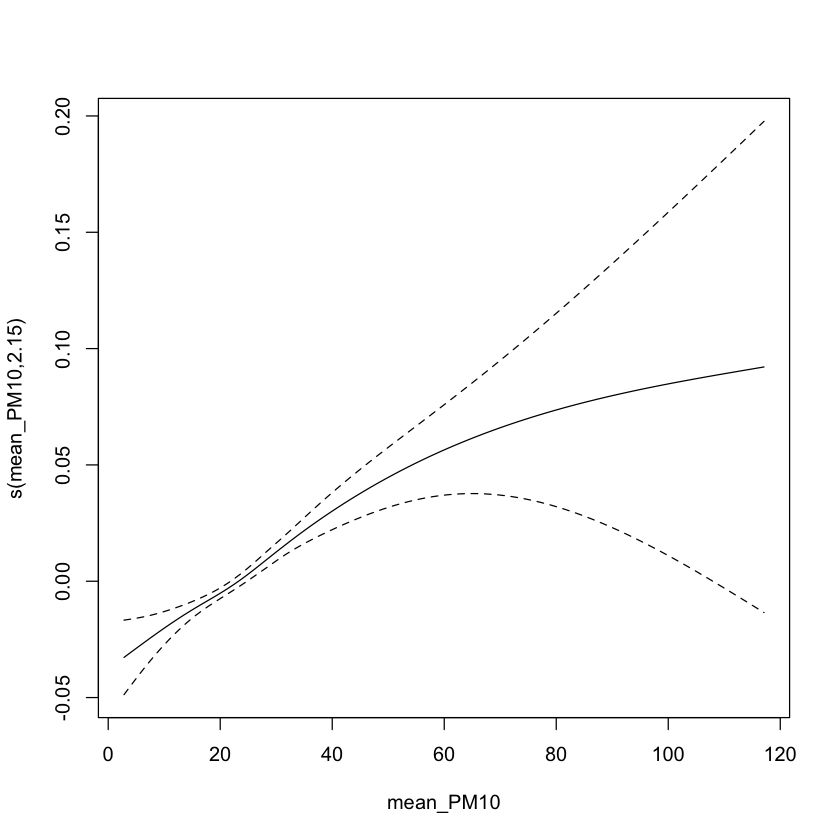

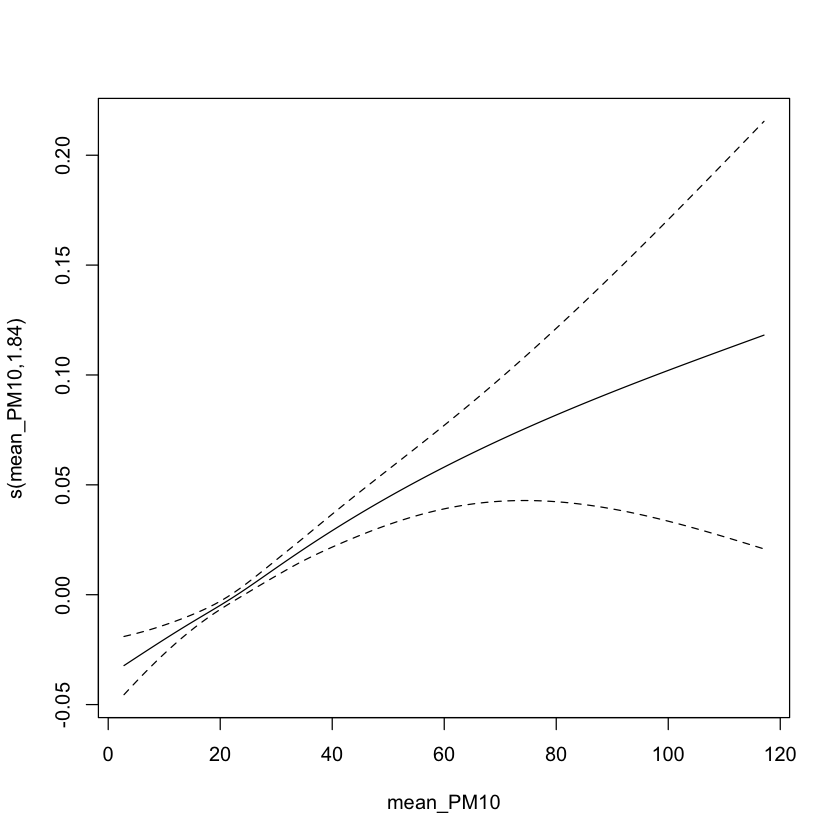

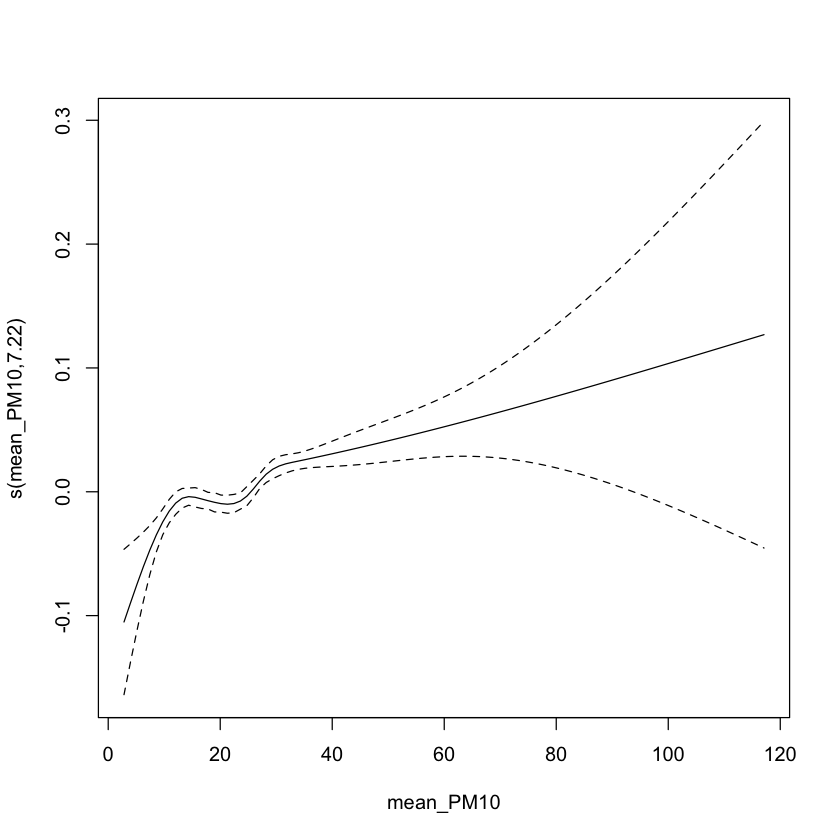

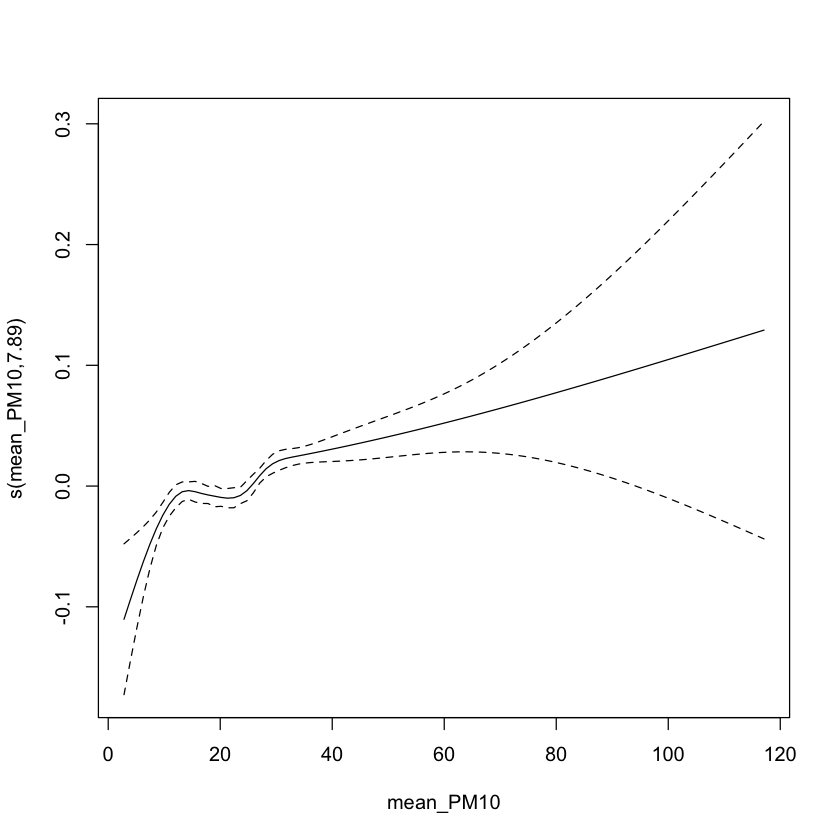

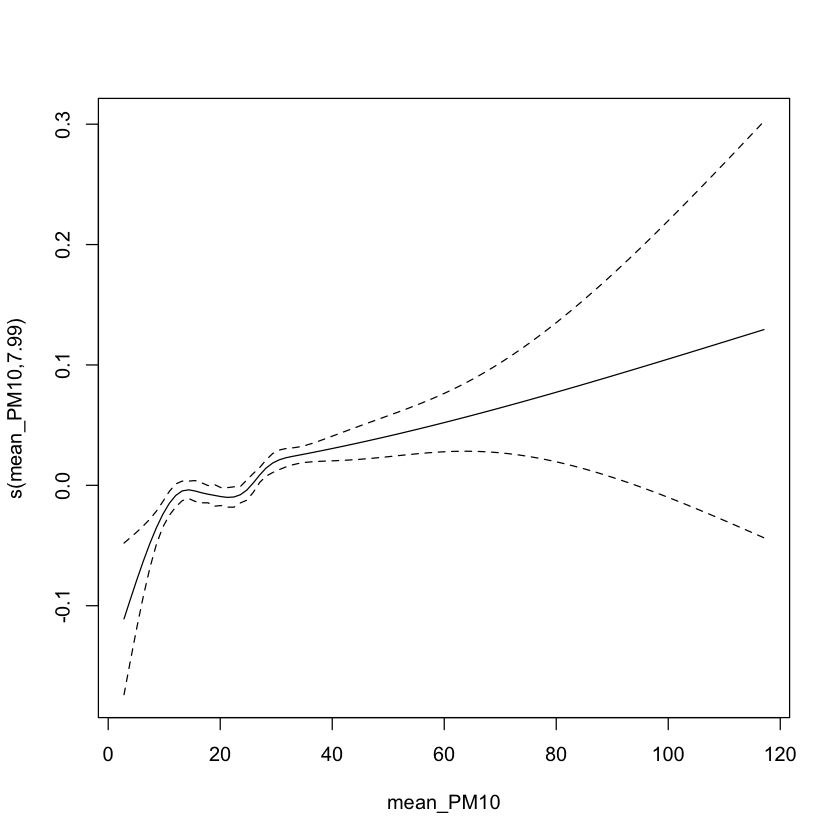


Method: REML   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-1.28457e-07,-1.28457e-07]
(score -18908.59 & scale 0.05025299).
Hessian positive definite, eigenvalue range [9818.5,9818.5].
Model rank =  18 / 18 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value
s(mean_PM10) 8.00 7.89    0.99     0.3


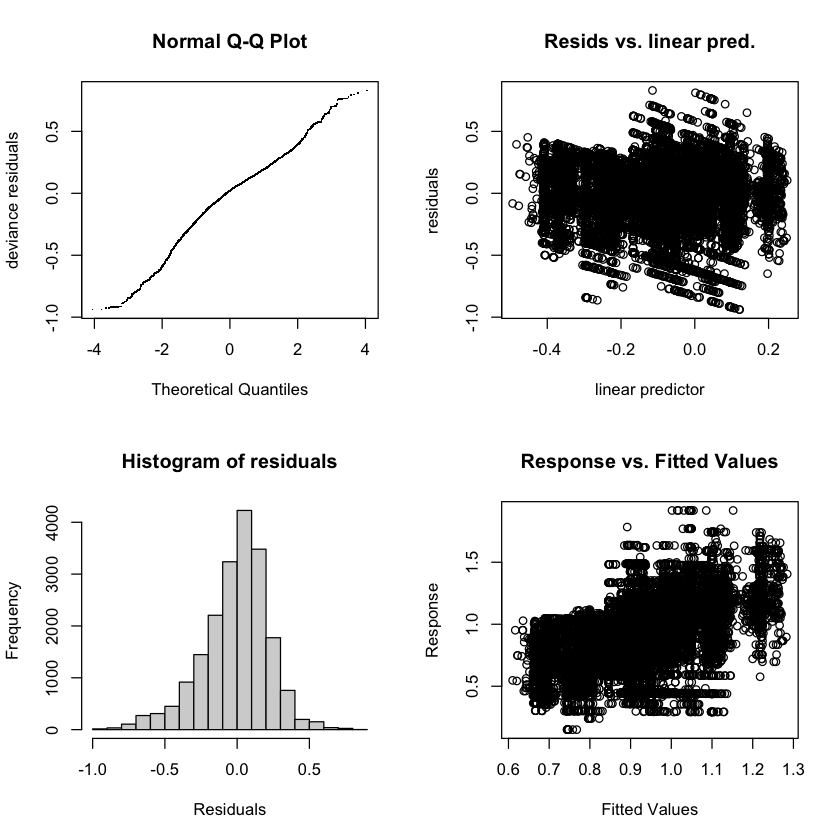

In [15]:
#======== No of KNOTS ========

mod_gam_pm10_cat_3 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 3) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_pm10_cat_6 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 6) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_pm10_cat_9 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_pm10_cat_12 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 12) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())

plot(mod_gam_pm10_cat_3)
plot(mod_gam_pm10_cat_6)
plot(mod_gam_pm10_cat_9)
plot(mod_gam_pm10_cat_12)

#======== Smoothing Parameters  ========
mod_gam_pm10_sp10 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=10)
mod_gam_pm10_sp1 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=1)
mod_gam_pm10_sp01 = gam(a_asir_90 ~ s(mean_PM10, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=0.1)

plot(mod_gam_pm10_sp10)
plot(mod_gam_pm10_sp1)
plot(mod_gam_pm10_sp01)

gam.check(mod_gam_pm10_sp1)


## OZONE

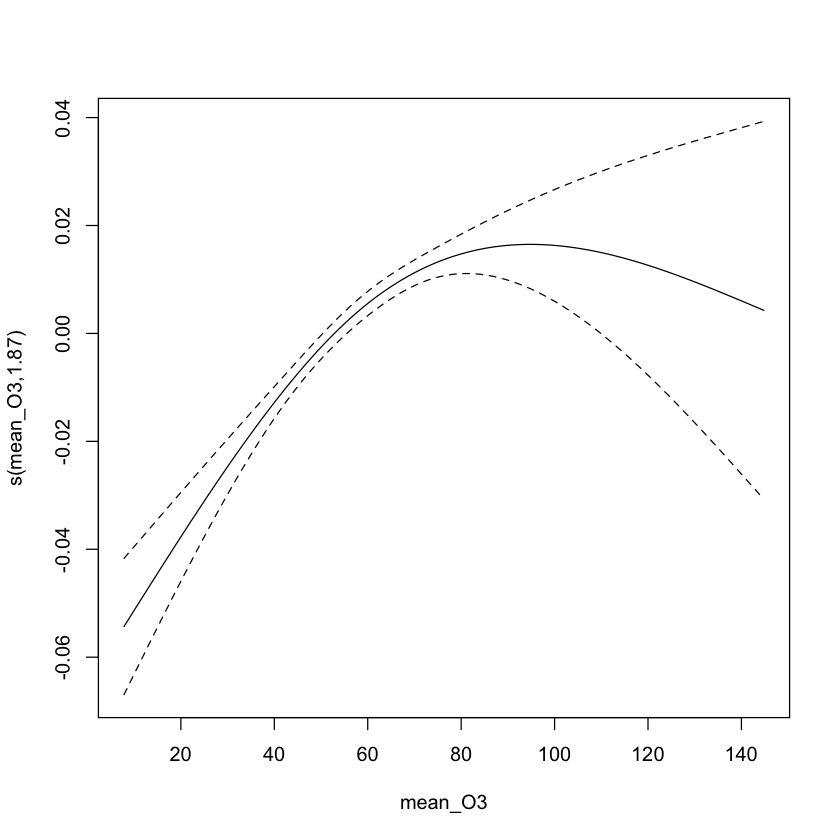

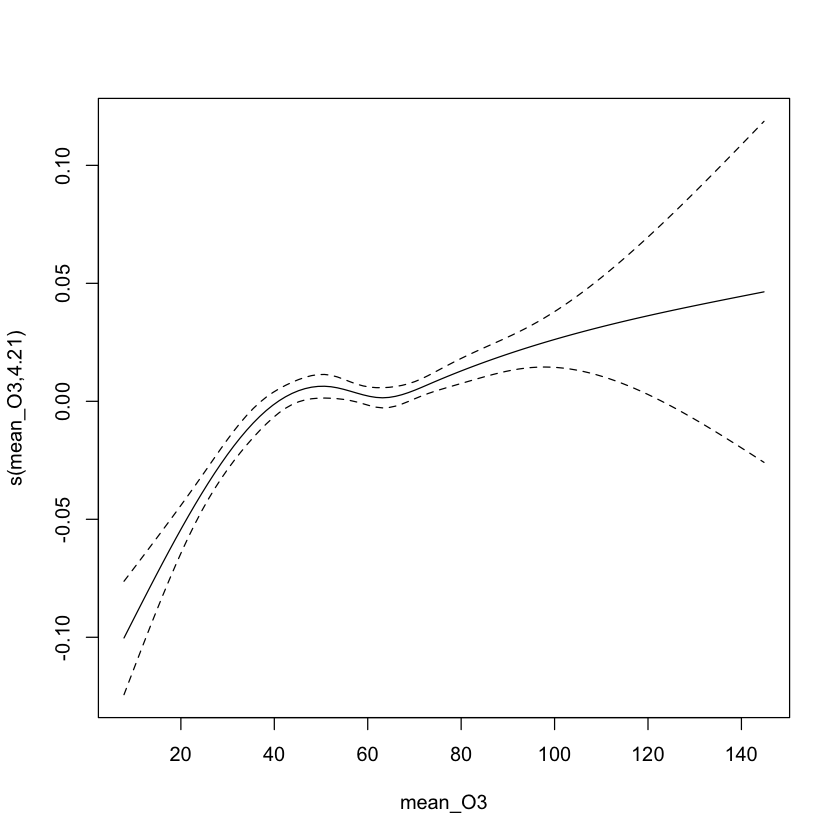

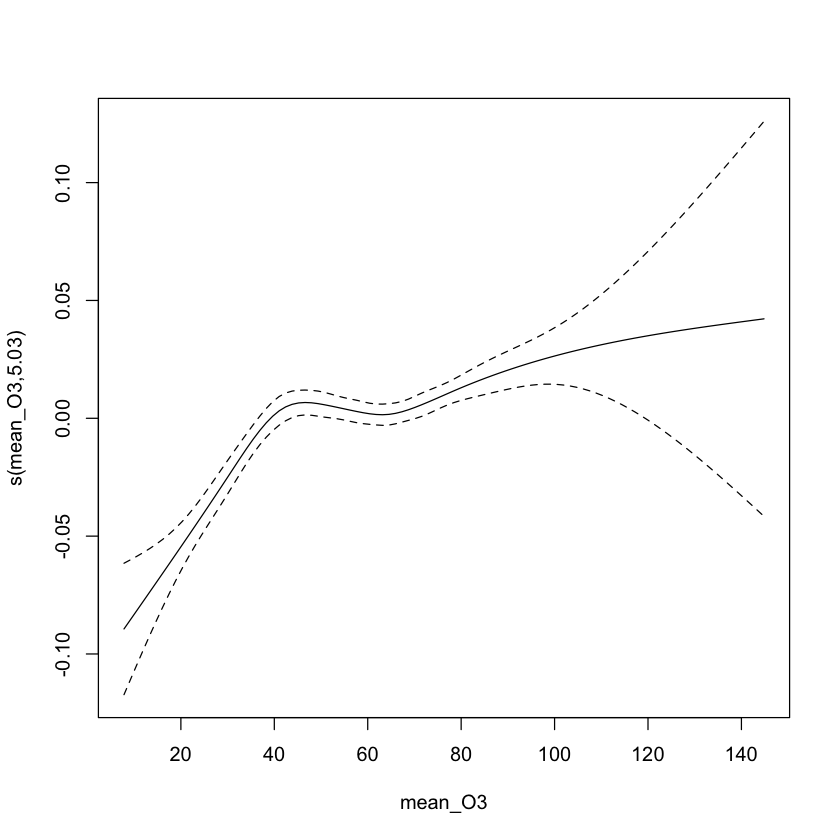

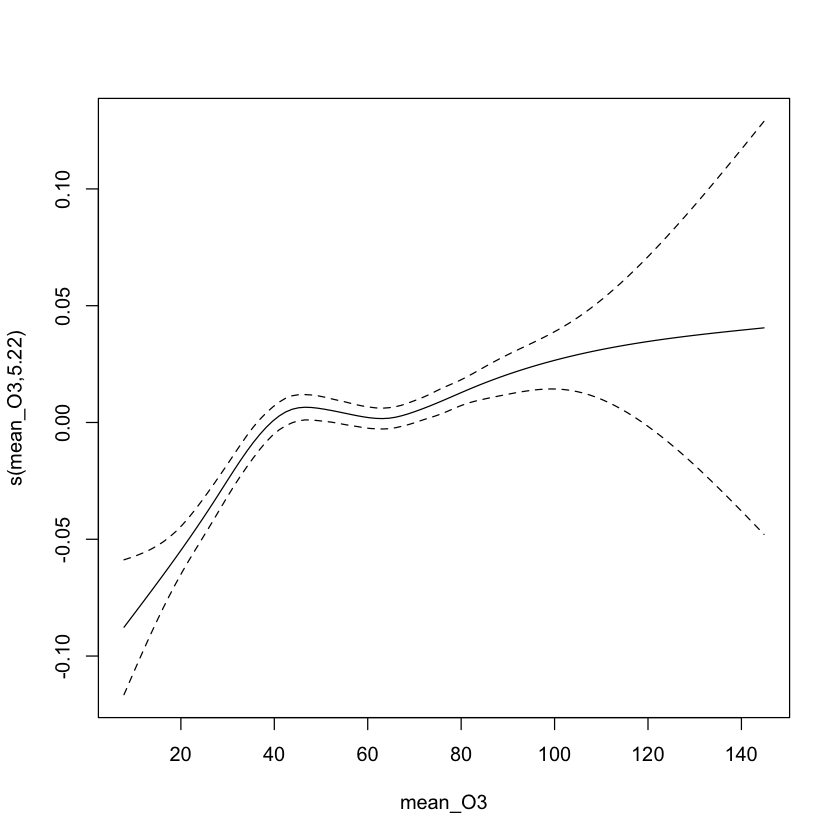

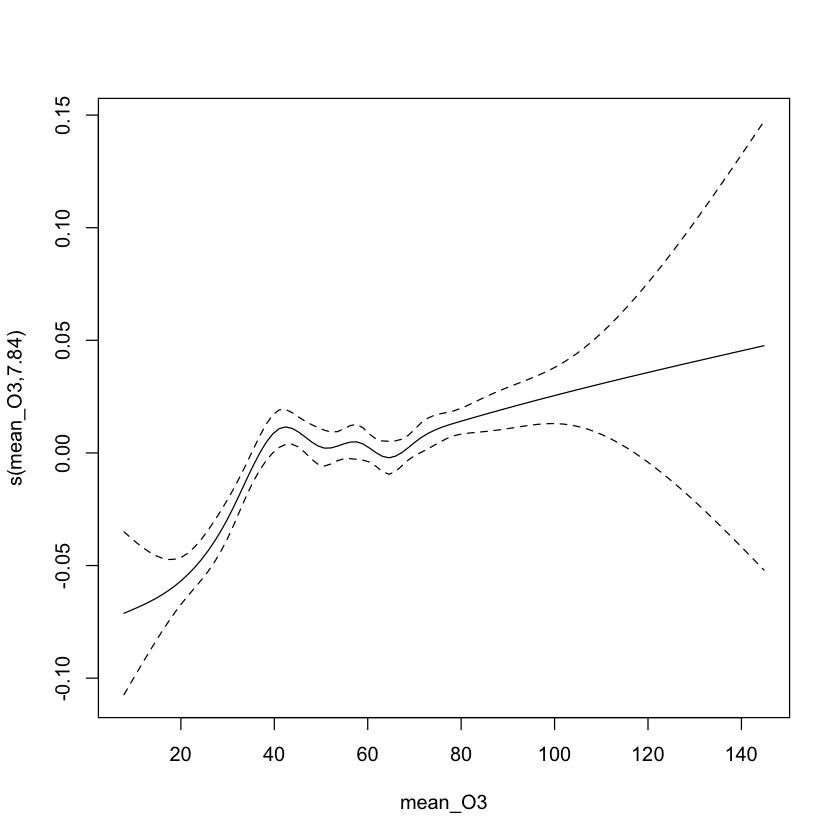

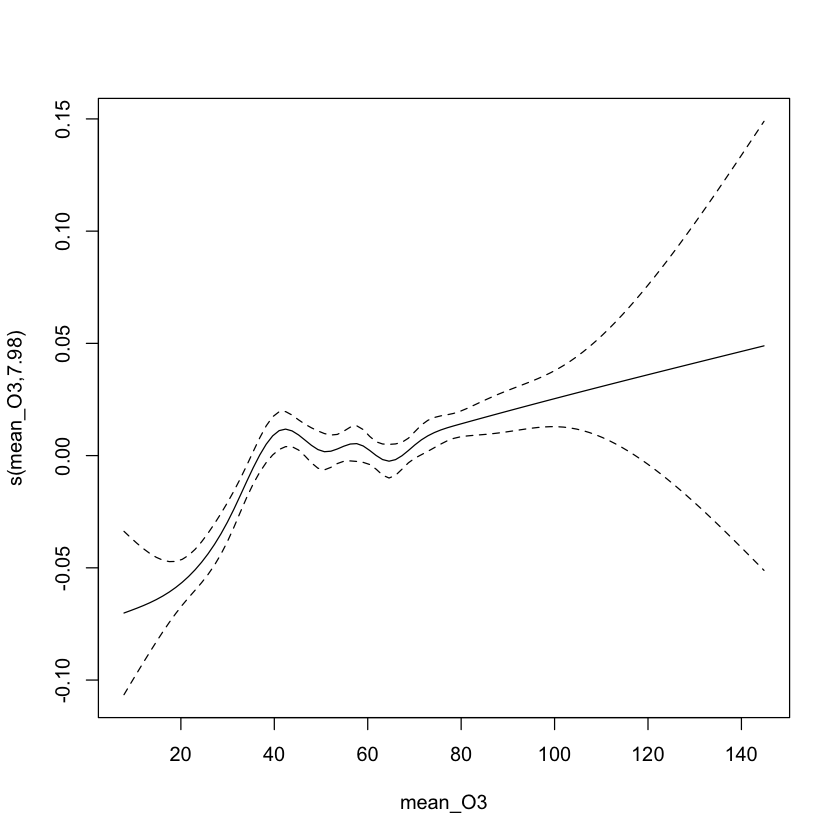

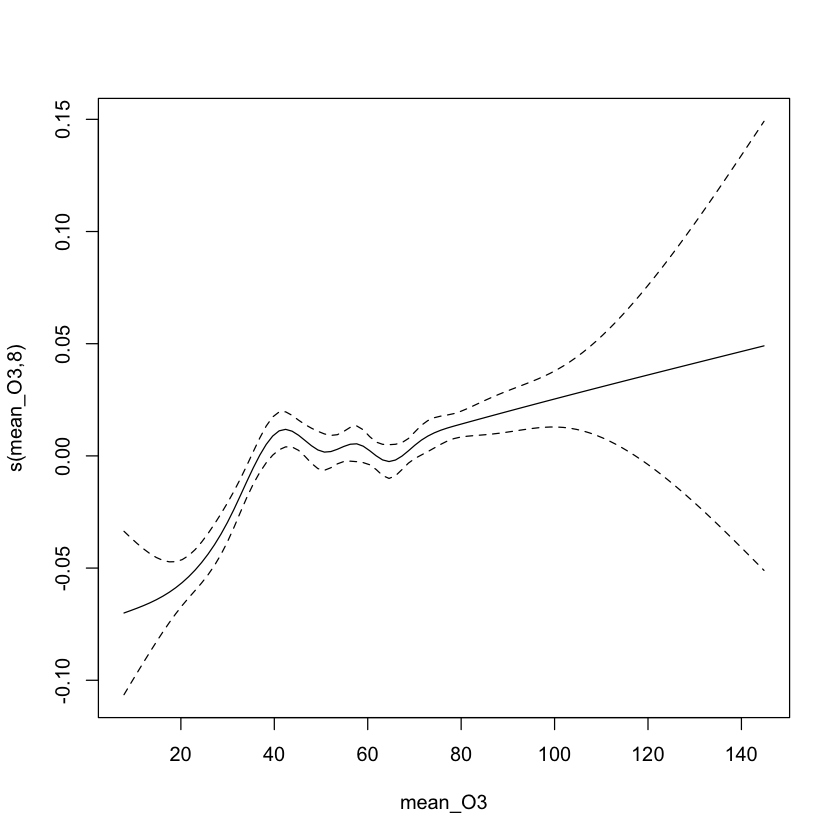


Method: REML   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-4.032172e-07,-4.032172e-07]
(score -24696.25 & scale 0.04986726).
Hessian positive definite, eigenvalue range [12735.5,12735.5].
Model rank =  18 / 18 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

             k'  edf k-index p-value  
s(mean_O3) 8.00 7.98    0.97    0.08 .
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


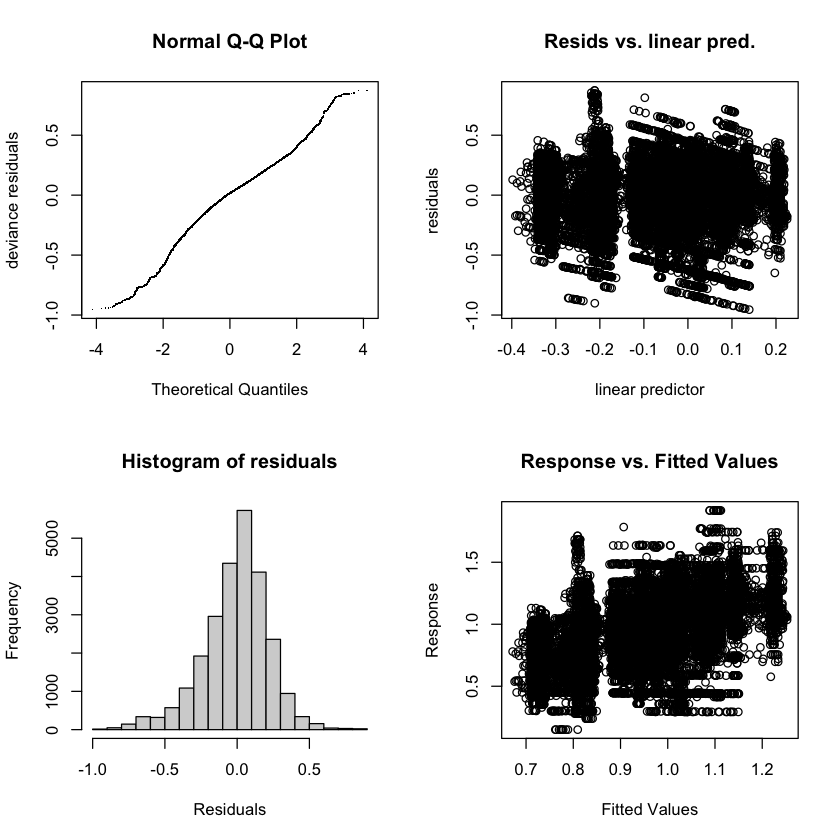

In [16]:
#======== No of KNOTS ========

mod_gam_O3_cat_3 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 3) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_O3_cat_6 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 6) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_O3_cat_9 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())
mod_gam_O3_cat_12 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 12) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson())

plot(mod_gam_O3_cat_3)
plot(mod_gam_O3_cat_6)
plot(mod_gam_O3_cat_9)
plot(mod_gam_O3_cat_12)

#======== Smoothing Parameters  ========
mod_gam_O3_sp10 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=10)
mod_gam_O3_sp1 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=1)
mod_gam_O3_sp01 = gam(a_asir_90 ~ s(mean_O3, bs = "cs", k = 9) + year + season, data = environment,  method = "REML", fAMIly = quasipoisson(), sp=0.1)

plot(mod_gam_O3_sp10)
plot(mod_gam_O3_sp1)
plot(mod_gam_O3_sp01)

gam.check(mod_gam_O3_sp1)


## TOGETHER


Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + s(mean_NO, bs = "cs", k = 9) + s(mean_NO2, bs = "cs", 
    k = 9) + s(mean_CO, bs = "cs", k = 9) + year + month

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.291686   0.009735 -29.961  < 2e-16 ***
year11       0.043197   0.008245   5.239 1.63e-07 ***
year12       0.183504   0.008019  22.884  < 2e-16 ***
year13       0.272961   0.007832  34.853  < 2e-16 ***
year14       0.242117   0.007967  30.389  < 2e-16 ***
year15       0.303917   0.007819  38.869  < 2e-16 ***
year16       0.342662   0.007773  44.084  < 2e-16 ***
year17       0.390913   0.007591  51.495  < 2e-16 ***
year18       0.500373   0.007746  64.597  < 2e-16 ***
month02     -0.003102   0.008553  -0.363    0.717    
month03     -0.039736   0.009286  -4.279 1.89e-05 ***
month04     

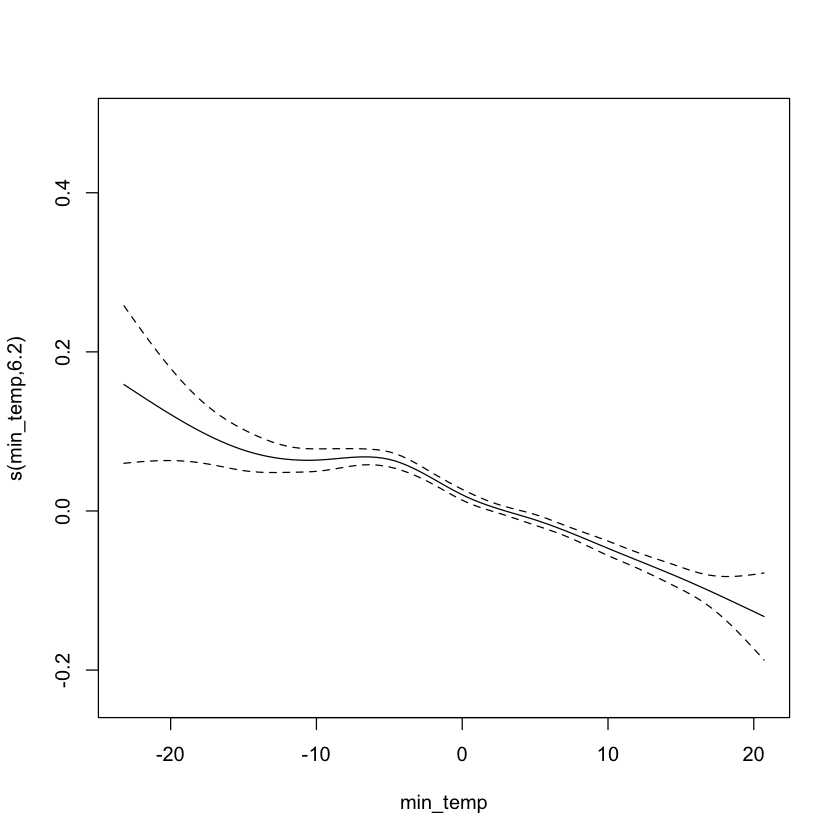

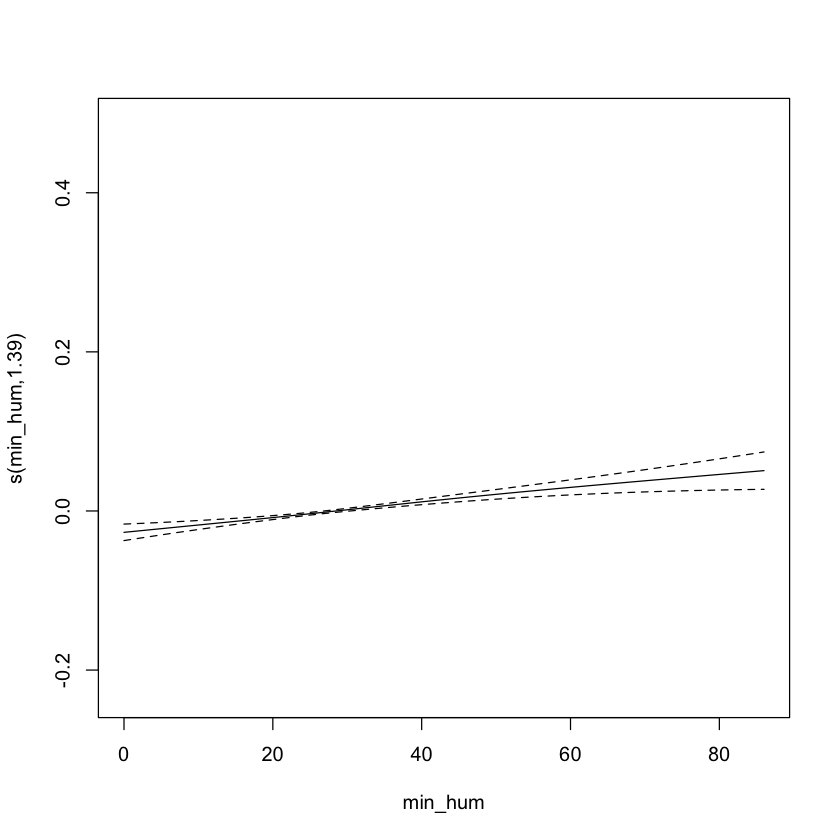

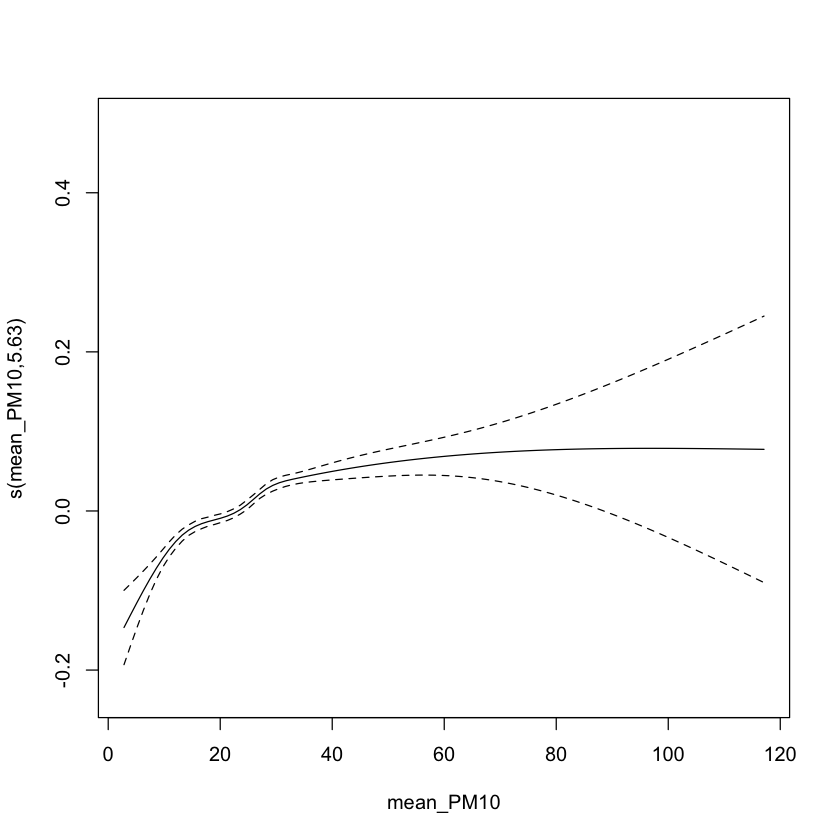

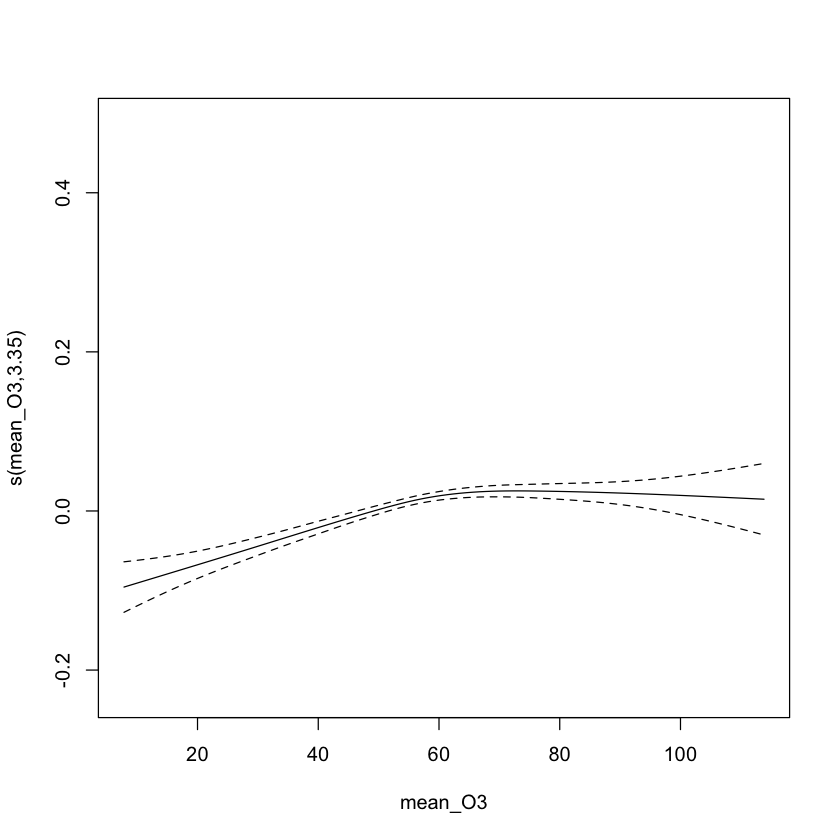

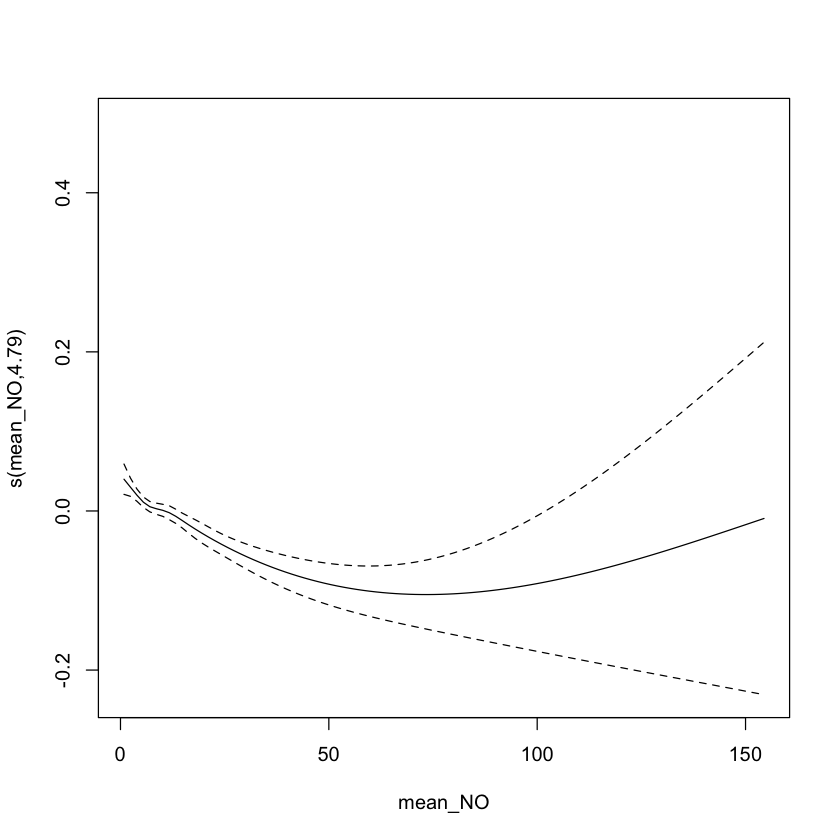

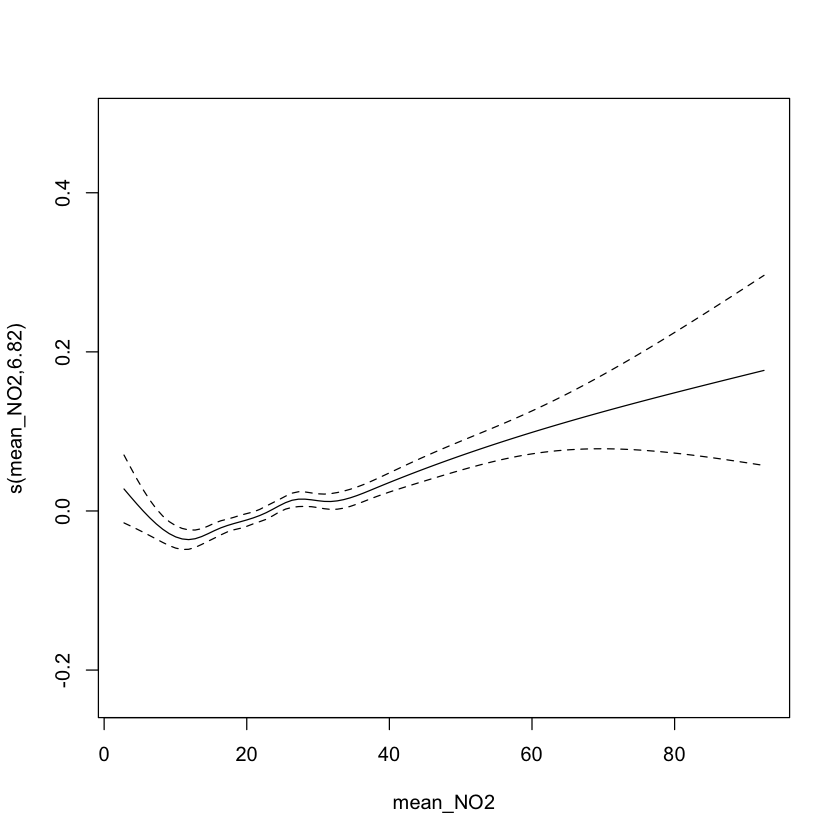

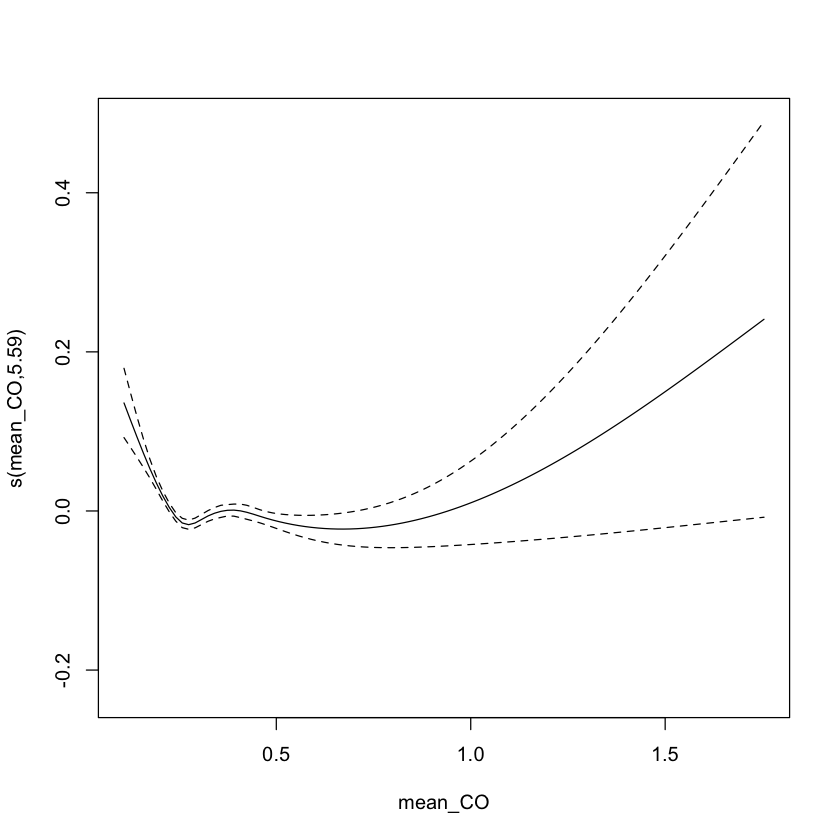


Method: GCV   Optimizer: outer newton
full convergence after 4 iterations.
Gradient range [-3.183664e-11,1.376474e-08]
(score 0.05120087 & scale 0.04807542).
Hessian positive definite, eigenvalue range [1.647844e-06,4.86255e-06].
Model rank =  76 / 76 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value   
s(min_temp)  8.00 6.20    0.99    0.34   
s(min_hum)   8.00 1.39    1.00    0.64   
s(mean_PM10) 8.00 5.63    1.01    0.70   
s(mean_O3)   8.00 3.35    0.99    0.34   
s(mean_NO)   8.00 4.79    0.99    0.23   
s(mean_NO2)  8.00 6.82    0.98    0.06 . 
s(mean_CO)   8.00 5.59    0.97    0.01 **
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


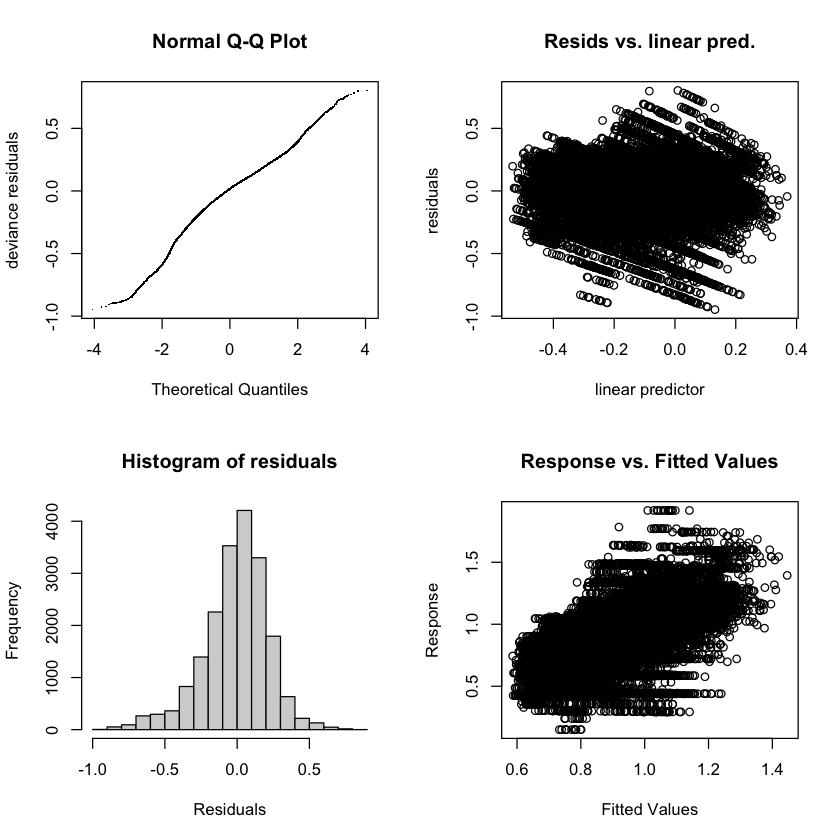

In [17]:
mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + s(mean_NO, bs = "cs", k = 9) + s(mean_NO2, bs = "cs", k = 9) + s(mean_CO, bs = "cs", k = 9) + year + month, data = environment, fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

## ONLY SEASONS


Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.165307   0.008508 -19.430  < 2e-16 ***
year11      -0.022074   0.011173  -1.976   0.0483 *  
year12       0.081994   0.011027   7.436 1.34e-13 ***
year13       0.226872   0.010666  21.271  < 2e-16 ***
year14       0.217345   0.010683  20.345  < 2e-16 ***
year15       0.289541   0.010684  27.101  < 2e-16 ***
year16       0.271409   0.010606  25.590  < 2e-16 ***
year17       0.316314   0.010635  29.743  < 2e-16 ***
year18       0.350283   0.010994  31.863  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
               edf Ref.df      F p-value    
s(min_temp)  3.243      8 10.609  <2e-16 ***
s(min_hum)   2.812      8  

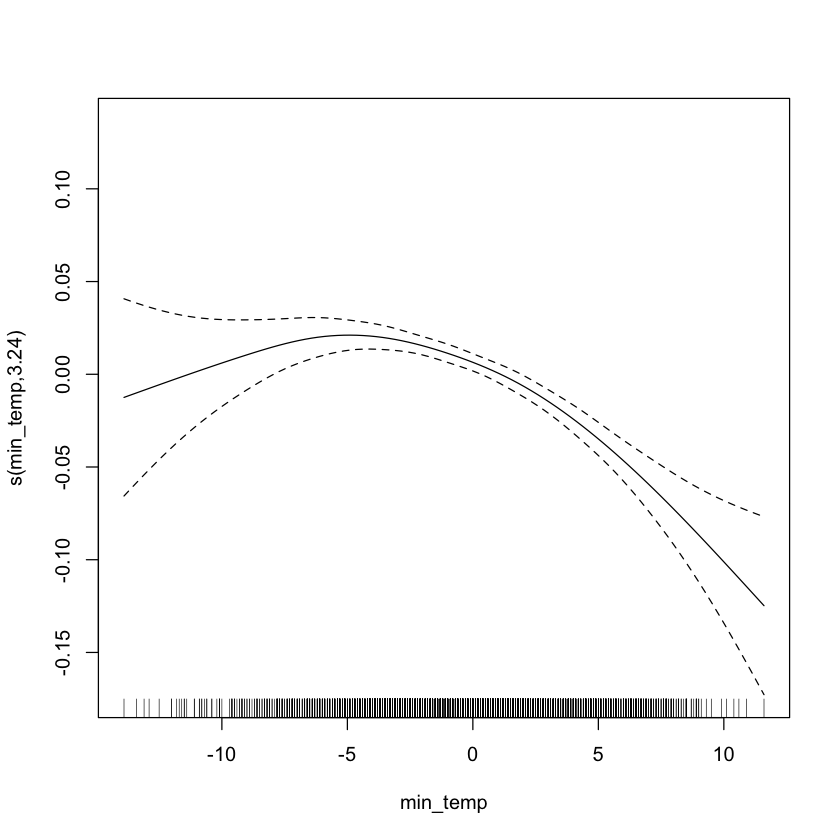

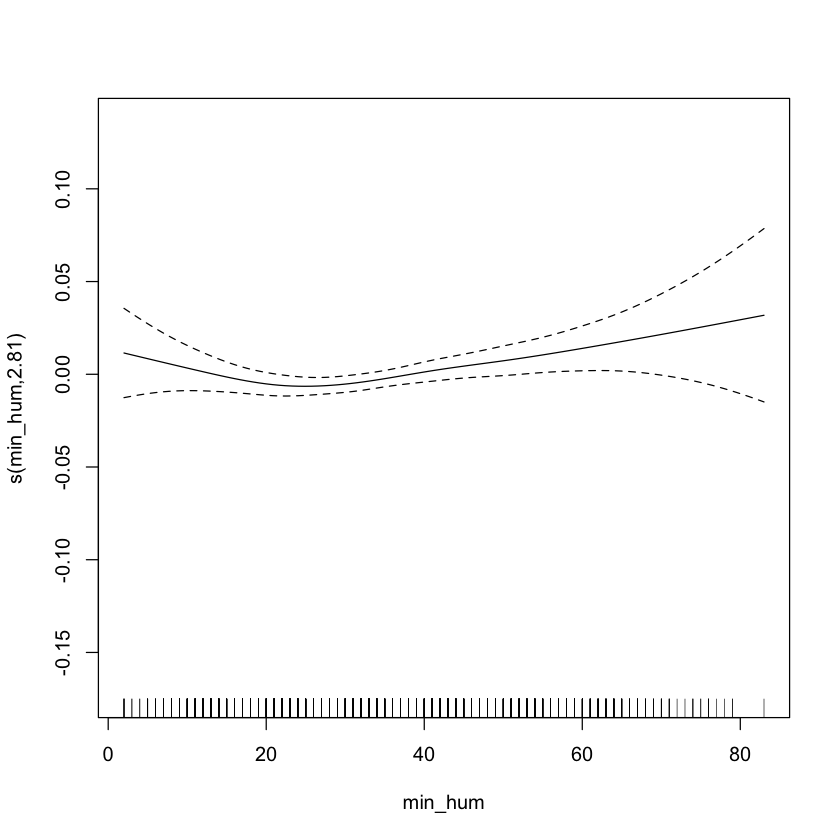

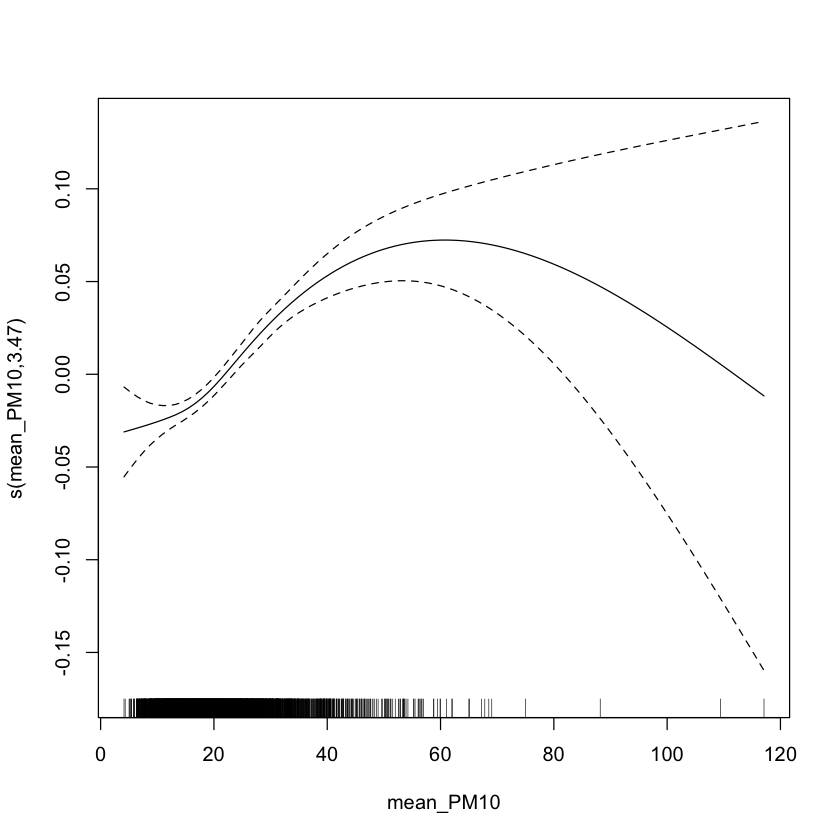

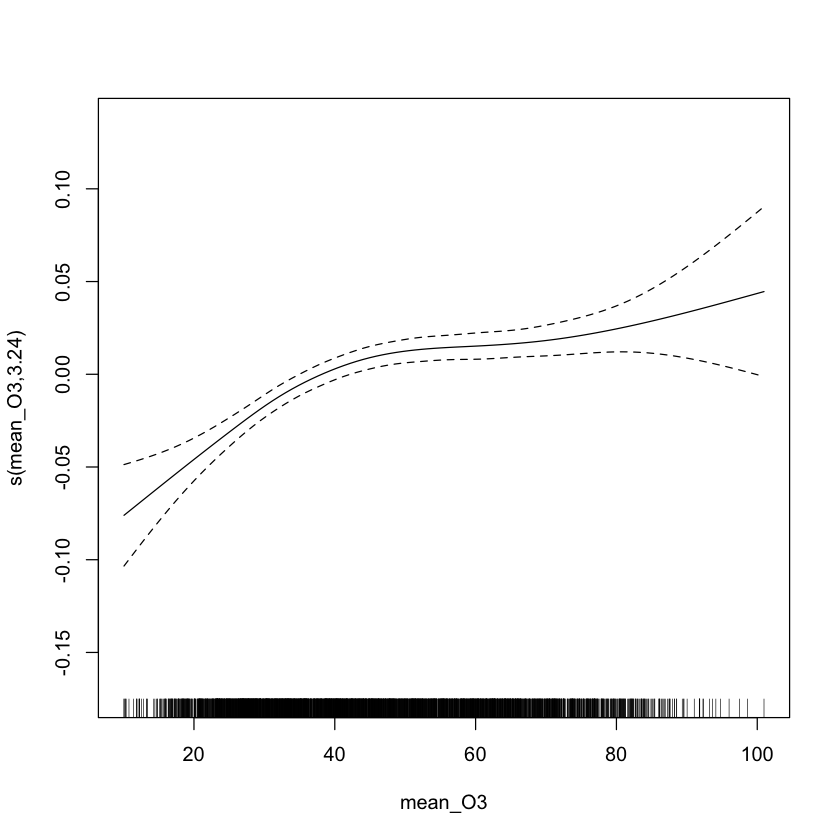


Method: GCV   Optimizer: outer newton
full convergence after 5 iterations.
Gradient range [-2.207672e-14,1.071893e-12]
(score 0.01588142 & scale 0.01573354).
Hessian positive definite, eigenvalue range [3.373019e-06,8.563771e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value    
s(min_temp)  8.00 3.24    0.55  <2e-16 ***
s(min_hum)   8.00 2.81    0.37  <2e-16 ***
s(mean_PM10) 8.00 3.47    0.96   0.015 *  
s(mean_O3)   8.00 3.24    1.00   0.565    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1



Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.165307   0.008508 -19.430  < 2e-16 ***
year11      -0.022074   0.011173  -1.976   0.0483 *  
year12       0.081994   0.011027   7.436 1.34e-13 ***
year13       0.226872   0.010666  21.271  < 2e-16 ***
year14       0.217345   0.010683  20.345  < 2e-16 ***
year15       0.289541   0.010684  27.101  < 2e-16 ***
year16       0.271409   0.010606  25.590  < 2e-16 ***
year17       0.316314   0.010635  29.743  < 2e-16 ***
year18       0.350283   0.010994  31.863  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
               edf Ref.df      F p-value    
s(min_temp)  3.243      8 10.609  <2e-16 ***
s(min_hum)   2.812      8  

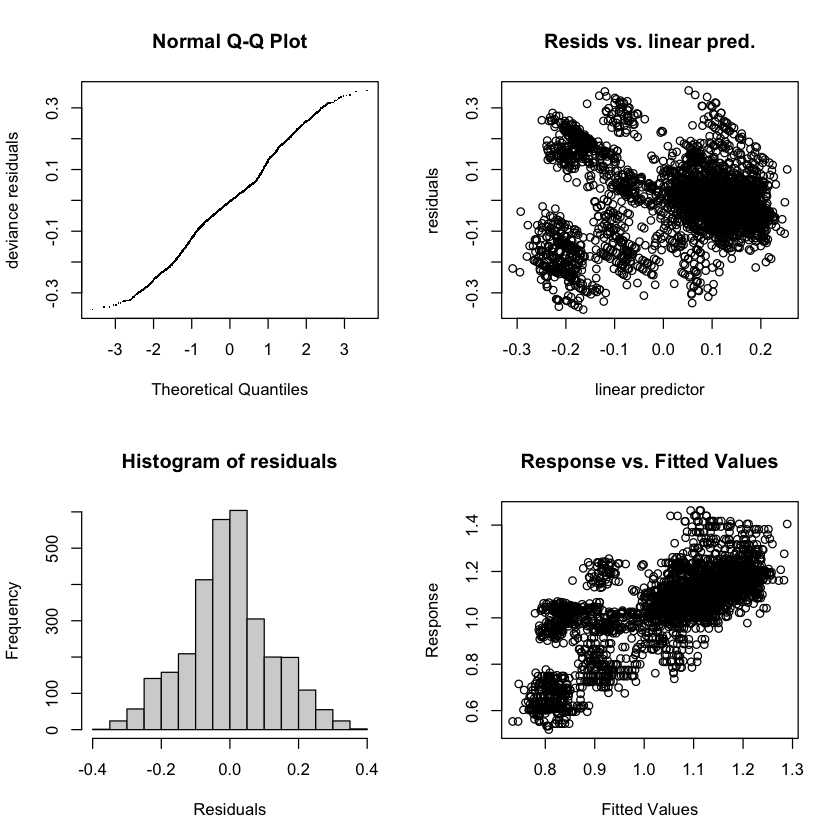

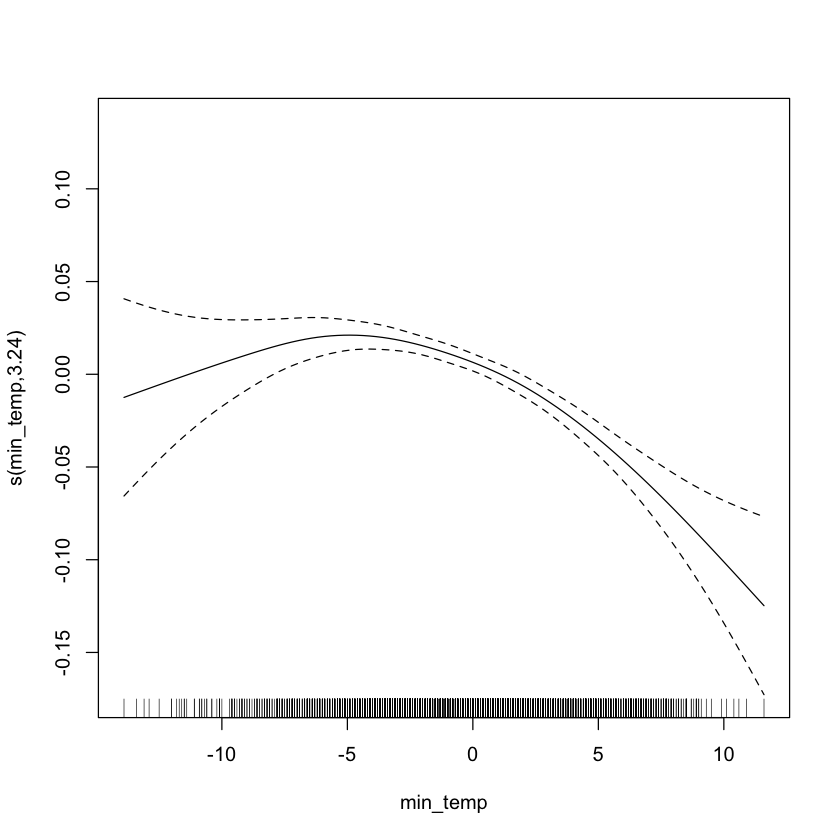

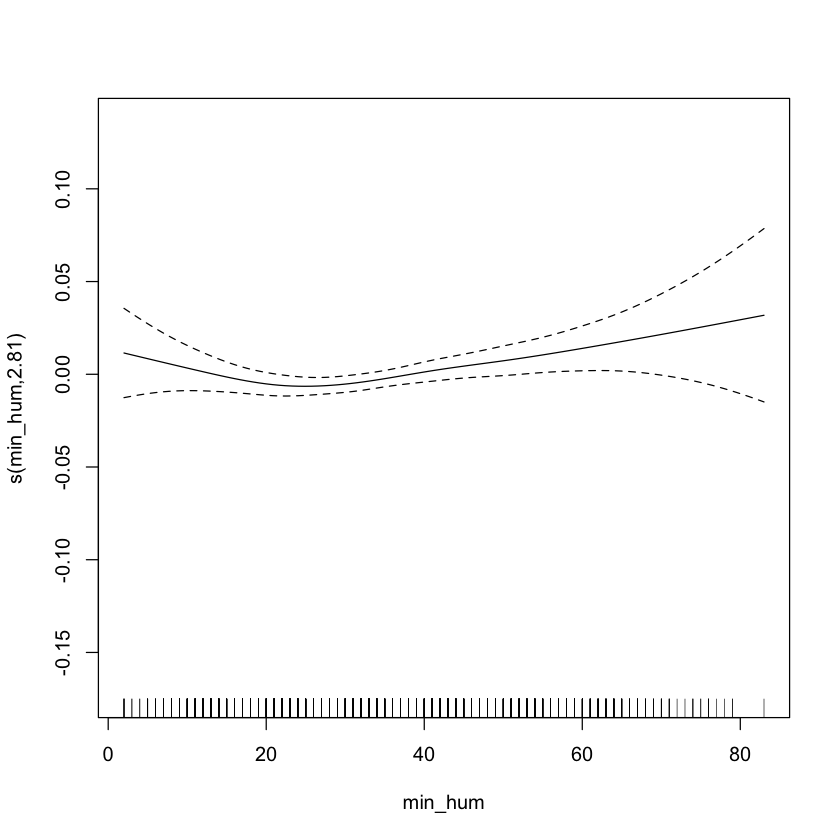

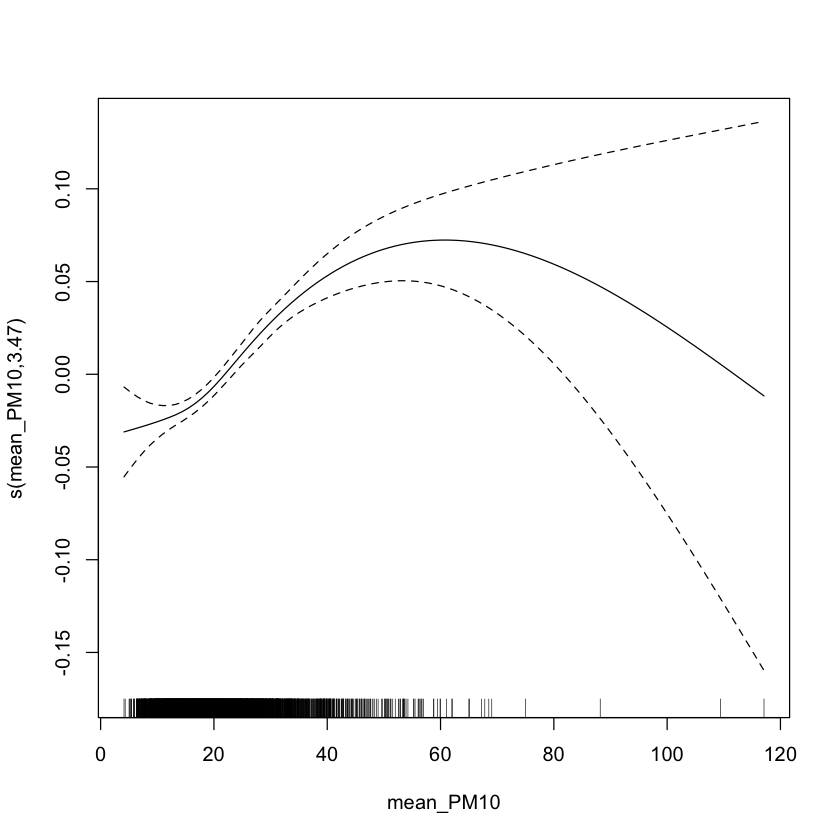

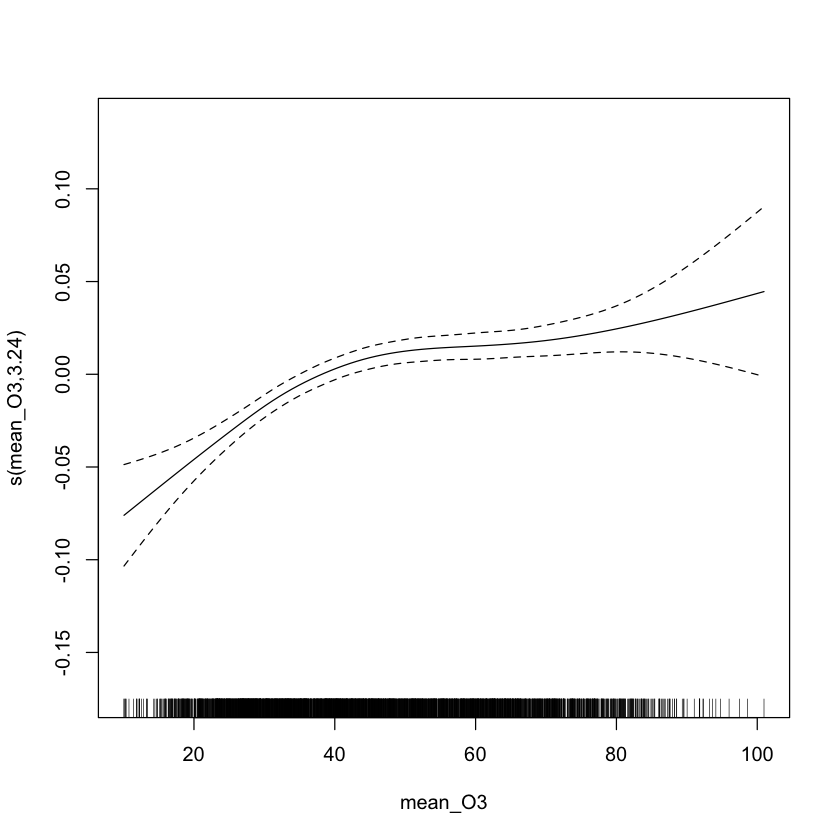


Method: GCV   Optimizer: outer newton
full convergence after 5 iterations.
Gradient range [-2.207672e-14,1.071893e-12]
(score 0.01588142 & scale 0.01573354).
Hessian positive definite, eigenvalue range [3.373019e-06,8.563771e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value    
s(min_temp)  8.00 3.24    0.55  <2e-16 ***
s(min_hum)   8.00 2.81    0.37  <2e-16 ***
s(mean_PM10) 8.00 3.47    0.96    0.01 ** 
s(mean_O3)   8.00 3.24    1.00    0.57    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


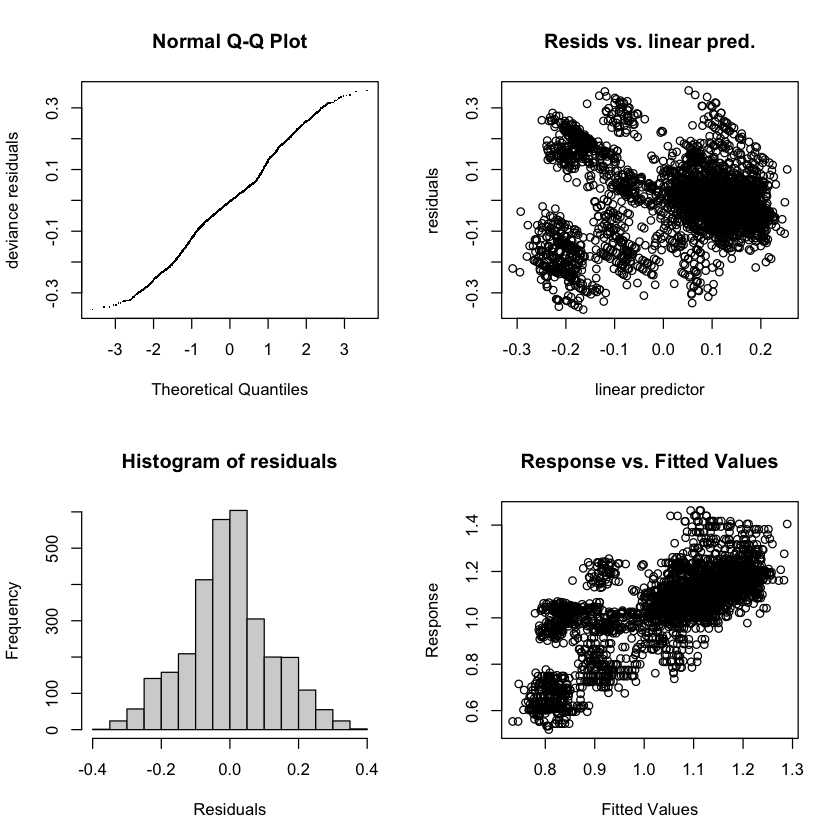

In [18]:
mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT01","AT03")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT01","AT03")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)


Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.018853   0.004577   4.119 4.01e-05 ***
year11      -0.015149   0.006029  -2.513   0.0121 *  
year12       0.029911   0.006037   4.955 8.04e-07 ***
year13       0.090036   0.005903  15.251  < 2e-16 ***
year14       0.037526   0.005961   6.295 4.01e-10 ***
year15       0.079440   0.005944  13.364  < 2e-16 ***
year16       0.088348   0.005947  14.857  < 2e-16 ***
year17       0.147549   0.005884  25.078  < 2e-16 ***
year18       0.140021   0.006171  22.688  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
                edf Ref.df      F p-value    
s(min_temp)  3.6508      8  4.392  <2e-16 ***
s(min_hum)   0.1612      

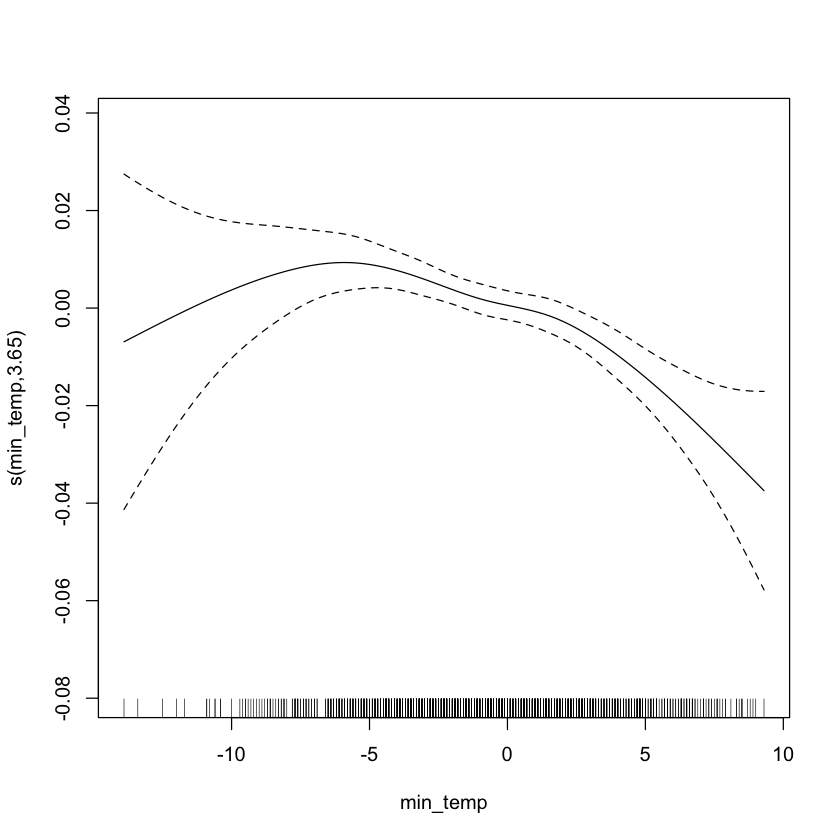

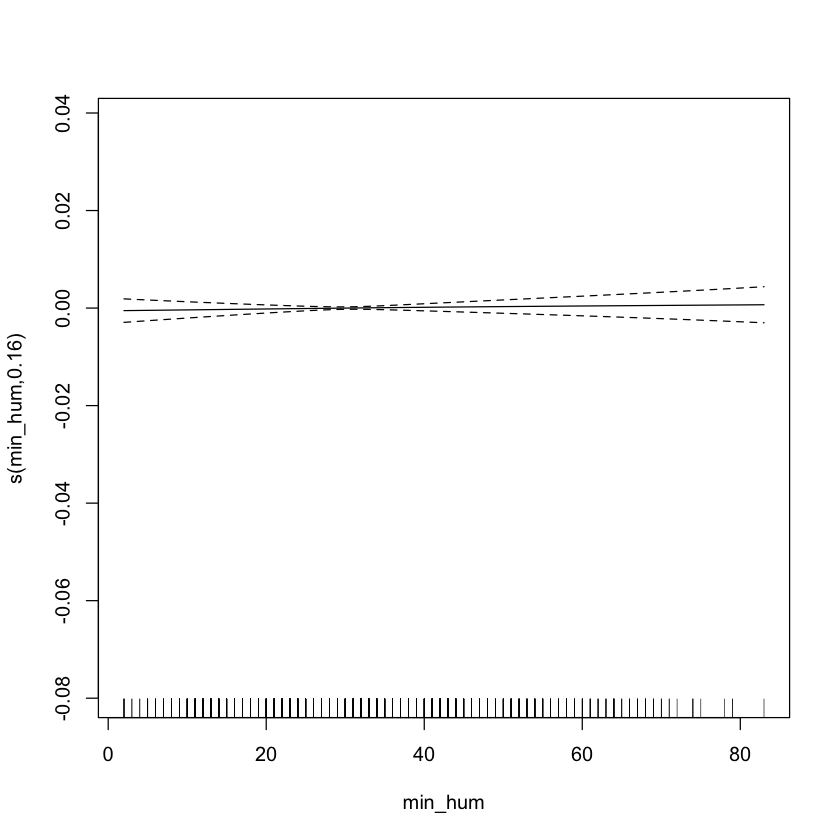

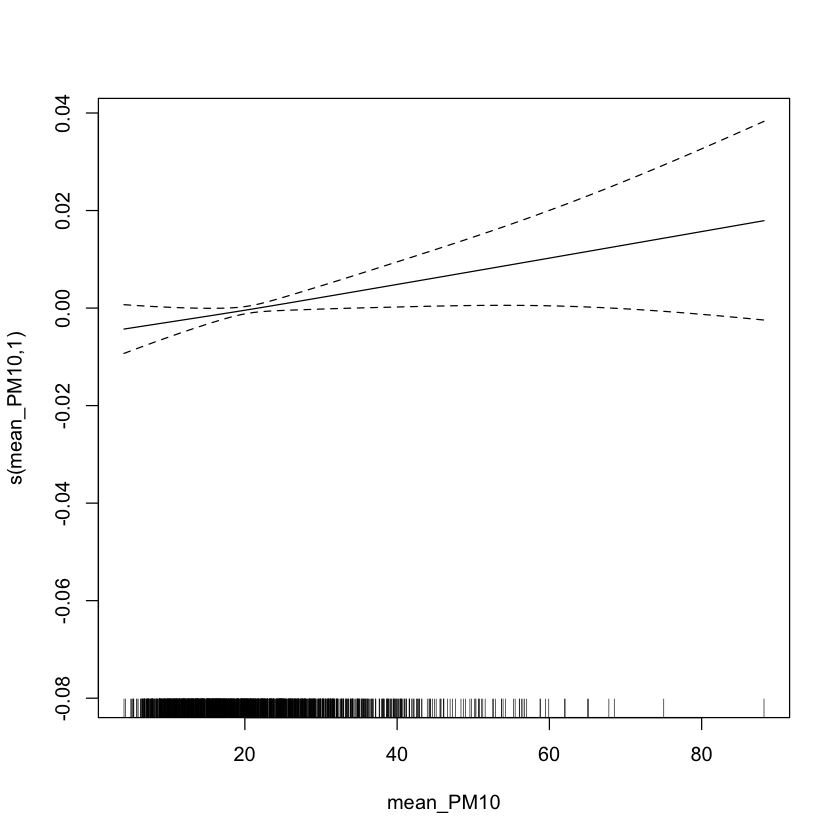

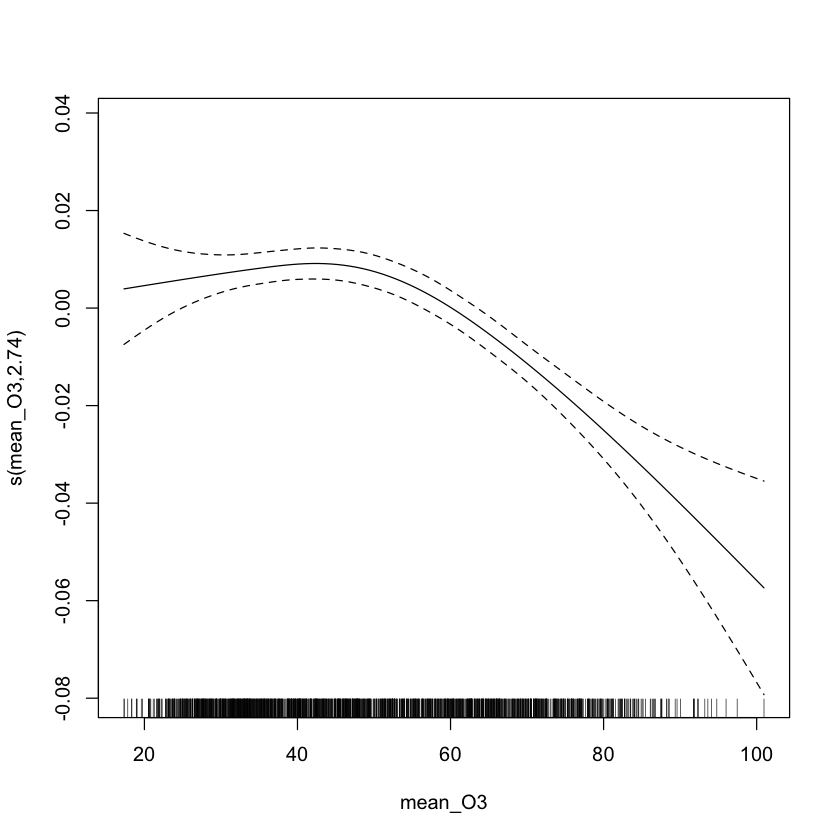


Method: GCV   Optimizer: outer newton
full convergence after 7 iterations.
Gradient range [-3.596213e-11,1.237412e-10]
(score 0.002783687 & scale 0.0027732).
Hessian positive definite, eigenvalue range [8.493343e-08,3.068504e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                k'   edf k-index p-value    
s(min_temp)  8.000 3.651    0.86  <2e-16 ***
s(min_hum)   8.000 0.161    0.67  <2e-16 ***
s(mean_PM10) 8.000 0.998    0.97   0.075 .  
s(mean_O3)   8.000 2.740    1.06   0.990    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1



Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.018853   0.004577   4.119 4.01e-05 ***
year11      -0.015149   0.006029  -2.513   0.0121 *  
year12       0.029911   0.006037   4.955 8.04e-07 ***
year13       0.090036   0.005903  15.251  < 2e-16 ***
year14       0.037526   0.005961   6.295 4.01e-10 ***
year15       0.079440   0.005944  13.364  < 2e-16 ***
year16       0.088348   0.005947  14.857  < 2e-16 ***
year17       0.147549   0.005884  25.078  < 2e-16 ***
year18       0.140021   0.006171  22.688  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
                edf Ref.df      F p-value    
s(min_temp)  3.6508      8  4.392  <2e-16 ***
s(min_hum)   0.1612      

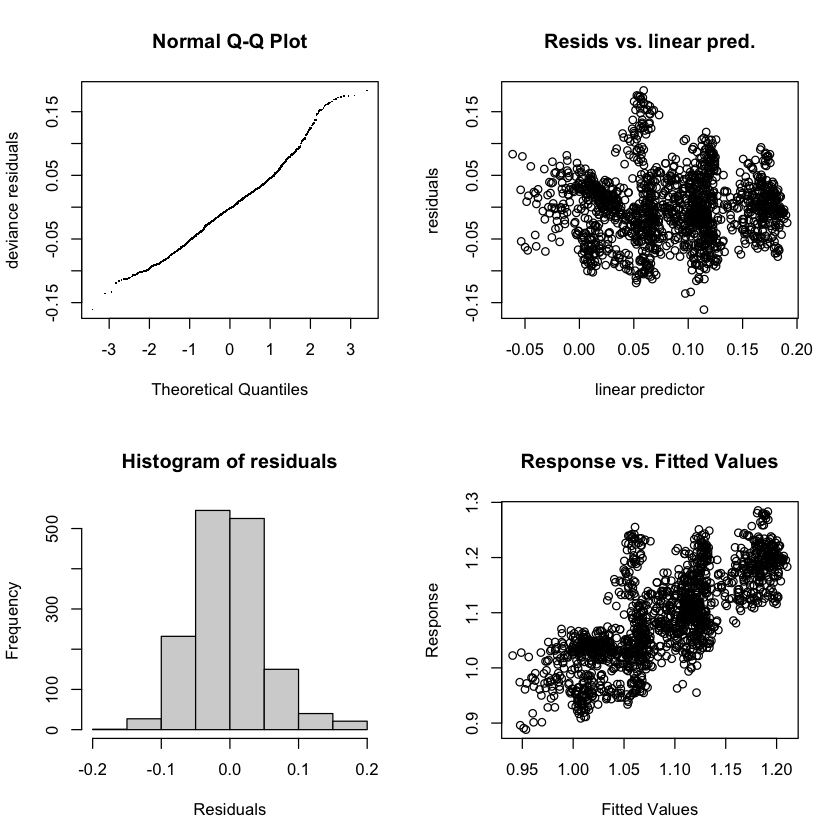

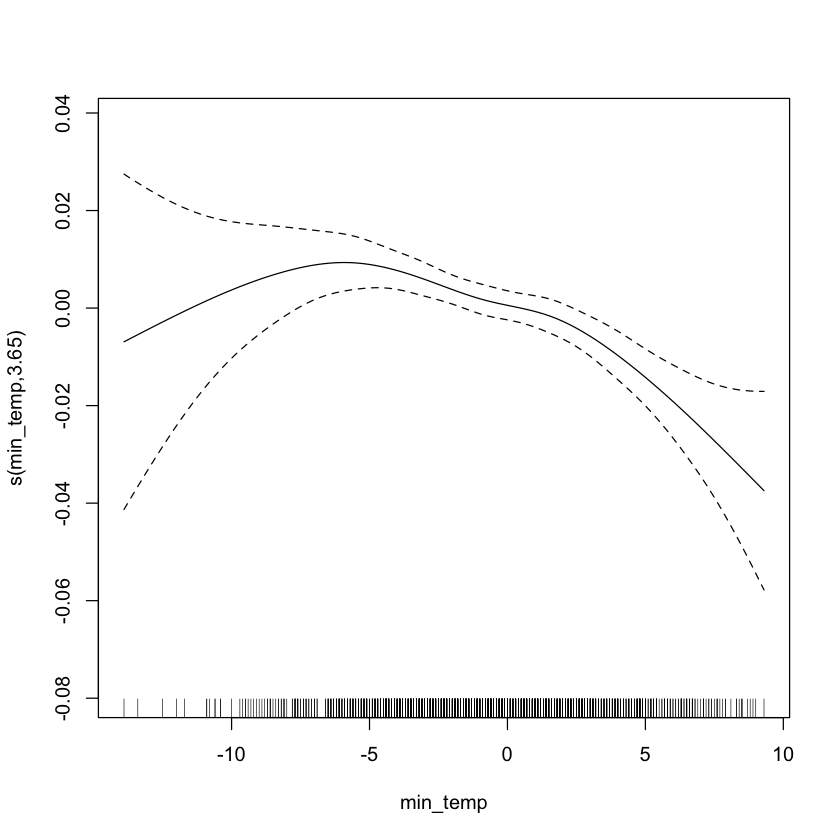

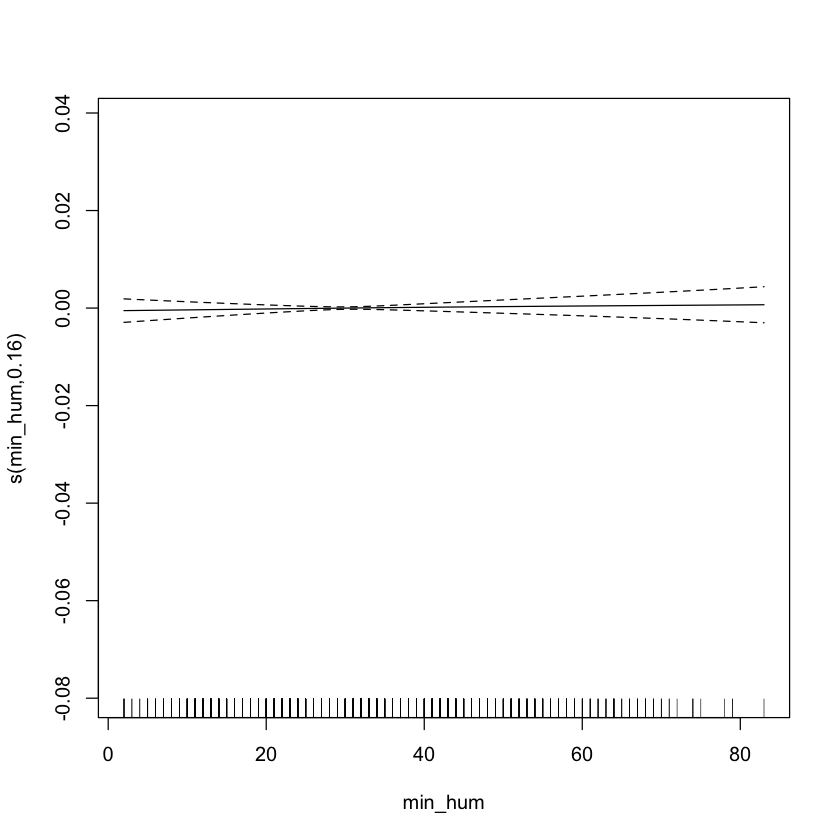

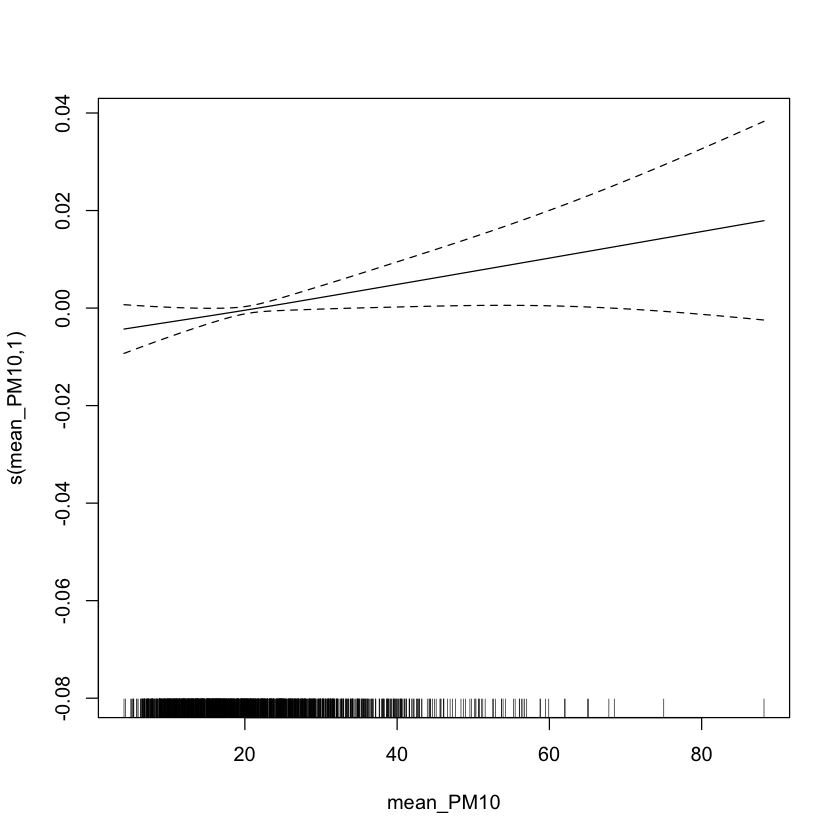

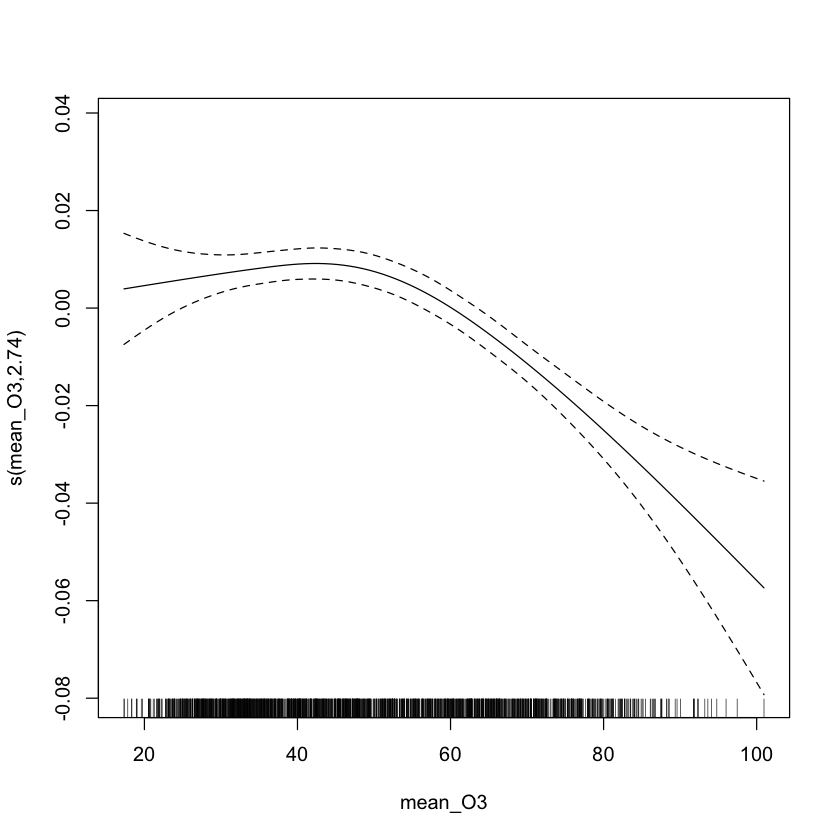


Method: GCV   Optimizer: outer newton
full convergence after 7 iterations.
Gradient range [-3.596213e-11,1.237412e-10]
(score 0.002783687 & scale 0.0027732).
Hessian positive definite, eigenvalue range [8.493343e-08,3.068504e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                k'   edf k-index p-value    
s(min_temp)  8.000 3.651    0.86  <2e-16 ***
s(min_hum)   8.000 0.161    0.67  <2e-16 ***
s(mean_PM10) 8.000 0.998    0.97    0.06 .  
s(mean_O3)   8.000 2.740    1.06    0.99    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1



Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.41012    0.01057  -38.79   <2e-16 ***
year11      -0.03238    0.01372   -2.36   0.0184 *  
year12       0.18407    0.01327   13.87   <2e-16 ***
year13       0.43057    0.01281   33.61   <2e-16 ***
year14       0.45297    0.01270   35.67   <2e-16 ***
year15       0.56541    0.01285   44.00   <2e-16 ***
year16       0.51011    0.01279   39.87   <2e-16 ***
year17       0.56072    0.01274   44.01   <2e-16 ***
year18       0.62132    0.01295   47.96   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
               edf Ref.df     F  p-value    
s(min_temp)  2.182      8 0.988 0.012777 *  
s(min_hum)   1.965      8 0.440 0.140

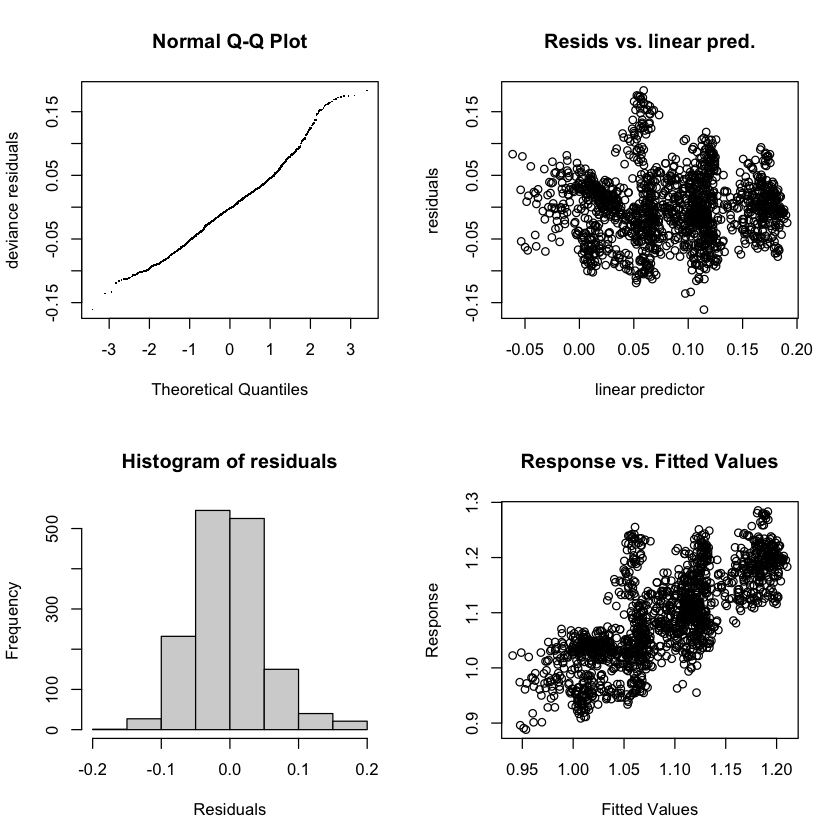

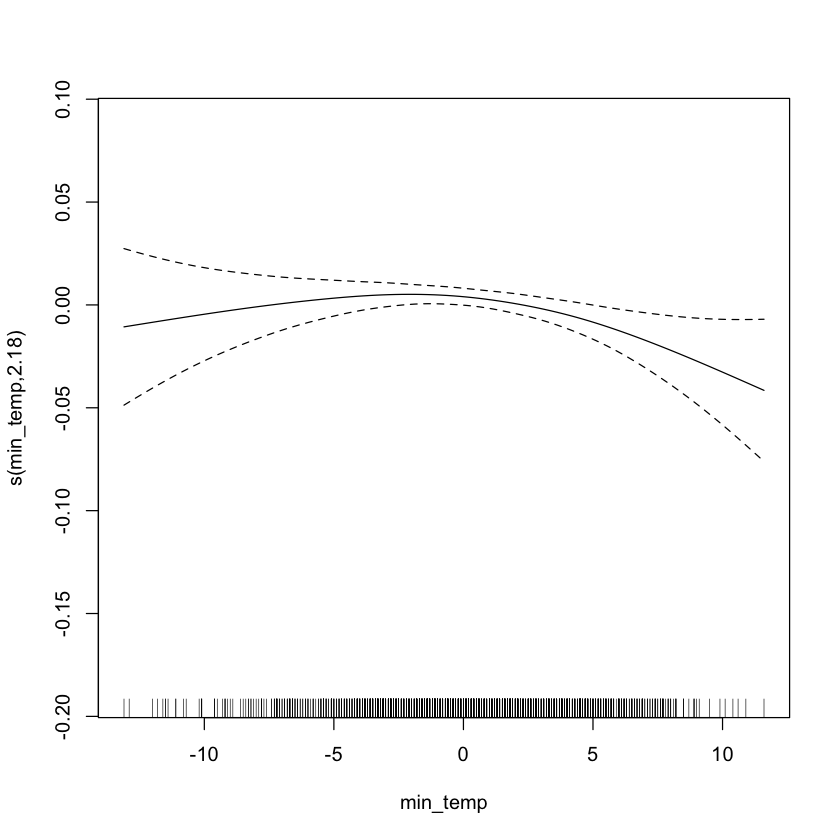

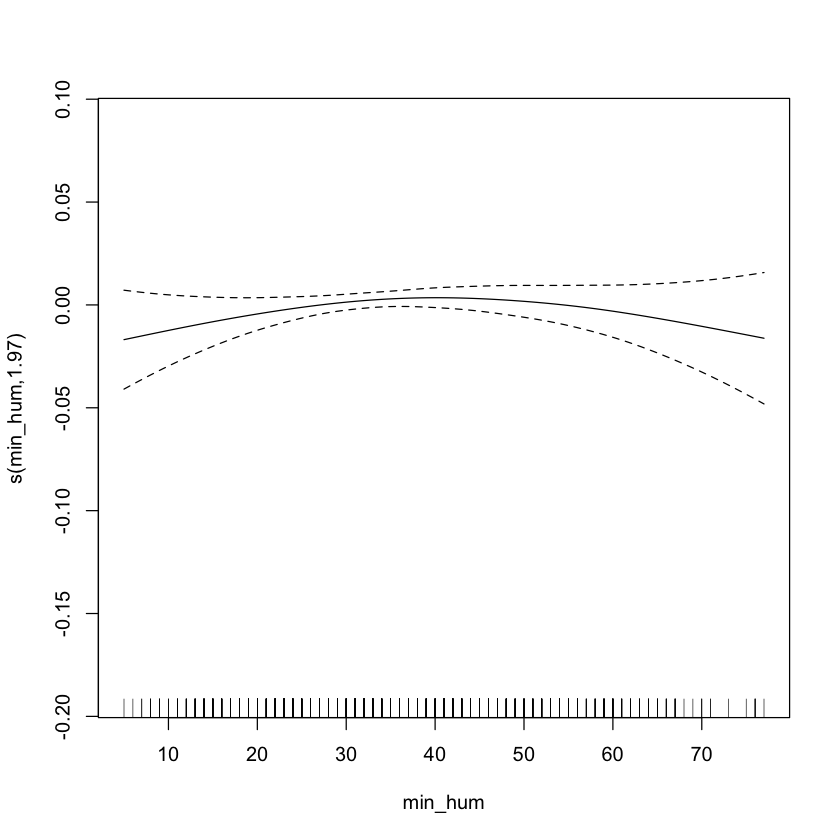

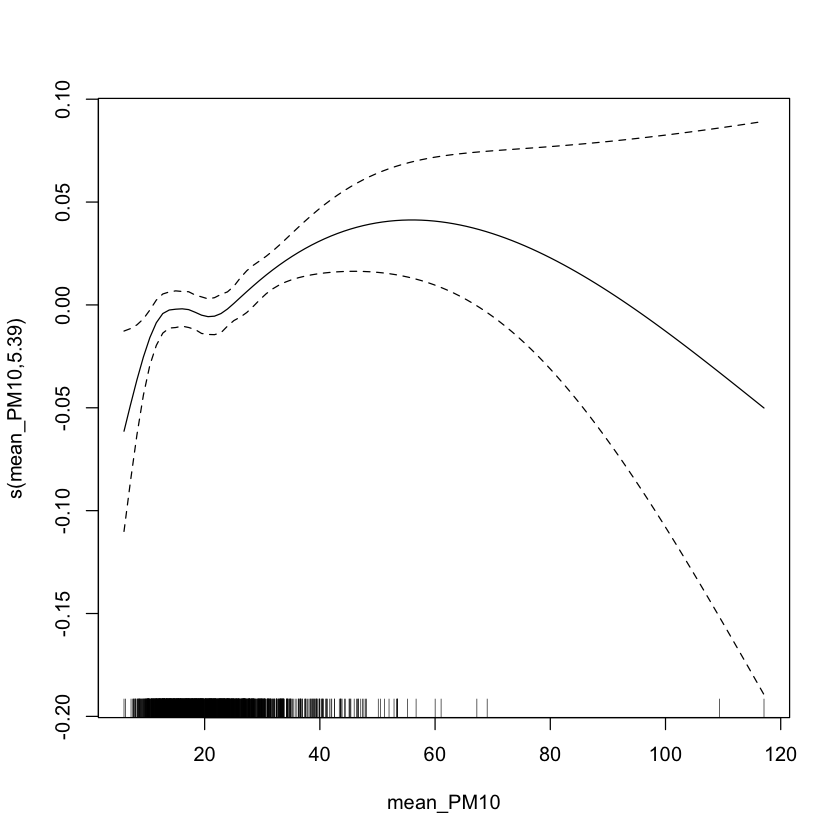

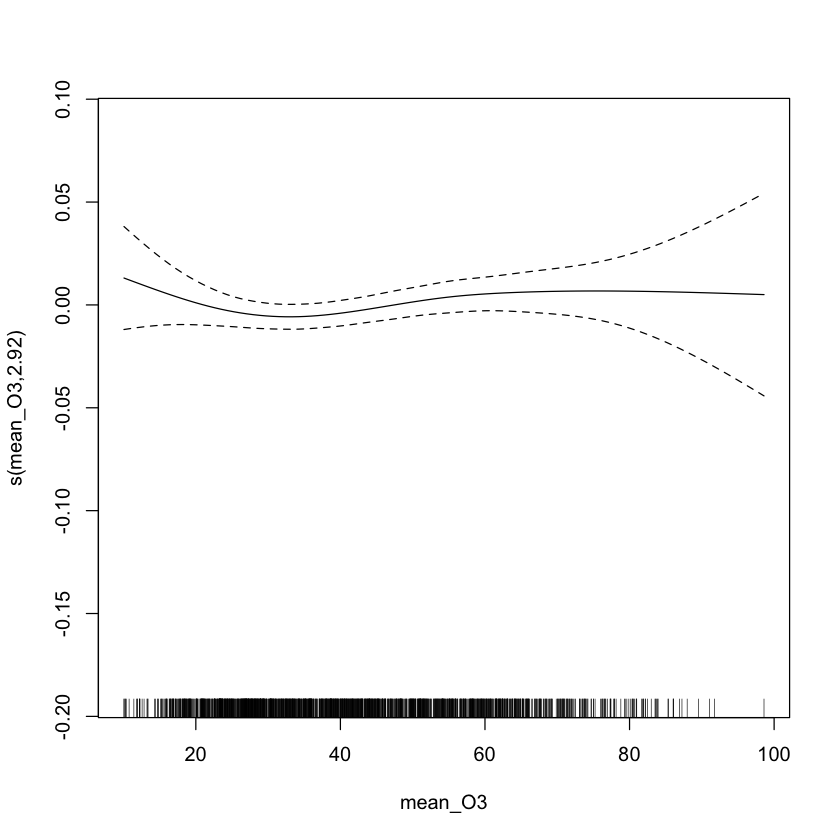


Method: GCV   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-1.387905e-09,2.129621e-10]
(score 0.009236035 & scale 0.009154391).
Hessian positive definite, eigenvalue range [1.239681e-06,5.245646e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value    
s(min_temp)  8.00 2.18    0.93   0.005 ** 
s(min_hum)   8.00 1.97    0.75  <2e-16 ***
s(mean_PM10) 8.00 5.39    0.98   0.205    
s(mean_O3)   8.00 2.92    1.02   0.735    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1



Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", 
    k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", 
    k = 9) + year

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.41012    0.01057  -38.79   <2e-16 ***
year11      -0.03238    0.01372   -2.36   0.0184 *  
year12       0.18407    0.01327   13.87   <2e-16 ***
year13       0.43057    0.01281   33.61   <2e-16 ***
year14       0.45297    0.01270   35.67   <2e-16 ***
year15       0.56541    0.01285   44.00   <2e-16 ***
year16       0.51011    0.01279   39.87   <2e-16 ***
year17       0.56072    0.01274   44.01   <2e-16 ***
year18       0.62132    0.01295   47.96   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth terms:
               edf Ref.df     F  p-value    
s(min_temp)  2.182      8 0.988 0.012777 *  
s(min_hum)   1.965      8 0.440 0.140

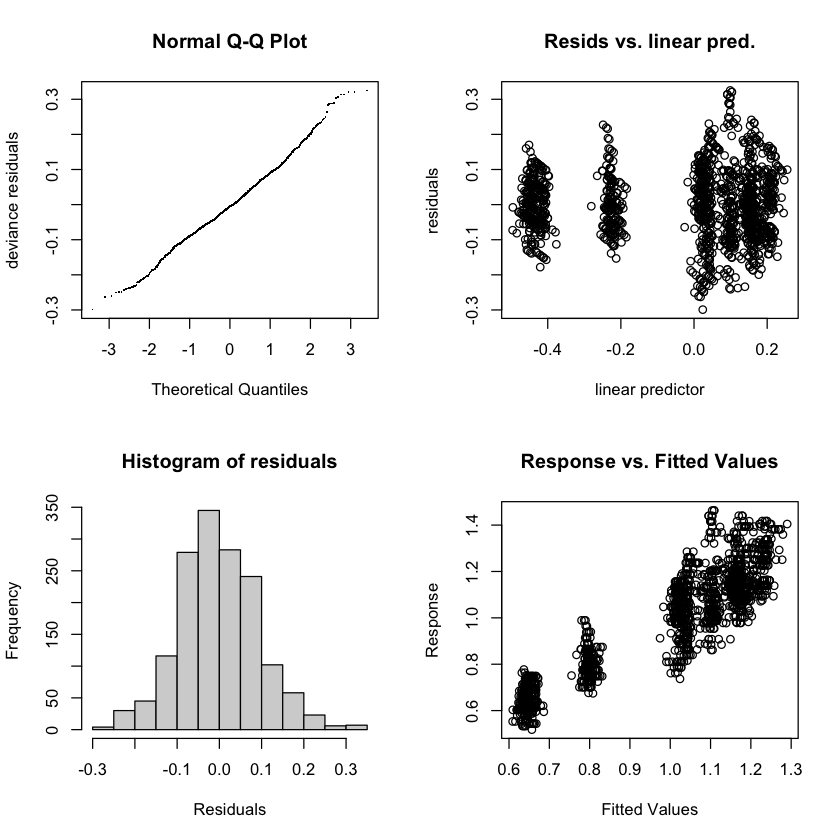

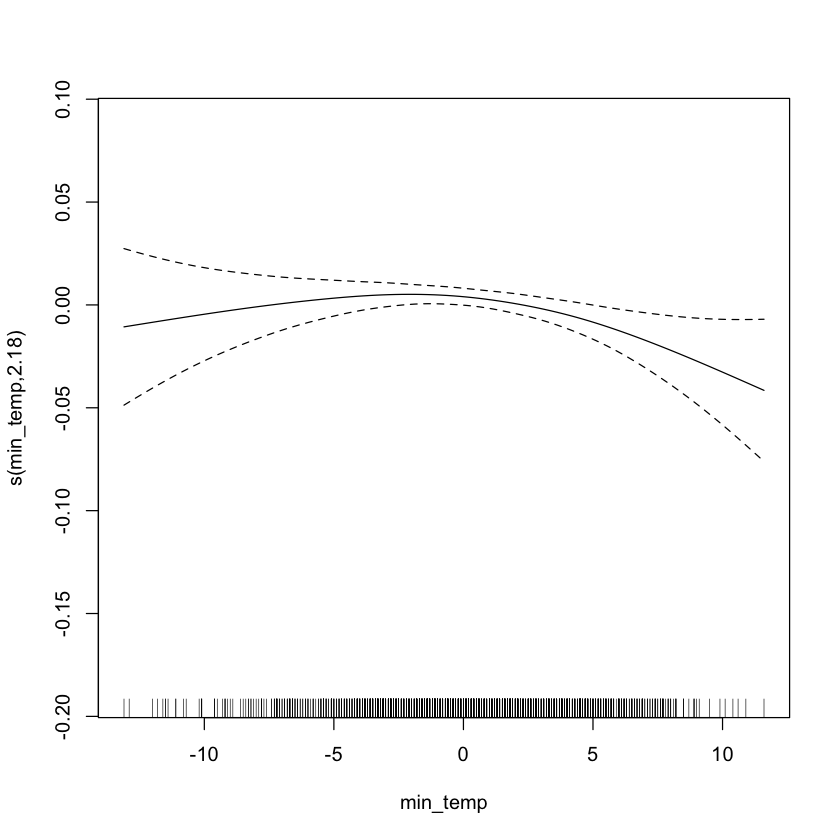

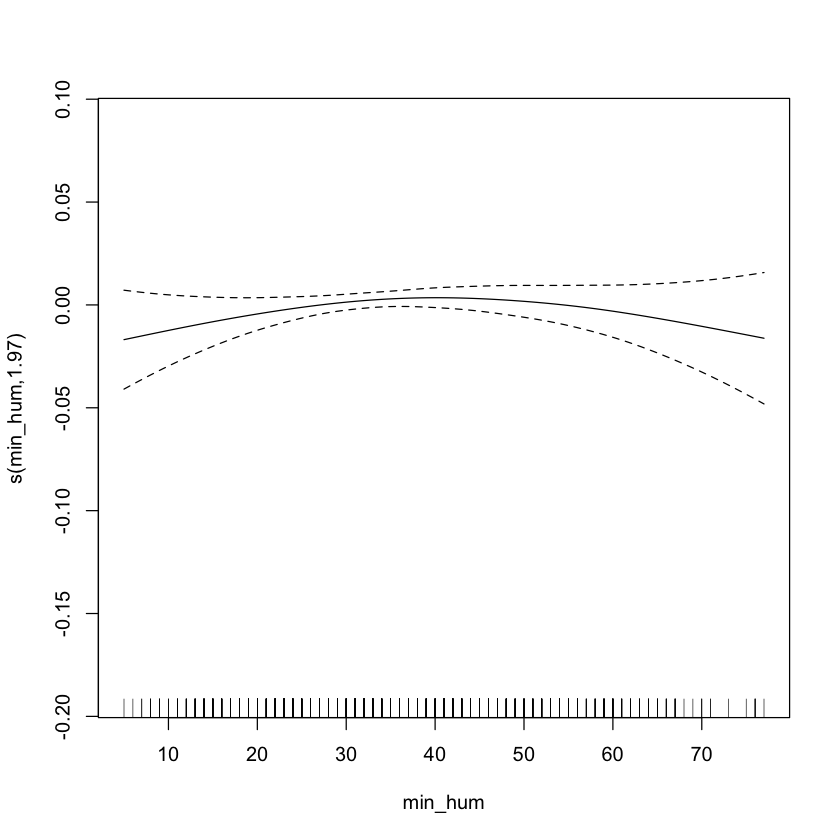

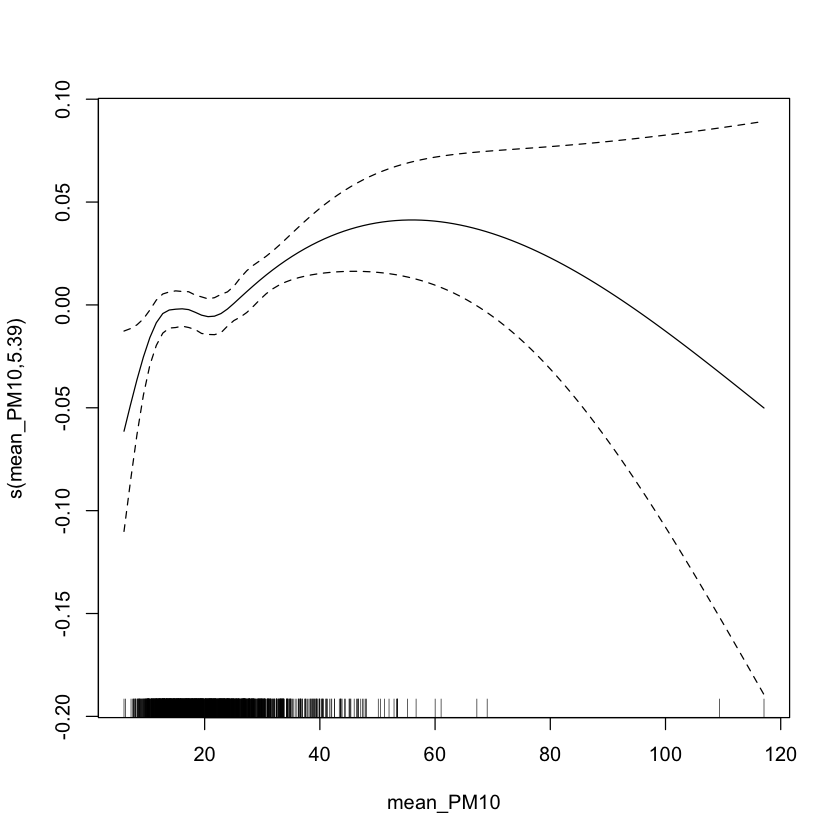

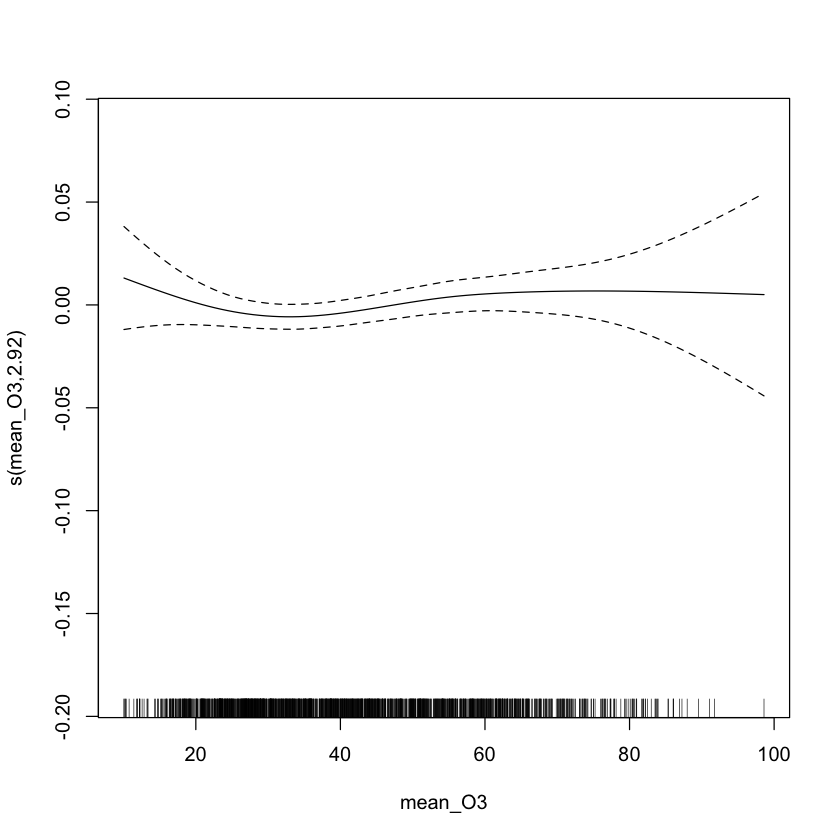


Method: GCV   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-1.387905e-09,2.129621e-10]
(score 0.009236035 & scale 0.009154391).
Hessian positive definite, eigenvalue range [1.239681e-06,5.245646e-06].
Model rank =  41 / 41 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

               k'  edf k-index p-value    
s(min_temp)  8.00 2.18    0.93   0.005 ** 
s(min_hum)   8.00 1.97    0.75  <2e-16 ***
s(mean_PM10) 8.00 5.39    0.98   0.185    
s(mean_O3)   8.00 2.92    1.02   0.735    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


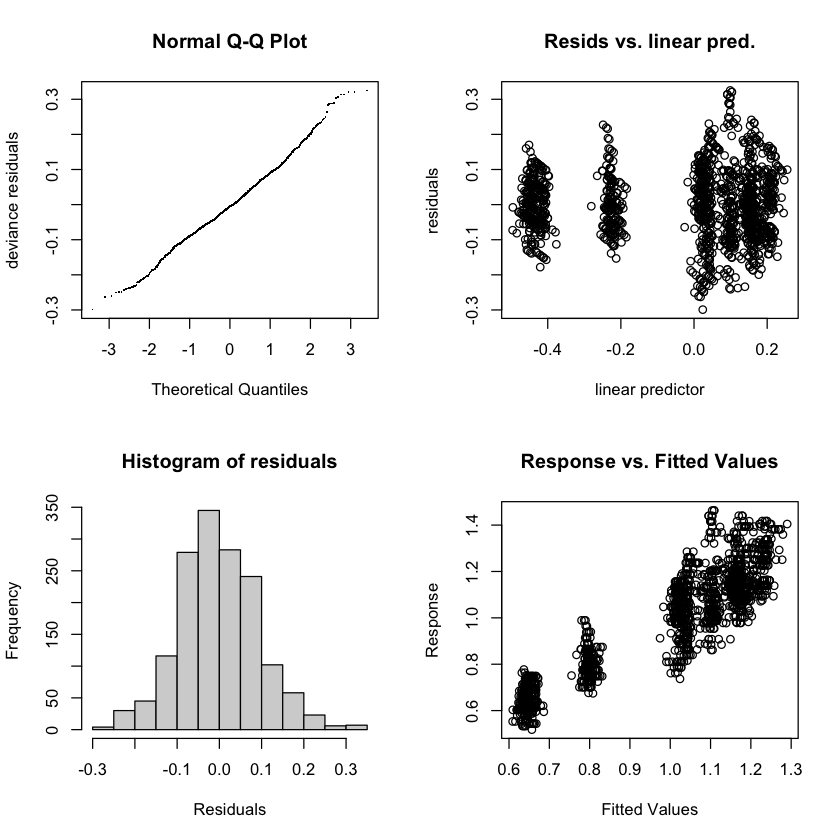

In [19]:
mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT01")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT01")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT03")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cs", k = 9) + s(min_hum, bs = "cs", k = 9) + s(mean_PM10, bs = "cs", k = 9) + s(mean_O3, bs = "cs", k = 9) + year, data = environment[(environment$season=="Winter")&(environment$at_code %in% c("AT03")),], fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)
gam.check(mod_lm_s)

## AT03


Family: quasipoisson 
Link function: log 

Formula:
a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + 
    s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, 
    bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + 
    date + year

Parametric coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.152e+01  9.208e-01  12.507  < 2e-16 ***
date        -8.054e-04  6.213e-05 -12.963  < 2e-16 ***
year11      -7.008e-02  2.661e-02  -2.634  0.00852 ** 
year12       8.484e-01  4.737e-02  17.911  < 2e-16 ***
year13       1.236e+00  6.943e-02  17.801  < 2e-16 ***
year14       1.482e+00  9.153e-02  16.193  < 2e-16 ***
year15       1.902e+00  1.145e-01  16.615  < 2e-16 ***
year16       2.215e+00  1.369e-01  16.173  < 2e-16 ***
year17       2.700e+00  1.588e-01  17.001  < 2e-16 ***
year18       2.905e+00  1.820e-01  15.967  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth te

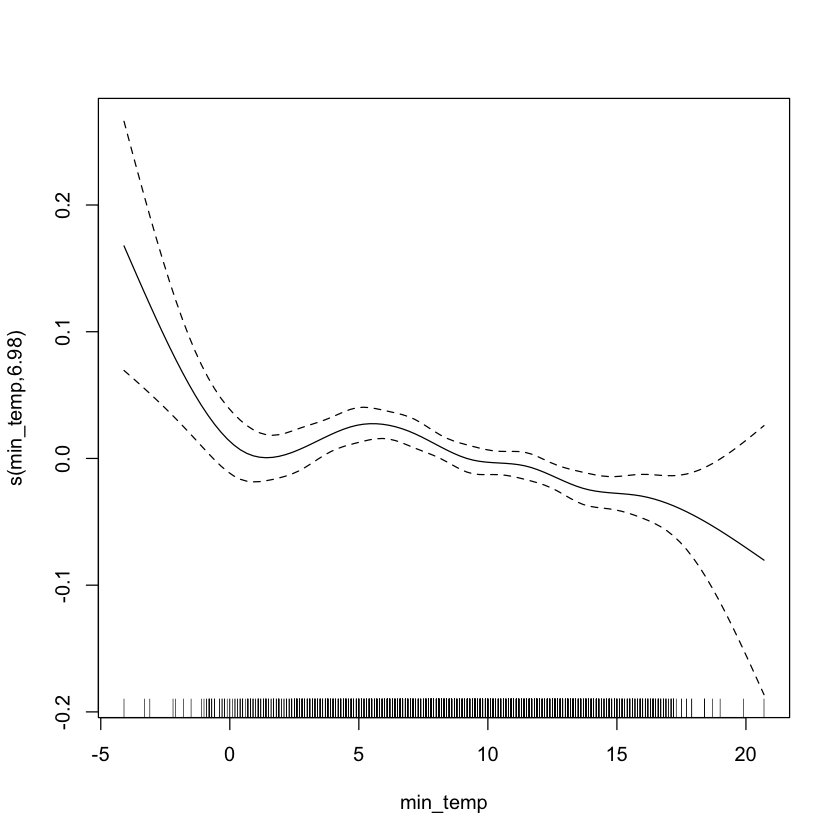

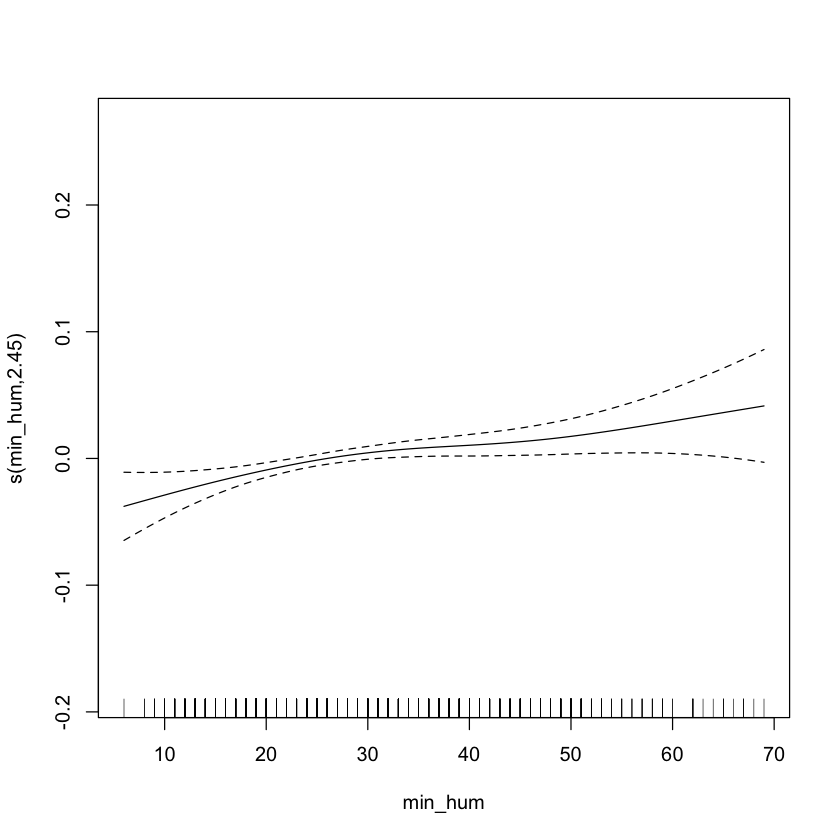

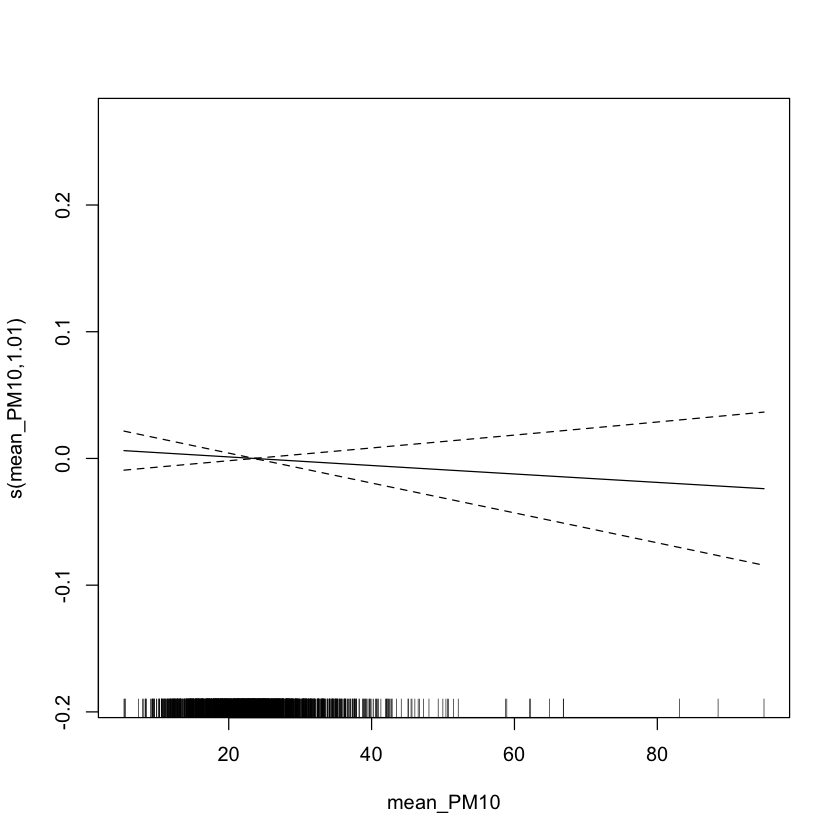

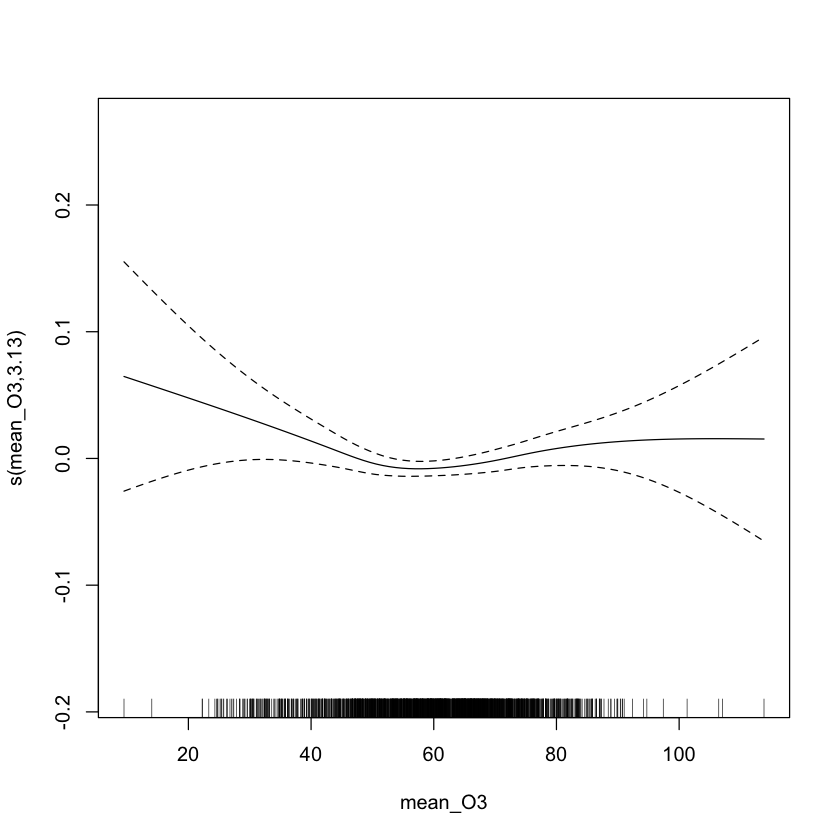

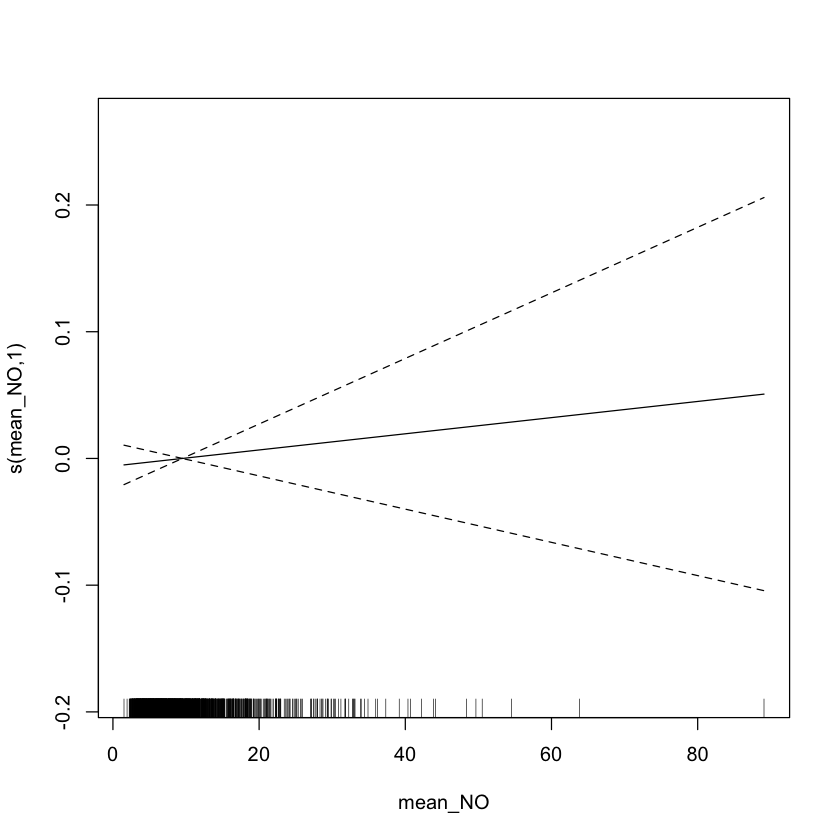

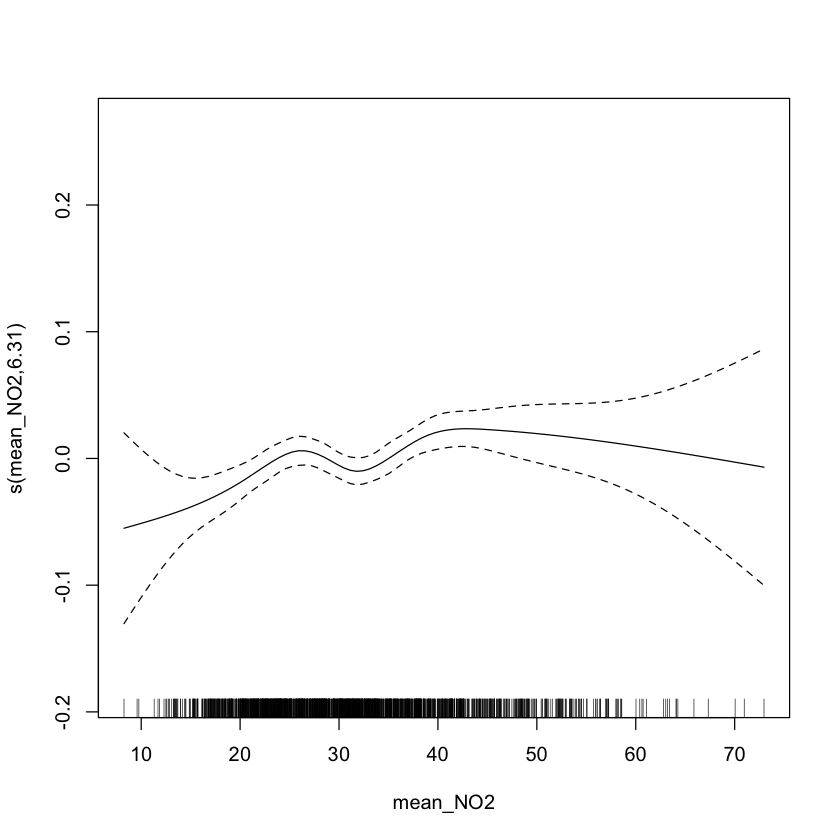

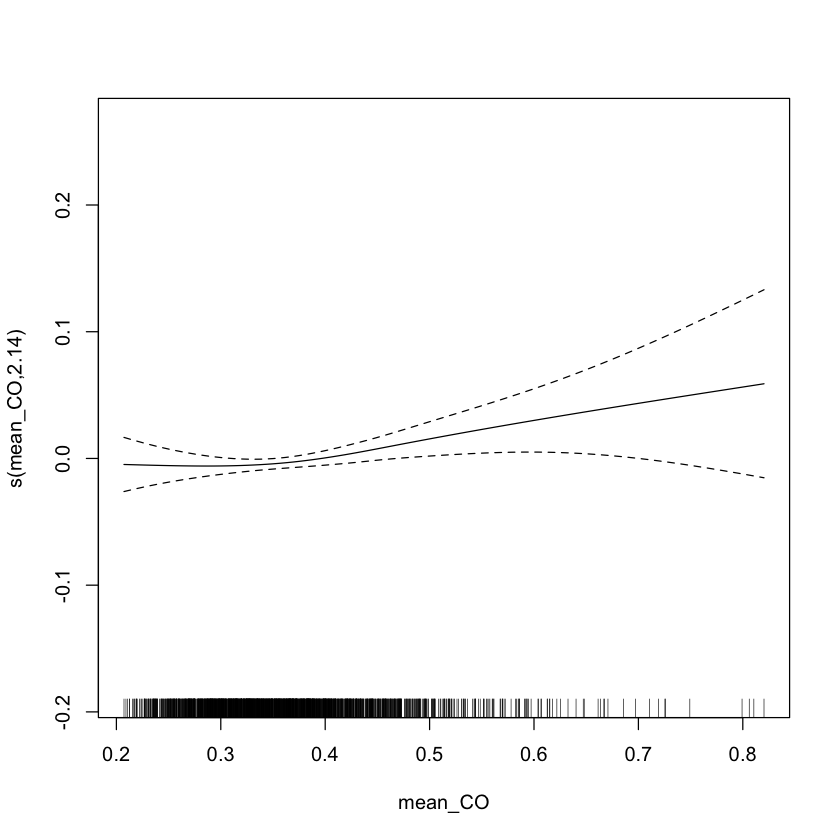

In [20]:
at_code = 'AT03'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Summer",]

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + date + year, data = data, fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)


Family: gaussian 
Link function: identity 

Formula:
a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + 
    s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, 
    bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + 
    date + year

Parametric coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  7.264e-01  3.223e-01   2.253   0.0244 *  
date        -4.261e-06  2.176e-05  -0.196   0.8448    
year11      -2.108e-02  1.314e-02  -1.604   0.1089    
year12       1.439e-01  1.894e-02   7.596 5.36e-14 ***
year13       3.603e-01  2.594e-02  13.890  < 2e-16 ***
year14       3.897e-01  3.286e-02  11.857  < 2e-16 ***
year15       5.078e-01  4.046e-02  12.550  < 2e-16 ***
year16       4.481e-01  4.818e-02   9.300  < 2e-16 ***
year17       5.144e-01  5.612e-02   9.165  < 2e-16 ***
year18       5.878e-01  6.248e-02   9.408  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth t

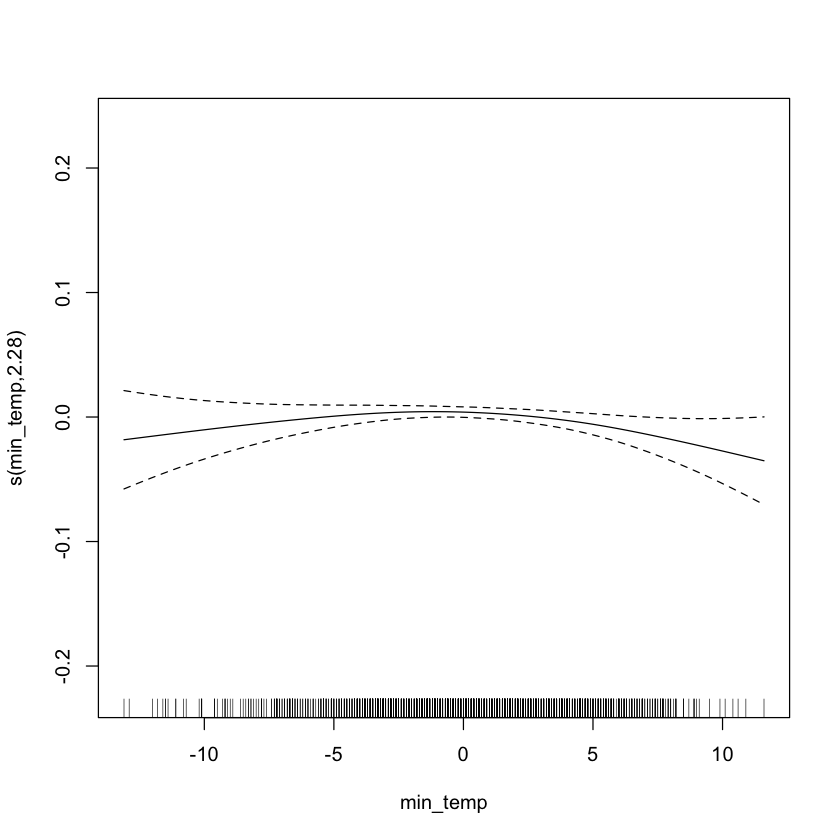

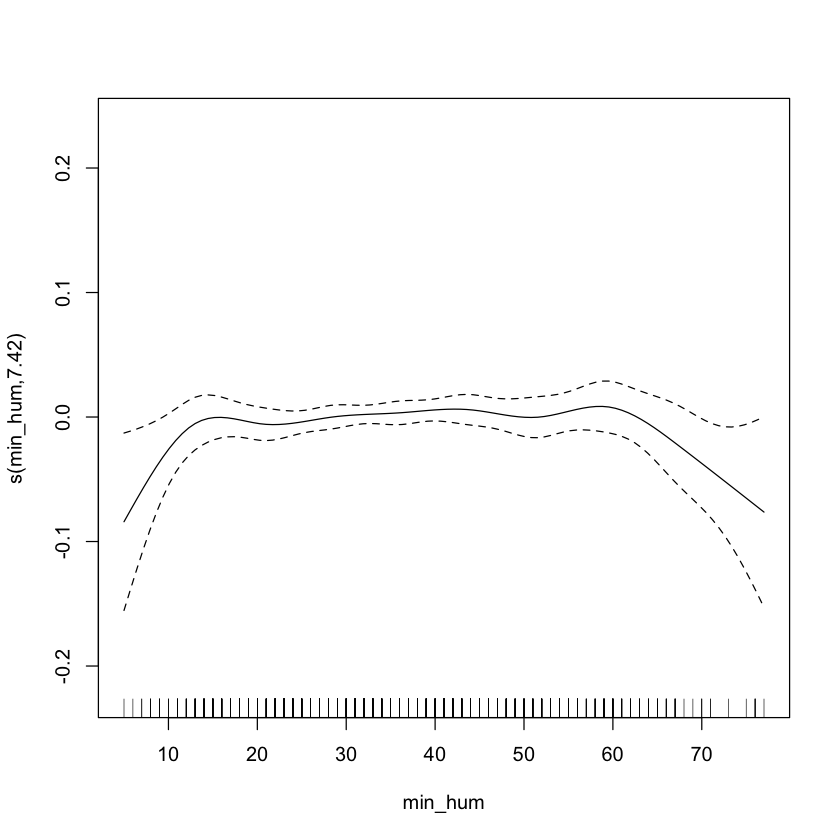

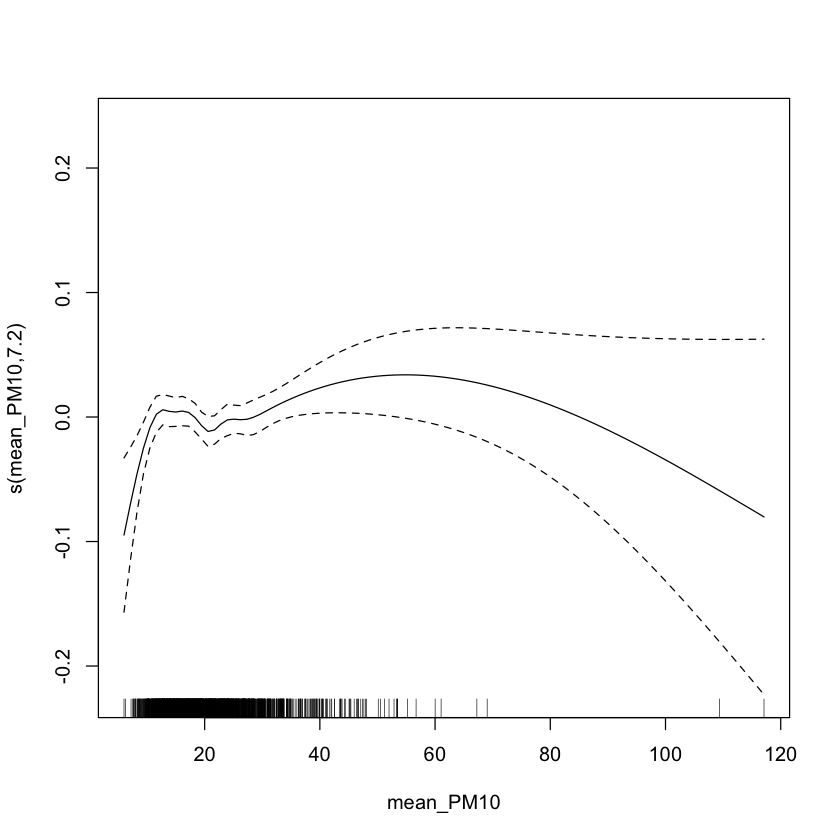

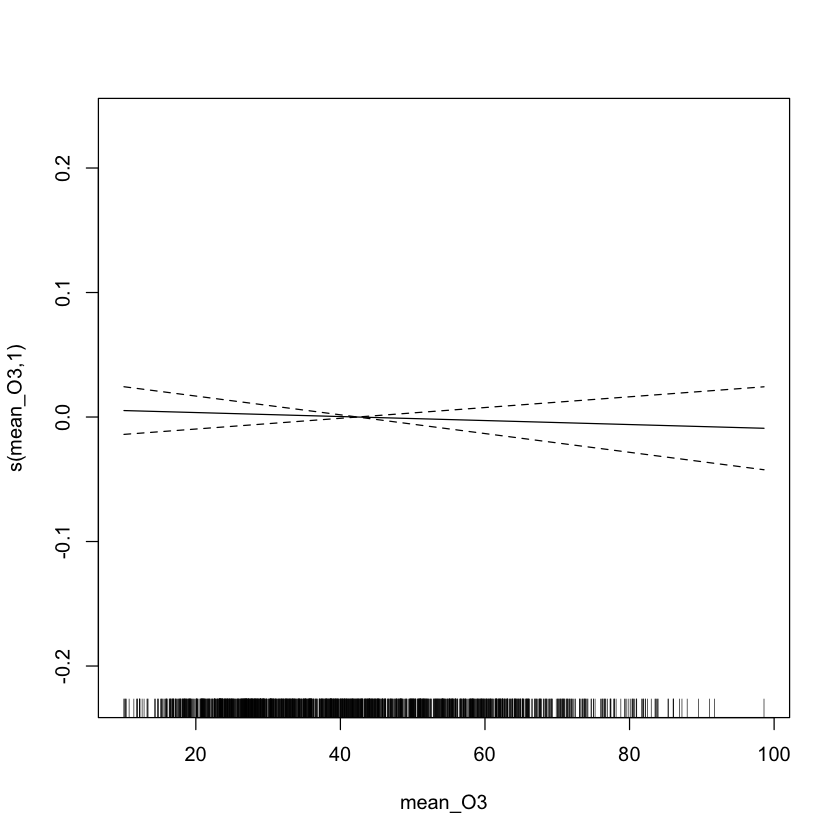

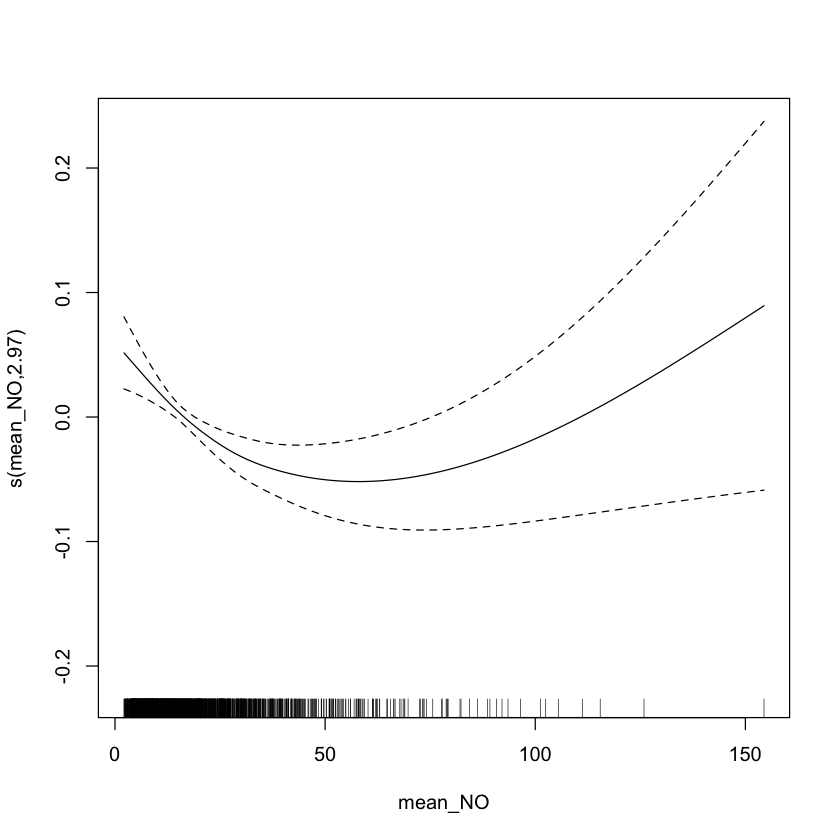

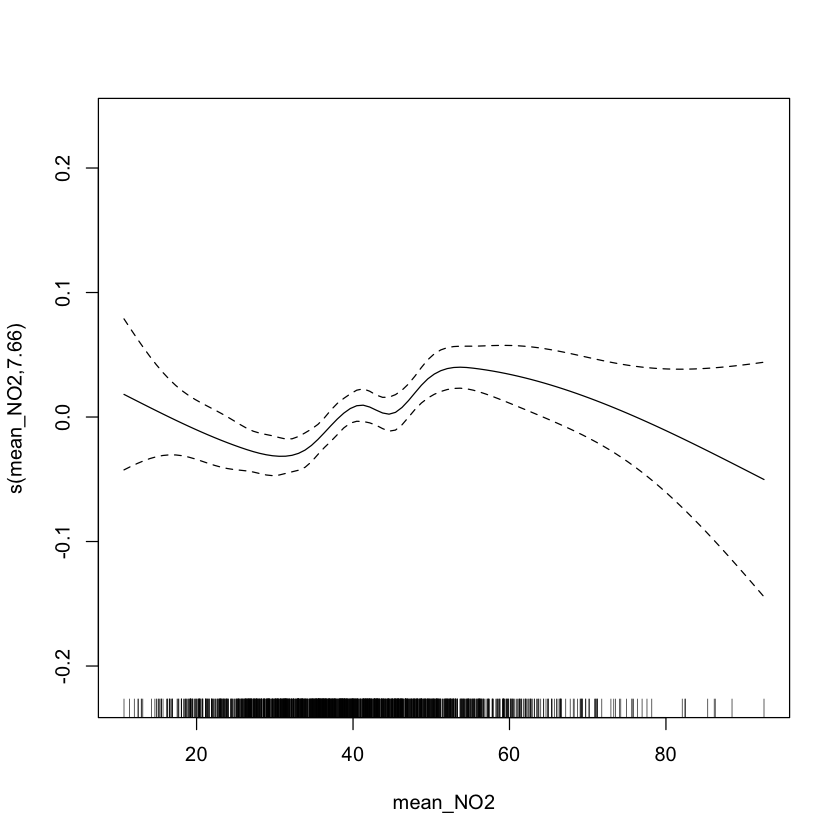

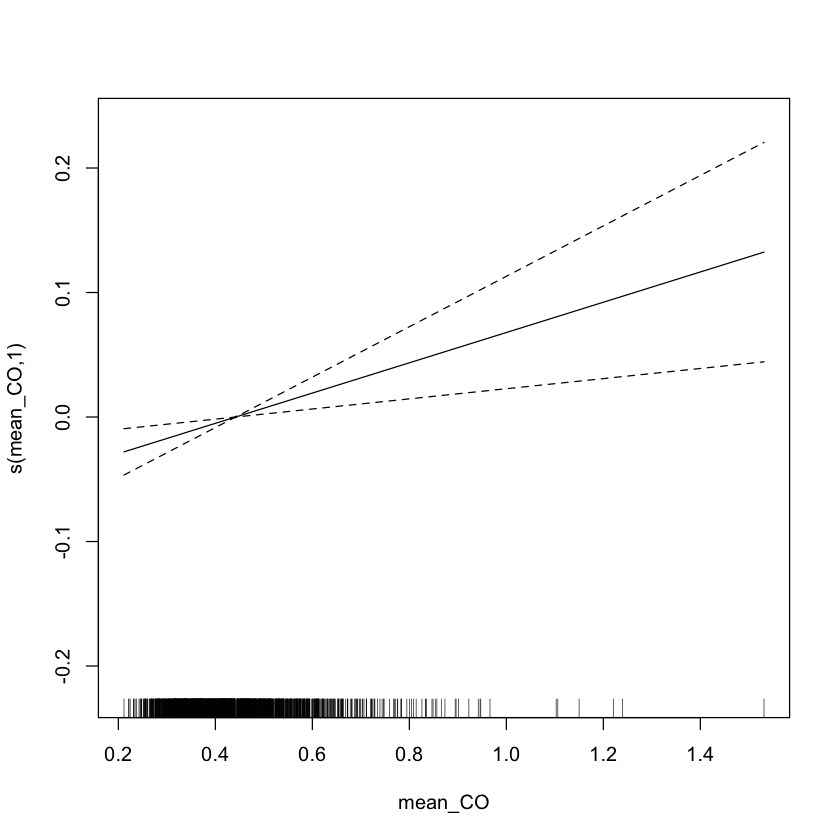

In [21]:
at_code = 'AT03'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Winter",]

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + date + year, data = data, fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)

## AT01


Family: gaussian 
Link function: identity 

Formula:
a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + 
    s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, 
    bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + 
    date + year

Parametric coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.479e+00  1.879e-01   7.873 6.56e-15 ***
date        -3.122e-05  1.266e-05  -2.466   0.0138 *  
year11      -6.233e-03  7.346e-03  -0.849   0.3963    
year12       5.374e-02  1.063e-02   5.056 4.80e-07 ***
year13       1.330e-01  1.460e-02   9.109  < 2e-16 ***
year14       8.774e-02  1.853e-02   4.736 2.39e-06 ***
year15       1.440e-01  2.291e-02   6.287 4.23e-10 ***
year16       1.627e-01  2.744e-02   5.931 3.72e-09 ***
year17       2.430e-01  3.219e-02   7.549 7.52e-14 ***
year18       2.452e-01  3.592e-02   6.826 1.26e-11 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth t

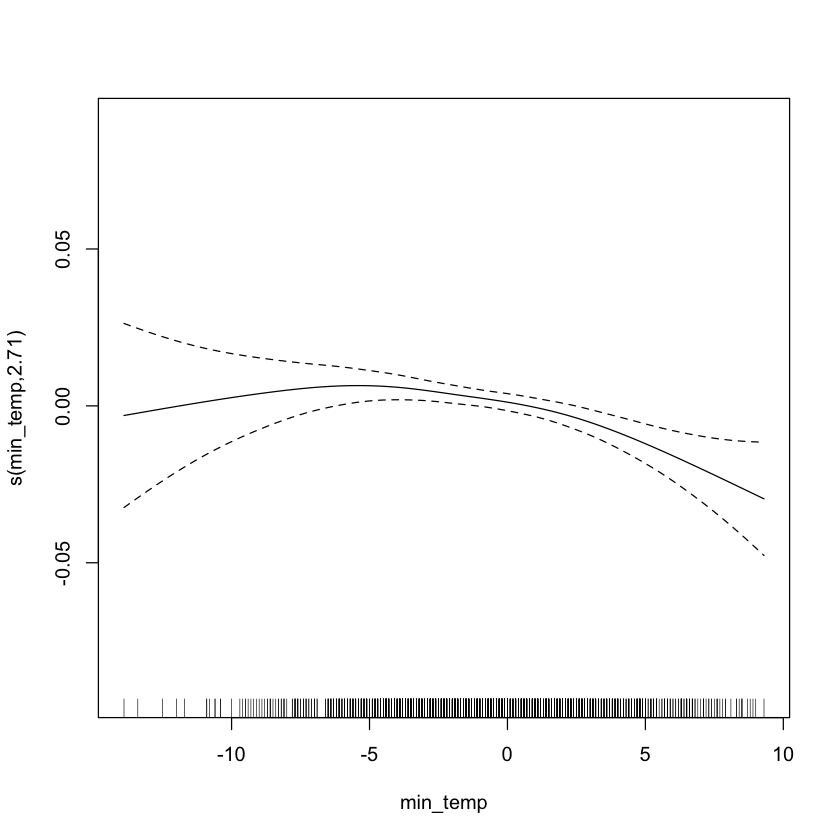

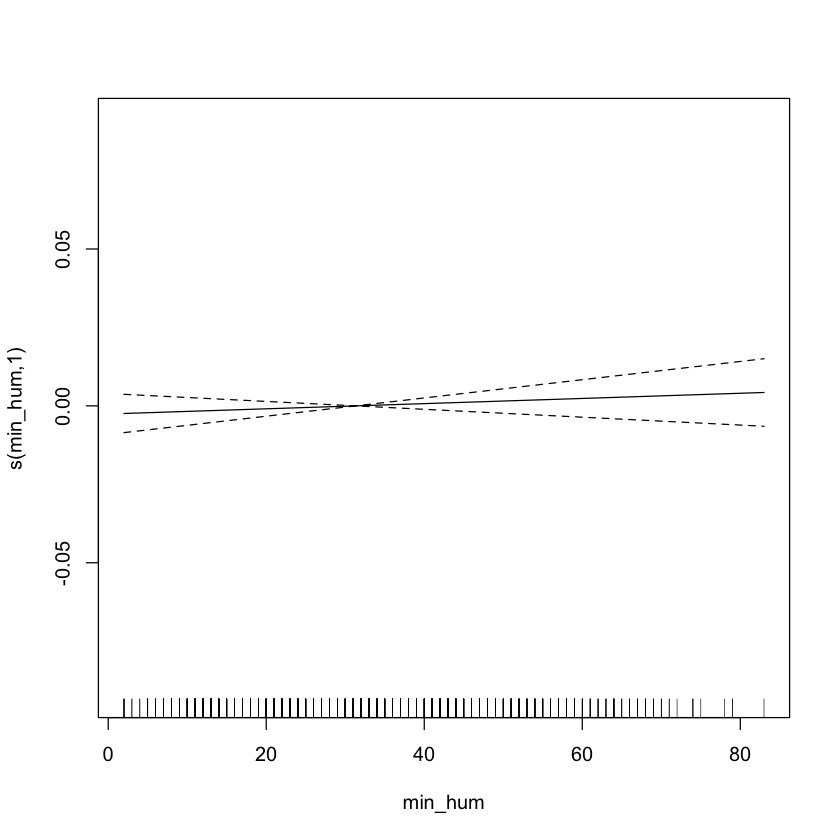

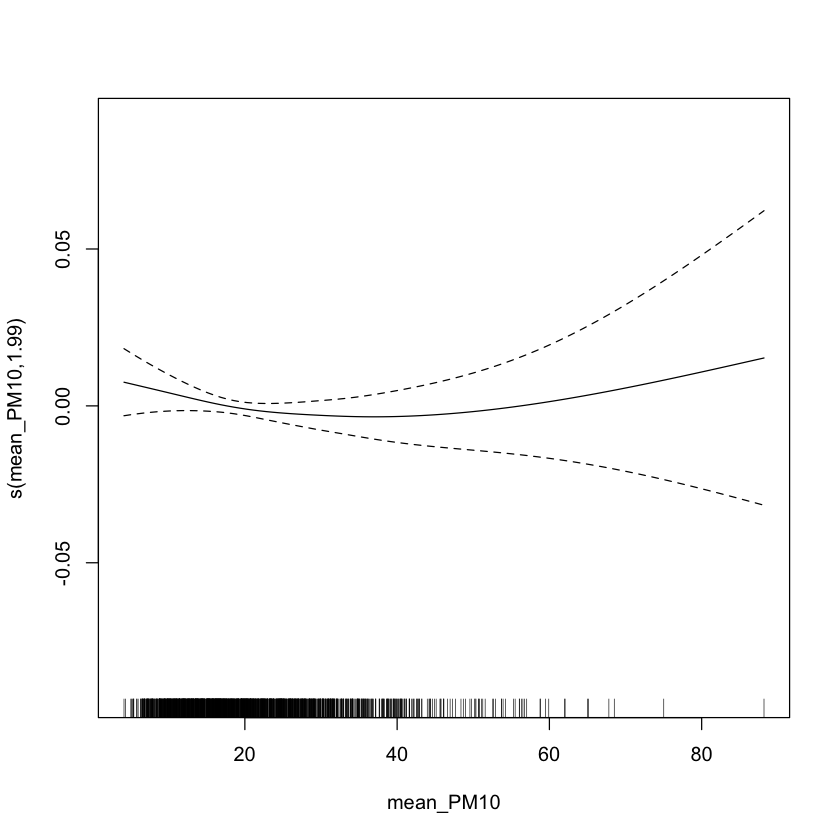

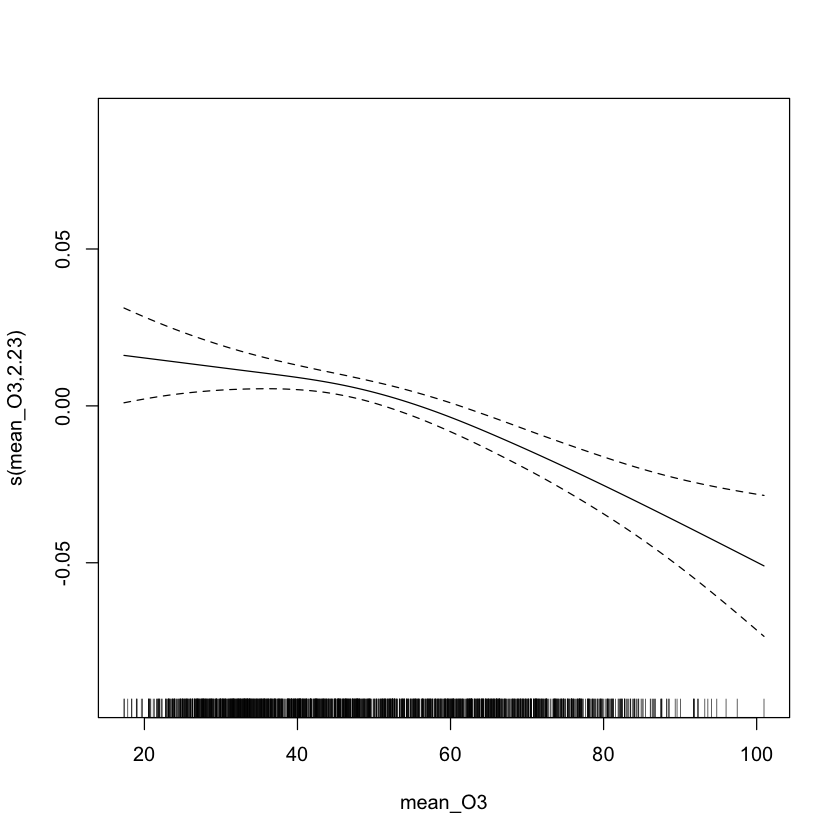

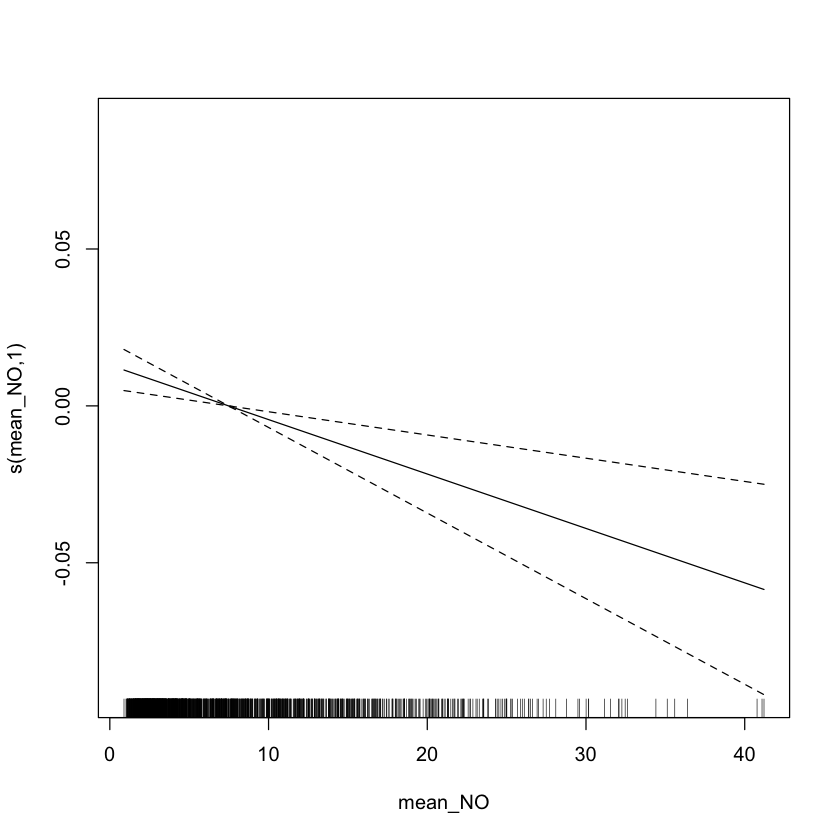

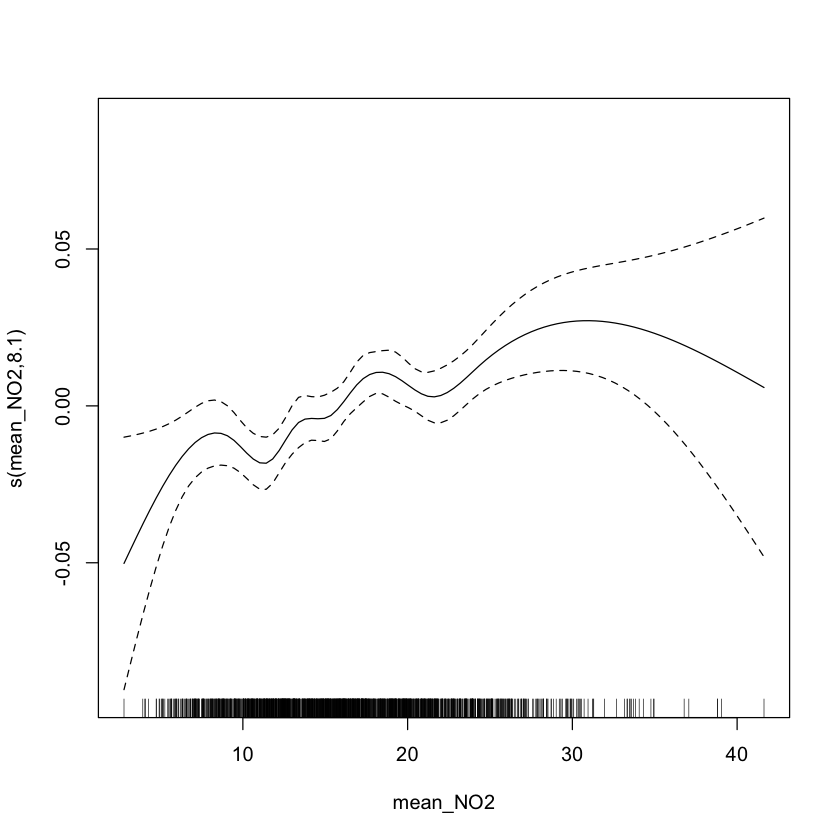

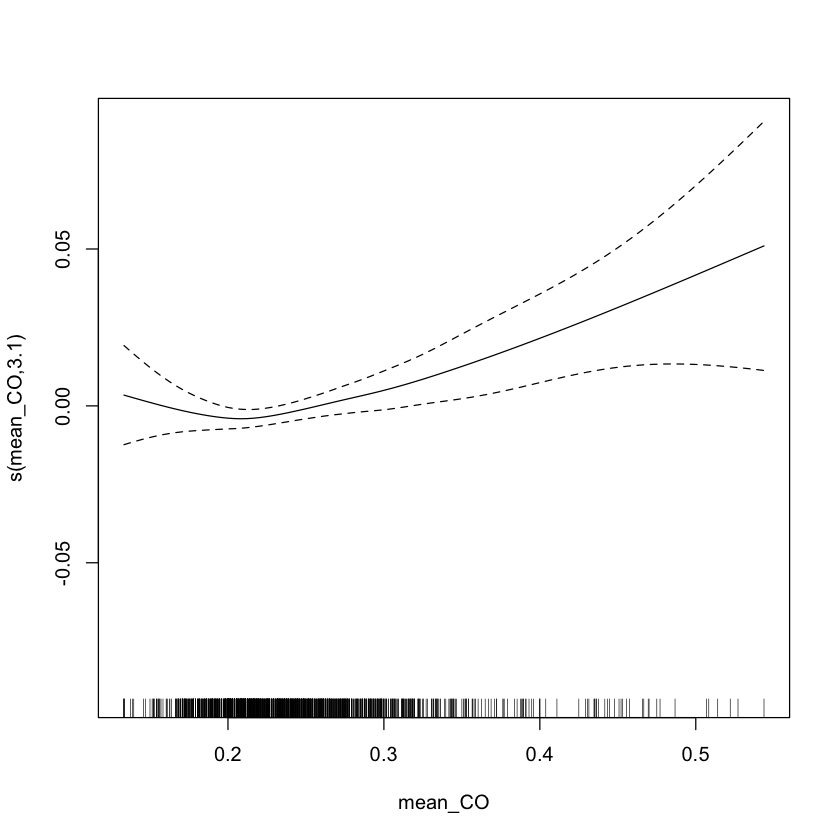

In [22]:
at_code = 'AT01'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Winter",]

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + date + year, data = data, fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)


Family: gaussian 
Link function: identity 

Formula:
a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + 
    s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, 
    bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + 
    date + year

Parametric coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.016e+00  4.102e-01   4.916 9.74e-07 ***
date        -7.772e-05  2.766e-05  -2.810  0.00501 ** 
year11       9.103e-02  1.089e-02   8.359  < 2e-16 ***
year12       1.532e-01  2.051e-02   7.466 1.34e-13 ***
year13       9.693e-02  3.046e-02   3.183  0.00149 ** 
year14       2.312e-01  4.023e-02   5.746 1.09e-08 ***
year15       2.425e-01  5.051e-02   4.801 1.73e-06 ***
year16       2.475e-01  6.063e-02   4.082 4.69e-05 ***
year17       3.436e-01  7.024e-02   4.891 1.10e-06 ***
year18       3.823e-01  8.051e-02   4.749 2.23e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Approximate significance of smooth t

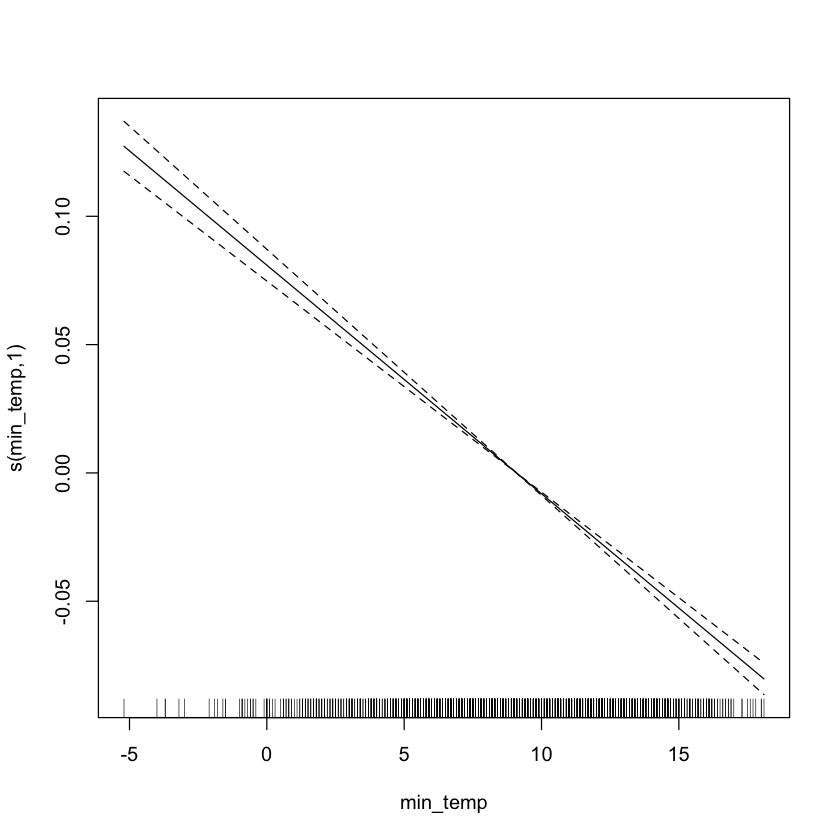

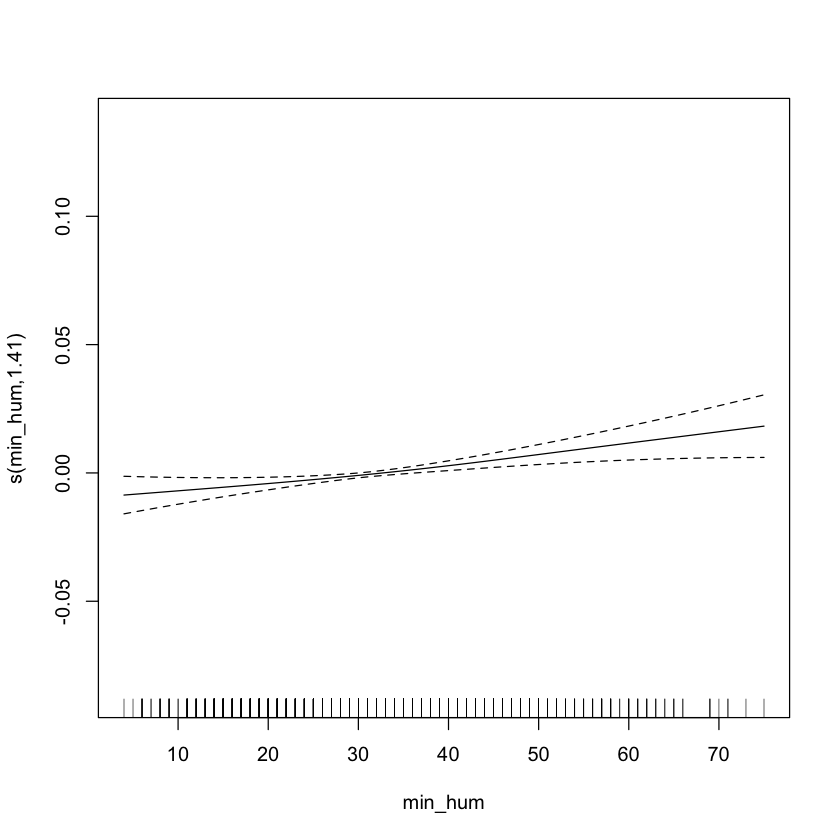

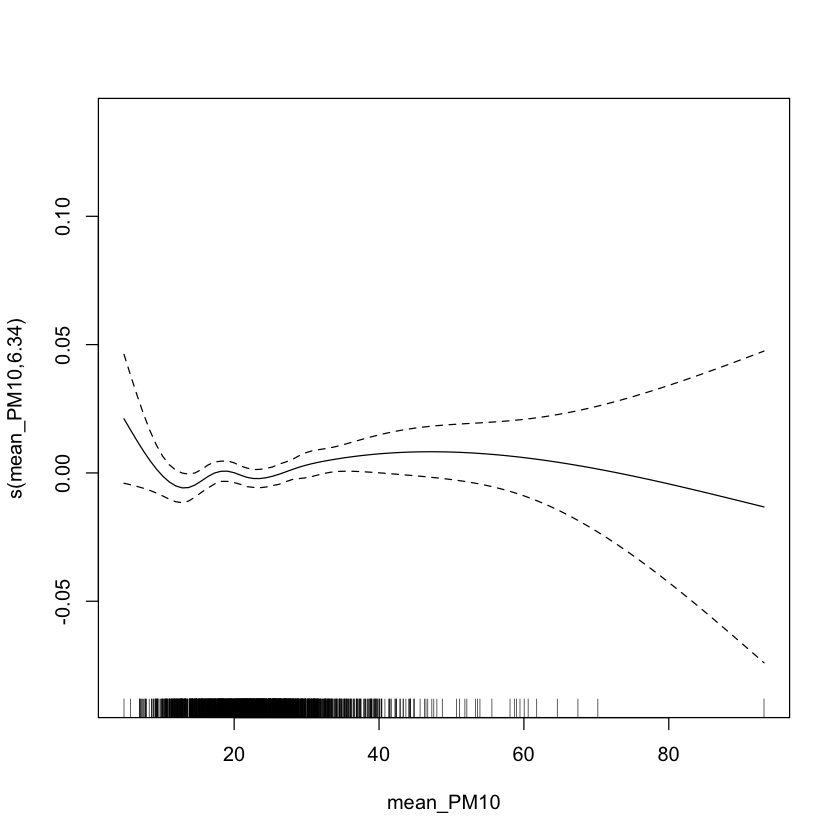

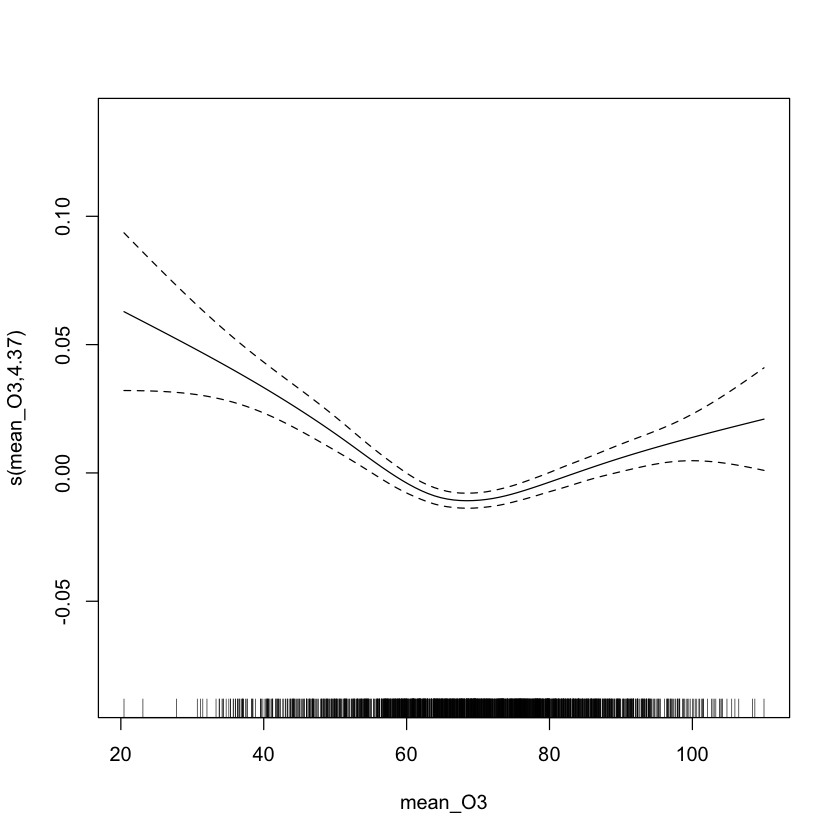

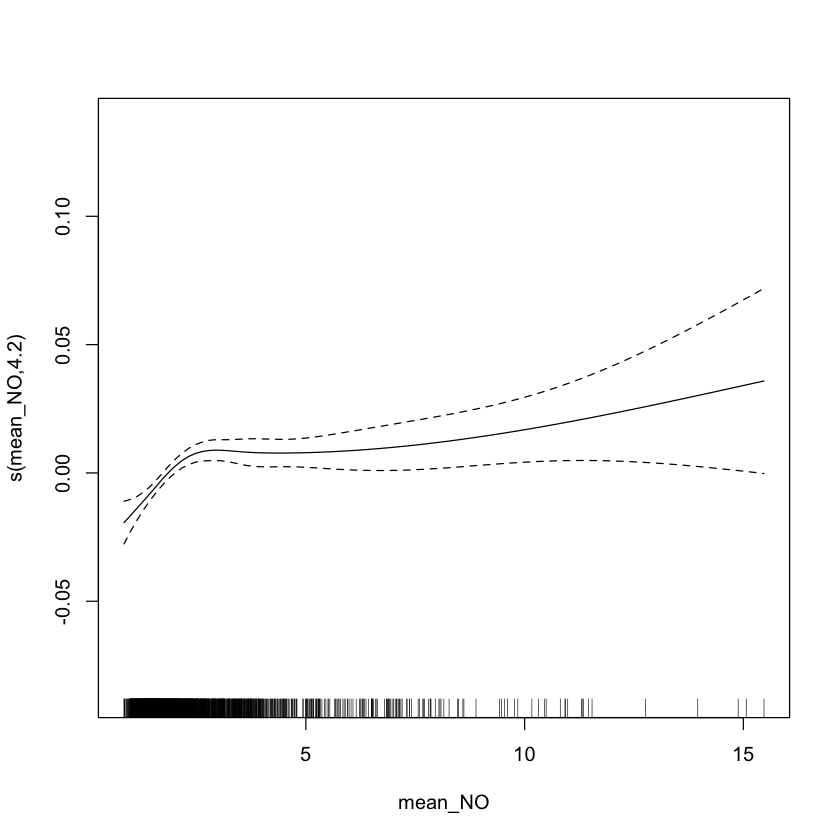

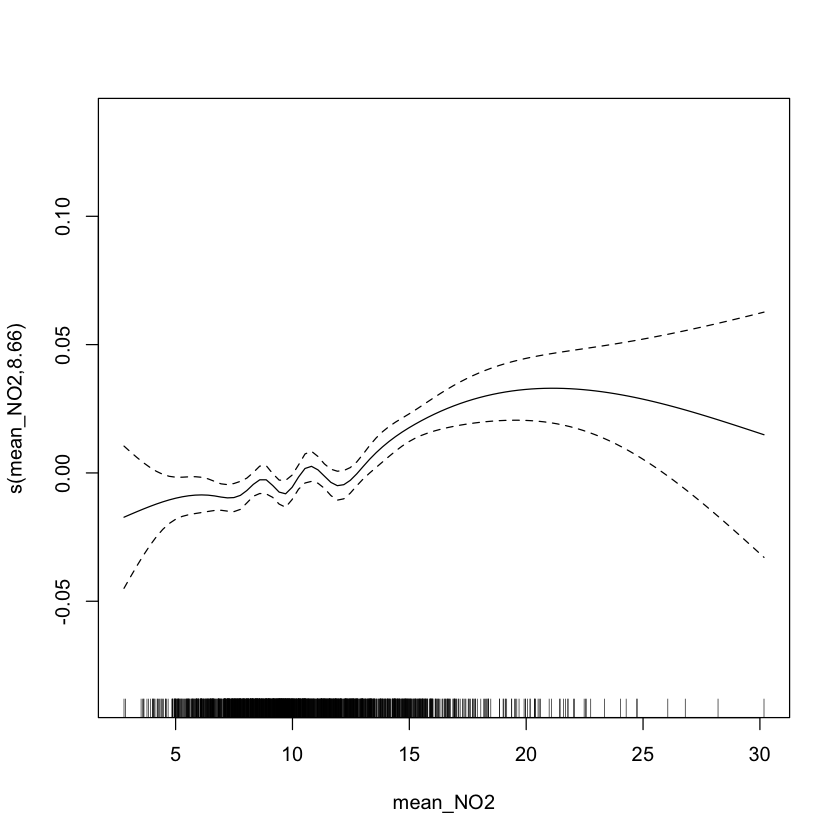

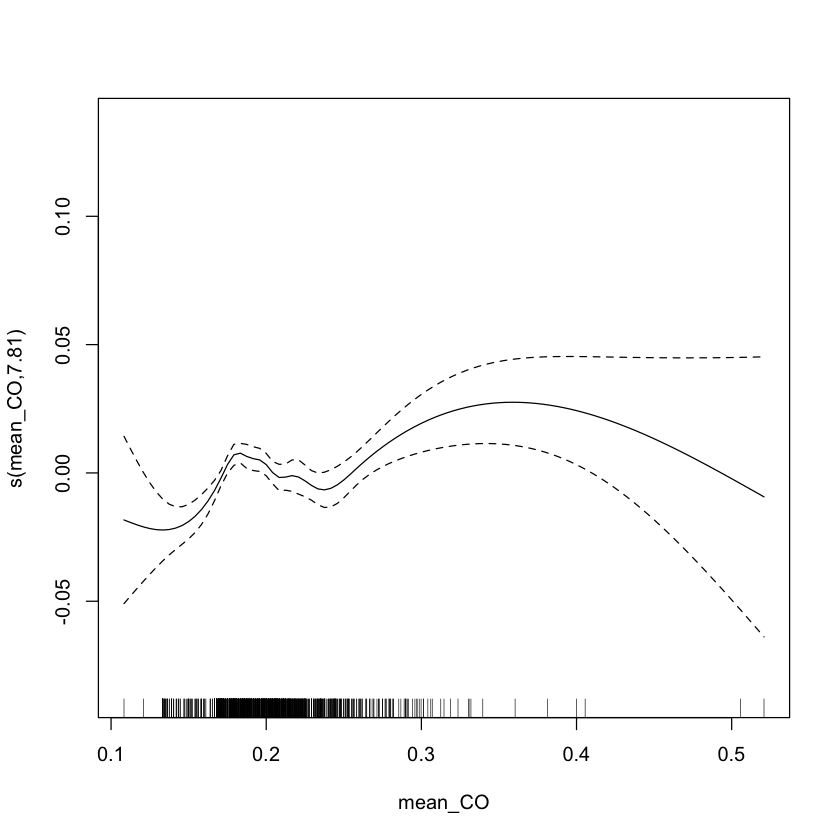

In [23]:
at_code = 'AT01'
data <- environment[environment$at_code== at_code,]
data <- data[data$season== "Summer",]

mod_lm_s = gam(a_asir_90 ~ s(min_temp, bs = "cr") + s(min_hum, bs = "cr") + s(mean_PM10, bs = "cr") + s(mean_O3, bs = "cr") + s(mean_NO, bs = "cr") + s(mean_NO2, bs = "cr") + s(mean_CO, bs = "cr") + date + year, data = data, fAMIly = quasipoisson())
summary(mod_lm_s)
plot(mod_lm_s)